# Project Tasks

**Group members:** Johanna Aspholm, Emilia Miettinen, Jami Heljomaa, Hanlu Li, Xiaoyu Yuan, Mudong Guo, Hao Liu

In the first few assignments, we have learned how to infer part based components (known as mutational signatures) generated by particular mutational processes using Non-negative Matrix Factorization (NMF). By doing this, we are trying to reconstruct the mutation catalog in a given sample with mutational signatures and their contributions.

In this group project, you will use similar mutational profiles and signature activities to predict cancer types but with much larger sample size. 
You should:
* Separate the data into training and test groups within each cancer type.
* Find out which features are informative for the prediction of the cancer type (label). You should try both combining the profiles with activities and using each data type independently.
* Implement different models of your choice for classification of the samples given the input data and evaluate the model performance using test data to avoid overfitting. Explain briefly how does each model that you have used work.
* Report model performance, using standard machine learning metrics such as confusion matrices etc. 
* Compare model performance across methods and across cancer types, are some types easier to predict than others.
* Submit a single Jupyter notebook as the final report and present that during the last assignment session.

# Data

The data include both mutational catalogs from multiple cancers and the predicted activities in the paper ["Alexandrov LB, et al. (2020) The repertoire of mutational signatures in human cancer"](https://www.nature.com/articles/s41586-020-1943-3). The data either are generated from whole human genome (WGS) or only exomes regions (WES). Since the exome region only constitutes about 1% of human genome, the total mutation numbers in these samples are, of course, much smaller. So if you plan to use WGS together with WES data, remember to normalize the profile for each sample to sum up to 1.

Note that, the data is generated from different platforms by different research groups, some of them (e.g. labeled with PCAWG, TCGA) are processed with the same bioinformatics pipeline. Thus, these samples will have less variability related to data processing pipelines.

Cancer types might be labeled under the same tissue, e.g. 'Bone-Benign','Bone-Epith', which can also be combined together or take the one has more samples.

Here is a link to background reading ["Pan-Cancer Analysis of Whole Genomes"](https://www.nature.com/collections/afdejfafdb). Have a look especially at the paper ["A deep learning system accurately classifies primary and metastatic cancers using passenger mutation patterns"](https://www.nature.com/articles/s41467-019-13825-8).

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import random
import os,glob,re
import numpy as np
import pandas as pd # (*) Pandas for data manipulation
import itertools

import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns

import matplotlib.gridspec as gridspec
import matplotlib.lines as lines
import matplotlib.patches as patches
import matplotlib.path as path
import matplotlib.patheffects as patheffects
import matplotlib.transforms as transforms
import matplotlib.ticker as ticker

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import warnings
warnings.filterwarnings("ignore")

## Mutational catalogs and activities - WGS data

In [2]:
## PCAWG data is performed by the same pipeline
PCAWG_wgs_mut = pd.read_csv ("./project_data/catalogs/WGS/WGS_PCAWG.96.csv")
PCAWG_wgs_mut.head(2)

,Mutation type,Trinucleotide,Biliary-AdenoCA::SP117655,Biliary-AdenoCA::SP117556,Biliary-AdenoCA::SP117627,Biliary-AdenoCA::SP117775,Biliary-AdenoCA::SP117332,Biliary-AdenoCA::SP117712,Biliary-AdenoCA::SP117017,Biliary-AdenoCA::SP117031,...,Uterus-AdenoCA::SP94540,Uterus-AdenoCA::SP95222,Uterus-AdenoCA::SP89389,Uterus-AdenoCA::SP90503,Uterus-AdenoCA::SP92460,Uterus-AdenoCA::SP92931,Uterus-AdenoCA::SP91265,Uterus-AdenoCA::SP89909,Uterus-AdenoCA::SP90629,Uterus-AdenoCA::SP95550
0,C>A,ACA,269,114,105,217,52,192,54,196,...,117,233,94,114,257,139,404,97,250,170
1,C>A,ACC,148,56,71,123,36,139,54,102,...,90,167,59,64,268,75,255,78,188,137


Accuracy is the cosine similarity of reconstruct catalog to the observed catalog 

In [3]:
## Activities:
PCAWG_wgs_act = pd.read_csv ("./project_data/activities/WGS/WGS_PCAWG.activities.csv")
PCAWG_wgs_act.head(2)

,Cancer Types,Sample Names,Accuracy,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,SBS7a,...,SBS51,SBS52,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60
0,Biliary-AdenoCA,SP117655,0.968,1496,1296,0,0,1825,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Biliary-AdenoCA,SP117556,0.963,985,0,0,0,922,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
nonPCAWG_wgs_mut = pd.read_csv ("./project_data/catalogs/WGS/WGS_Other.96.csv")
nonPCAWG_wgs_mut.head(2)

,Mutation type,Trinucleotide,ALL::PD4020a,ALL::SJBALL011_D,ALL::SJBALL012_D,ALL::SJBALL020013_D1,ALL::SJBALL020422_D1,ALL::SJBALL020579_D1,ALL::SJBALL020589_D1,ALL::SJBALL020625_D1,...,Stomach-AdenoCa::pfg316T,Stomach-AdenoCa::pfg317T,Stomach-AdenoCa::pfg344T,Stomach-AdenoCa::pfg373T,Stomach-AdenoCa::pfg375T,Stomach-AdenoCa::pfg378T,Stomach-AdenoCa::pfg398T,Stomach-AdenoCa::pfg413T,Stomach-AdenoCa::pfg416T,Stomach-AdenoCa::pfg424T
0,C>A,ACA,35,9,2,7,5,7,3,5,...,133,185,202,185,96,134,12,279,75,135
1,C>A,ACC,16,2,4,10,5,9,1,2,...,48,70,126,88,35,54,16,112,31,91


In [5]:
nonPCAWG_wgs_act = pd.read_csv ("./project_data/activities/WGS/WGS_Other.activities.csv")
nonPCAWG_wgs_act.head(2)

,Cancer Types,Sample Names,Accuracy,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,SBS7a,...,SBS51,SBS52,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60
0,ALL,PD4020a,0.995,208,3006,0,0,365,0,0,...,0,0,0,0,0,0,0,0,0,0
1,ALL,SJBALL011_D,0.905,66,0,0,0,144,0,0,...,0,0,0,0,0,0,0,0,0,0


## Mutational catalogs - WES data

In [6]:
## Performed by TCGA pipeline
TCGA_wes_mut = pd.read_csv ("./project_data/catalogs/WES/WES_TCGA.96.csv")
TCGA_wes_mut.head(2)

,Mutation type,Trinucleotide,AML::TCGA-AB-2802-03B-01W-0728-08,AML::TCGA-AB-2803-03B-01W-0728-08,AML::TCGA-AB-2804-03B-01W-0728-08,AML::TCGA-AB-2805-03B-01W-0728-08,AML::TCGA-AB-2806-03B-01W-0728-08,AML::TCGA-AB-2807-03B-01W-0728-08,AML::TCGA-AB-2808-03B-01W-0728-08,AML::TCGA-AB-2809-03D-01W-0755-09,...,Eye-Melanoma::TCGA-WC-A885-01A-11D-A39W-08,Eye-Melanoma::TCGA-WC-A888-01A-11D-A39W-08,Eye-Melanoma::TCGA-WC-A88A-01A-11D-A39W-08,Eye-Melanoma::TCGA-WC-AA9A-01A-11D-A39W-08,Eye-Melanoma::TCGA-WC-AA9E-01A-11D-A39W-08,Eye-Melanoma::TCGA-YZ-A980-01A-11D-A39W-08,Eye-Melanoma::TCGA-YZ-A982-01A-11D-A39W-08,Eye-Melanoma::TCGA-YZ-A983-01A-11D-A39W-08,Eye-Melanoma::TCGA-YZ-A984-01A-11D-A39W-08,Eye-Melanoma::TCGA-YZ-A985-01A-11D-A39W-08
0,C>A,ACA,0,0,0,0,4,0,2,0,...,1,0,0,0,0,0,0,0,0,0
1,C>A,ACC,0,2,0,0,0,1,3,0,...,0,0,0,0,0,0,0,1,0,0


In [7]:
##Activities
TCGA_wes_act = pd.read_csv("./project_data/activities/WES/WES_TCGA.activities.csv")
TCGA_wes_act.head(2)

,Cancer Types,Sample Names,Accuracy,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,SBS7a,...,SBS51,SBS52,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60
0,AML,TCGA-AB-2802-03B-01W-0728-08,0.811,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,AML,TCGA-AB-2803-03B-01W-0728-08,0.608,4,0,0,0,7,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
other_wes_mut = pd.read_csv("./project_data/catalogs/WES/WES_Other.96.csv")
other_wes_mut.head(2)

,Mutation type,Trinucleotide,ALL::TARGET-10-PAIXPH-03A-01D,ALL::TARGET-10-PAKHZT-03A-01R,ALL::TARGET-10-PAKMVD-09A-01D,ALL::TARGET-10-PAKSWW-03A-01D,ALL::TARGET-10-PALETF-03A-01D,ALL::TARGET-10-PALLSD-09A-01D,ALL::TARGET-10-PAMDKS-03A-01D,ALL::TARGET-10-PAPJIB-04A-01D,...,Head-SCC::V-109,Head-SCC::V-112,Head-SCC::V-116,Head-SCC::V-119,Head-SCC::V-123,Head-SCC::V-124,Head-SCC::V-125,Head-SCC::V-14,Head-SCC::V-29,Head-SCC::V-98
0,C>A,ACA,0,0,0,1,0,0,0,2,...,0,0,0,0,0,0,0,0,0,1
1,C>A,ACC,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0


In [9]:
other_wes_act = pd.read_csv("./project_data/activities/WES/WES_Other.activities.csv")
other_wes_act.head(2)

,Cancer Types,Sample Names,Accuracy,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,SBS7a,...,SBS51,SBS52,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60
0,ALL,TARGET-10-PAIXPH-03A-01D,0.529,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,ALL,TARGET-10-PAKHZT-03A-01R,0.696,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


## PCAWG WGS

In [10]:
# lets just visualise the data first

# first, PCAWG WGS data

# create a temp dataframe without the two first cols
temp = PCAWG_wgs_mut.drop(["Mutation type", "Trinucleotide"], axis=1)
temp.head()

c_list = []
cancer_list = temp.columns.values
for i in cancer_list:
    c_list.append(i.split("::",1)[0])
    
# get unique names
c_list = list(set(c_list))
c_list

# a dict to hold the sums of all columns, key = cancer name, values = list of sums of each sample
sum_dict = {}

for cancer in c_list:
    for column in PCAWG_wgs_mut.columns.values:
        if cancer in column:
            if cancer not in sum_dict.keys():
                sum_dict[cancer] = []
            sum_dict[cancer].append(PCAWG_wgs_mut.loc[:,column].sum())   

In [11]:
# this is for the PCAWG WGS data set
_, ax = plt.subplots(nrows = len(sum_dict)//3+1, ncols = 3, figsize = (16, 5*len(sum_dict)/(3+1)))

                     
# iterate over the keys
for i, (name, values) in enumerate(sum_dict.items()):
    x = i % 3
    y = i // 3
    # sample index on x-axis, values on y-axis
    ax[y,x].scatter(np.arange(len(sum_dict[name])), sorted(sum_dict[name]), label=name)
    ax[y,x].set_title(name)
    ax[y,x].legend()

NameError: name 'plt' is not defined

## Other WGS (non PCAWG)*

In [ ]:
# create a temp dataframe without the two first cols
temp1 = nonPCAWG_wgs_mut.drop(["Mutation type", "Trinucleotide"], axis=1)

c_list = []
cancer_list = temp1.columns.values
for i in cancer_list:
    c_list.append(i.split("::",1)[0])
    
# get unique names
c_list = list(set(c_list))
c_list

# a dict to hold the sums of all columns, key = cancer name, values = list of sums of each sample
sum_dict = {}

for cancer in c_list:
    for column in nonPCAWG_wgs_mut.columns.values:
        if cancer in column:
            if cancer not in sum_dict.keys():
                sum_dict[cancer] = []
            sum_dict[cancer].append(nonPCAWG_wgs_mut.loc[:,column].sum()) 

In [ ]:
_, ax = plt.subplots(nrows = len(sum_dict)//3+1, ncols = 3, figsize = (16, 5*len(sum_dict)/(3+1)))

                     
# iterate over the keys
for i, (name, values) in enumerate(sum_dict.items()):
    x = i % 3
    y = i // 3
    # sample index on x-axis, values on y-axis
    ax[y,x].scatter(np.arange(len(sum_dict[name])), sorted(sum_dict[name]), label=name)
    ax[y,x].set_title(name)
    ax[y,x].legend()

## TCGA WES

In [ ]:
# create a temp dataframe without the two first cols
temp = TCGA_wes_mut.drop(["Mutation type", "Trinucleotide"], axis=1)

c_list = []
cancer_list = temp.columns.values
for i in cancer_list:
    c_list.append(i.split("::",1)[0])
    
# get unique names
c_list = list(set(c_list))
c_list

# a dict to hold the sums of all columns, key = cancer name, values = list of sums of each sample
sum_dict = {}

for cancer in c_list:
    for column in TCGA_wes_mut.columns.values:
        if cancer in column:
            if cancer not in sum_dict.keys():
                sum_dict[cancer] = []
            sum_dict[cancer].append(TCGA_wes_mut.loc[:,column].sum()) 

In [ ]:
_, ax = plt.subplots(nrows = len(sum_dict)//3+1, ncols = 3, figsize = (16, 5*len(sum_dict)/(3+1)))

                     
# iterate over the keys
for i, (name, values) in enumerate(sum_dict.items()):
    x = i % 3
    y = i // 3
    # sample index on x-axis, values on y-axis
    ax[y,x].scatter(np.arange(len(sum_dict[name])), sorted(sum_dict[name]), label=name)
    ax[y,x].set_yscale('log')
    ax[y,x].set_title(name)
    ax[y,x].legend()

## TCGA Other (other wes mut)

In [ ]:
# create a temp dataframe without the two first cols
temp = other_wes_mut.drop(["Mutation type", "Trinucleotide"], axis=1)

c_list = []
cancer_list = temp.columns.values
for i in cancer_list:
    c_list.append(i.split("::",1)[0])
    
# get unique names
c_list = list(set(c_list))
c_list

# a dict to hold the sums of all columns, key = cancer name, values = list of sums of each sample
sum_dict = {}

for cancer in c_list:
    for column in other_wes_mut.columns.values:
        if cancer in column:
            if cancer not in sum_dict.keys():
                sum_dict[cancer] = []
            sum_dict[cancer].append(other_wes_mut.loc[:,column].sum()) 

In [ ]:
_, ax = plt.subplots(nrows = len(sum_dict)//3+1, ncols = 3, figsize = (16, 5*len(sum_dict)/(3+1)))

                     
# iterate over the keys
for i, (name, values) in enumerate(sum_dict.items()):
    x = i % 3
    y = i // 3
    # sample index on x-axis, values on y-axis
    ax[y,x].scatter(np.arange(len(sum_dict[name])), sorted(sum_dict[name]), label=name)
    ax[y,x].set_yscale('log')
    ax[y,x].set_title(name)
    ax[y,x].legend()

# EDA & Data Preprocess
## Load Data

In [502]:
import pandas as pd
import numpy as np

def process_dataset(file_path):
    data = pd.read_csv(file_path)
    
    if 'cat' in file_path:
        data = data.set_index(data['Mutation type'] + "_" + data['Trinucleotide'])
        cancer_types = np.array([s.split(":")[0] for s in data.columns[2:]])
        data = data.iloc[:, 2:].T
    else:
        cancer_types = np.array([s.split(":")[0] for s in data.iloc[:, 0]])
        data = data.iloc[:, 3:]
        
    data = data.set_index(cancer_types)
    return data, cancer_types

In [503]:
catalogs_wgs_pcawg, cancer_types_wgs_pcawg = process_dataset('./project_data/catalogs/WGS/WGS_PCAWG.96.csv')
activity_wgs_pcawg, cancer_types_wgs_act = process_dataset('./project_data/activities/WGS/WGS_PCAWG.activities.csv')

catalogs_wes_tcga, cancer_types_wes_cat = process_dataset('./project_data/catalogs/WES/WES_TCGA.96.csv')
activity_wes_tcga, cancer_types_wes_act = process_dataset('./project_data/activities/WES/WES_TCGA.activities.csv')


In [516]:
catalogs_wgs_pcawg

,C>A_ACA,C>A_ACC,C>A_ACG,C>A_ACT,C>A_CCA,C>A_CCC,C>A_CCG,C>A_CCT,C>A_GCA,C>A_GCC,...,T>G_CTG,T>G_CTT,T>G_GTA,T>G_GTC,T>G_GTG,T>G_GTT,T>G_TTA,T>G_TTC,T>G_TTG,T>G_TTT
Biliary-AdenoCA,269,148,25,154,215,148,27,180,165,76,...,49,268,19,17,43,89,83,48,63,197
Biliary-AdenoCA,114,56,13,70,63,49,7,69,81,37,...,23,53,8,5,20,15,26,10,31,64
Biliary-AdenoCA,105,71,13,73,71,55,8,61,61,50,...,8,44,7,6,14,14,16,8,15,52
Biliary-AdenoCA,217,123,29,126,129,82,26,143,162,84,...,43,132,21,7,28,34,38,30,53,122
Biliary-AdenoCA,52,36,8,31,30,22,10,38,21,25,...,8,18,2,4,7,7,15,8,16,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uterus-AdenoCA,139,75,13,68,69,52,16,55,73,32,...,23,82,8,9,14,23,19,13,25,66
Uterus-AdenoCA,404,255,52,281,339,170,52,261,264,137,...,88,230,57,32,97,118,83,49,108,223
Uterus-AdenoCA,97,78,14,80,204,390,92,876,77,62,...,75,76,10,7,10,24,19,17,34,106
Uterus-AdenoCA,250,188,49,202,194,124,28,150,142,95,...,87,197,42,35,72,113,108,92,103,270


## EDA: Basic statistic information 

In [508]:
catalogs_wgs_pcawg.isnull().sum().sum()

0

## Target feature distribution

In [510]:
def plot_distr(data_name,data):
    counts = pd.DataFrame(data, columns=['cancer_types']).value_counts()

    plt.figure(figsize=(4, 3))
    counts.plot(kind='barh', color='skyblue')
    plt.title('Cancer Type Distribution'+data_name)
    plt.xlabel('Cancer Type')
    plt.ylabel('Count')
    plt.show()

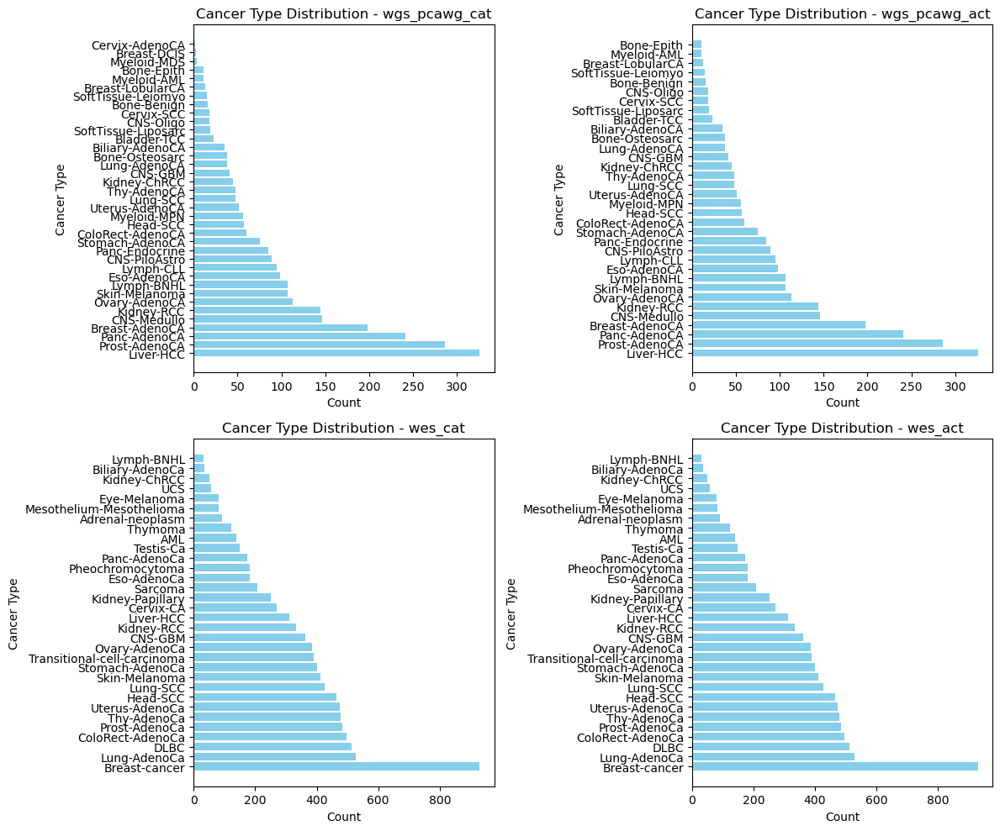

In [511]:
cancer_types_data = [cancer_types_wgs_pcawg, cancer_types_wgs_pcawg_act, cancer_types_wes_cat, cancer_types_wes_act]
cancer_type_name = ['wgs_pcawg_cat', 'wgs_pcawg_act', 'wes_cat', 'wes_act']
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

for i, ax in enumerate(axes.flatten()):
    cancer_type_data = cancer_types_data[i]
    counts = pd.DataFrame(cancer_type_data, columns=['cancer_types']).value_counts().reset_index(name='count')
    
    ax.barh(counts['cancer_types'], counts['count'], color='skyblue')
    
    ax.set_title(f'Cancer Type Distribution - '+ cancer_type_name[i])
    ax.set_xlabel('Count')
    ax.set_ylabel('Cancer Type')

plt.tight_layout()

plt.show()


## Data Clean

In [512]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def clean_and_plot(catalogs_wgs_pcawg, cancer_types_wgs_pcawg):
    # Calculate the sample counts for each cancer type
    sample_counts = catalogs_wgs_pcawg.groupby(cancer_types_wgs_pcawg).size()

    # Find cancer types with fewer than 5 samples
    less_than_5 = sample_counts[sample_counts < 5]
    if len(less_than_5) >0:
        # Remove cancer types with fewer than 5 samples and their corresponding samples
        catalogs_wgs_pcawg_cleaned = catalogs_wgs_pcawg[~catalogs_wgs_pcawg.index.isin(less_than_5.index)]

        # Update the cancer types array, excluding those with fewer than 5 samples
        updated_cancer_types = np.array(catalogs_wgs_pcawg_cleaned.index.str.split("_").str[0])

        # Plot a bar chart of deleted samples count for cancer types with < 5 samples
        less_than_5.plot(kind='bar', title='Deleted Samples Count for Cancer Types with < 5 Samples')
        plt.xlabel('Cancer Types')
        plt.ylabel('Sample Count')
        plt.show()

        # Return the cleaned data and the updated cancer types array
        return catalogs_wgs_pcawg_cleaned, updated_cancer_types
    print("Every Class has enough samples.")
    return catalogs_wgs_pcawg, cancer_types_wgs_pcawg


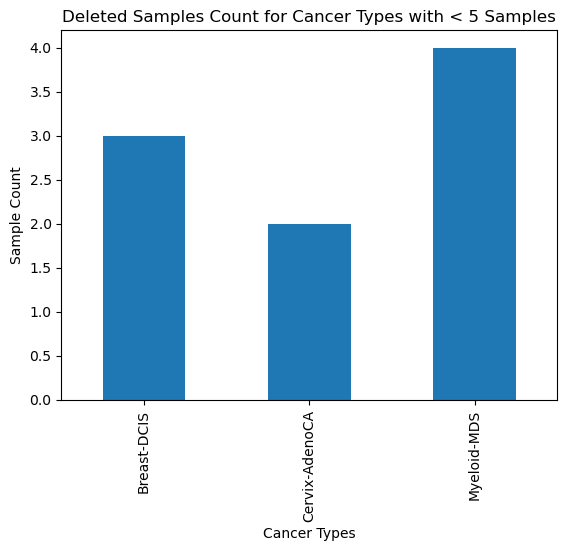

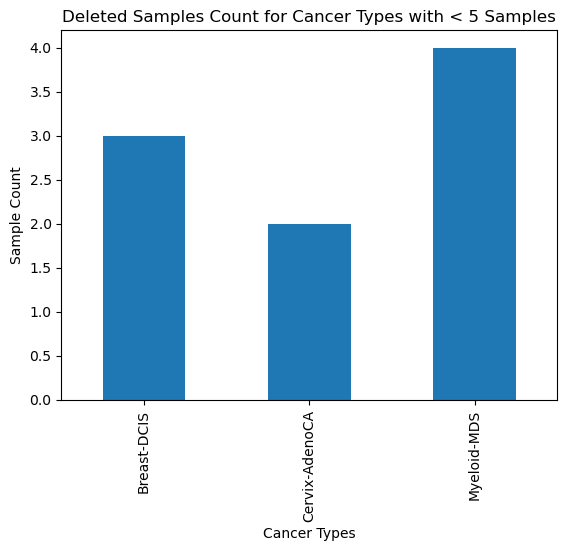

Every Class has enough samples.
Every Class has enough samples.


In [513]:
catalogs_wgs_pcawg, cancer_types_wgs_pcawg = clean_and_plot(catalogs_wgs_pcawg, cancer_types_wgs_pcawg)
activity_wgs_pcawg, cancer_types_wgs_act = clean_and_plot(activity_wgs_pcawg, cancer_types_wgs_act)
catalogs_wes_tcga, cancer_types_wes_cat = clean_and_plot(catalogs_wes_tcga, cancer_types_wes_cat)
activity_wes_tcga, cancer_types_wes_act = clean_and_plot(activity_wes_tcga, cancer_types_wes_act)

## Concatenat catalogs & activity data

In [523]:
concatenated_wgs = pd.concat([catalogs_wgs_pcawg, activity_wgs_pcawg], axis=1)
# Assuming your dataframe is df and the primary key column is 'PrimaryKey'
cance_type_concatenated_wgs = cancer_types_wgs_act
concatenated_wgs

,C>A_ACA,C>A_ACC,C>A_ACG,C>A_ACT,C>A_CCA,C>A_CCC,C>A_CCG,C>A_CCT,C>A_GCA,C>A_GCC,...,SBS51,SBS52,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60
Biliary-AdenoCA,269,148,25,154,215,148,27,180,165,76,...,0,0,0,0,0,0,0,0,0,0
Biliary-AdenoCA,114,56,13,70,63,49,7,69,81,37,...,0,0,0,0,0,0,0,0,0,0
Biliary-AdenoCA,105,71,13,73,71,55,8,61,61,50,...,0,0,0,0,0,0,0,0,0,0
Biliary-AdenoCA,217,123,29,126,129,82,26,143,162,84,...,0,0,0,0,0,0,0,0,0,0
Biliary-AdenoCA,52,36,8,31,30,22,10,38,21,25,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uterus-AdenoCA,139,75,13,68,69,52,16,55,73,32,...,0,0,0,0,0,0,0,0,0,0
Uterus-AdenoCA,404,255,52,281,339,170,52,261,264,137,...,0,0,0,0,0,0,0,0,0,0
Uterus-AdenoCA,97,78,14,80,204,390,92,876,77,62,...,0,0,0,0,0,0,0,0,0,0
Uterus-AdenoCA,250,188,49,202,194,124,28,150,142,95,...,0,0,0,0,0,0,0,0,0,0


In [562]:
# concatenated_wes = pd.concat([catalogs_wes_tcga, activity_wes_tcga], axis=1)
catalogs_wes_tcga_reset = catalogs_wes_tcga.reset_index(drop=True)
activity_wes_tcga_reset = activity_wes_tcga.reset_index(drop=True)

concatenated_wes = pd.concat([catalogs_wes_tcga_reset, activity_wes_tcga_reset], axis=1)

# Assuming your dataframe is df and the primary key column is 'PrimaryKey'
cance_type_concatenated_wes = cancer_types_wes_cat
# concatenated_wes.set_index('index', inplace=True)
concatenated_wes

,C>A_ACA,C>A_ACC,C>A_ACG,C>A_ACT,C>A_CCA,C>A_CCC,C>A_CCG,C>A_CCT,C>A_GCA,C>A_GCC,...,SBS51,SBS52,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,2,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,0,3,2,20,18,10,19,6,8,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9488,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9489,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9490,0,1,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9491,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Analisy split method
Examine the split dataset to see if stratified sampling was performed in each cancer type.

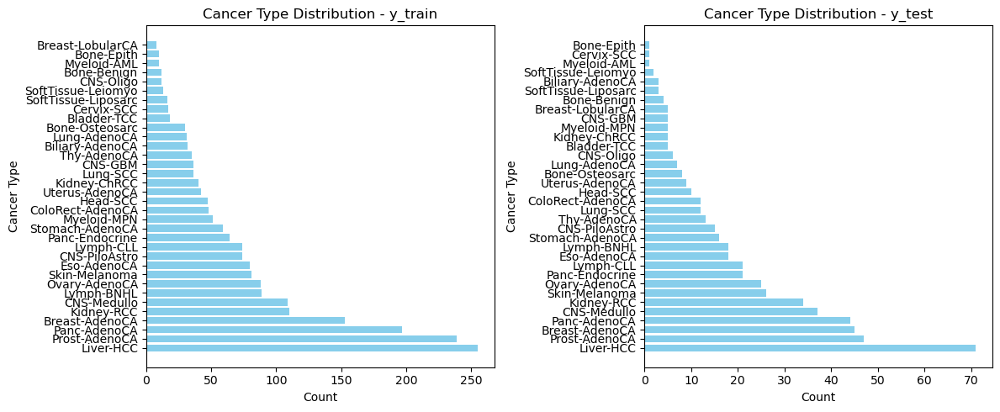

In [400]:
X_train, X_test, y_train, y_test = train_test_split(activity_wgs_pcawg, cancer_types_wgs_pcawg_act, test_size=0.2, random_state=42)

cancer_types_data2 = [y_train, y_test]
cancer_type_name2 = ['y_train', 'y_test']

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

for i, ax in enumerate(axes.flatten()):
    cancer_type_data = cancer_types_data2[i]
    counts = pd.DataFrame(cancer_type_data, columns=['cancer_types']).value_counts().reset_index(name='count')
    
    ax.barh(counts['cancer_types'], counts['count'], color='skyblue')
    
    ax.set_title(f'Cancer Type Distribution - '+ cancer_type_name2[i])
    ax.set_xlabel('Count')
    ax.set_ylabel('Cancer Type')

plt.tight_layout()

plt.show()

# Random Forest

Random Forest Classifier is a machine learning method based on decision trees and a random element. Decision trees consist of nodes and leaves: nodes ask questions about data features and split it according to those features; leaves are the final decisions, or groups, that the samples are classified to. 

Random Forest trains all decision trees on a different subset of the training data. To create the different subsets of data, random forest uses bootstrapping, i.e. it randomly samples the training data with replacement. Moreover, it creates a forest of unrelated decision trees by generating a random subset of features, which ensures a low correlation between the decision trees and reduced overfitting.

When making a prediction, each tree in the forest independently predicts the target variabel. For classification tasks, such as classifying a sample to a cancer type, the final prediction is typically the mode of all the individual tree predictions. Fore regression tasks, the final prediction is usually the average of the individual tree predictions. The advantages of using random forest include the accounted for overfitting, efficient handling of missing values, and their ability to provide estimates of feature importance.

In [13]:
#need to install some modules first so execute this cell
# Install a pip package in the current Jupyter kernel
import sys
!{sys.executable} -m pip install scikit-learn

In [14]:
from scipy.stats import *

In [15]:
#Some extra packages that are useful in this assignment
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn import decomposition
from sklearn import datasets
from scipy.stats import gaussian_kde

In [16]:
## ploting 96 mutational channels
col_set = ['#0343df','#000000','#e50000','#929591','#3f9b0b','#ff81c0']
col_list = []
for i in range (len(col_set)):
    col_list += [col_set[i]] * 16

def plot_mutationchannels(sig, name=""):
    sns.set(rc={"figure.figsize":(11,2.5)})
    sns.set(style="whitegrid", color_codes=True)

    plt.bar(sig.index, sig, width = 0.5, color = col_list)
    plt.xticks(rotation=90, size = 7, weight='bold')
    plt.title (name, size = 12, weight='bold')
    plt.tight_layout()
    plt.show()

In [17]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

### PCAWG WGS

In [18]:
cancer_types_pcawg_wgs = np.array([ s.split(":")[0] for s in PCAWG_wgs_mut.columns[2:] ])

In [19]:
pd.unique(cancer_types_pcawg_wgs)

array(['Biliary-AdenoCA', 'Bladder-TCC', 'Bone-Benign', 'Bone-Epith',
       'Bone-Osteosarc', 'Breast-AdenoCA', 'Breast-DCIS',
       'Breast-LobularCA', 'CNS-GBM', 'CNS-Medullo', 'CNS-Oligo',
       'CNS-PiloAstro', 'Cervix-AdenoCA', 'Cervix-SCC',
       'ColoRect-AdenoCA', 'Eso-AdenoCA', 'Head-SCC', 'Kidney-ChRCC',
       'Kidney-RCC', 'Liver-HCC', 'Lung-AdenoCA', 'Lung-SCC',
       'Lymph-BNHL', 'Lymph-CLL', 'Myeloid-AML', 'Myeloid-MDS',
       'Myeloid-MPN', 'Ovary-AdenoCA', 'Panc-AdenoCA', 'Panc-Endocrine',
       'Prost-AdenoCA', 'Skin-Melanoma', 'SoftTissue-Leiomyo',
       'SoftTissue-Liposarc', 'Stomach-AdenoCA', 'Thy-AdenoCA',
       'Uterus-AdenoCA'], dtype='<U19')

In [20]:
# Then we split our data into training and testing sets
# Note that for the input matrix : columns are the features, rows are the samples
X_train_pcawg_wgs, X_test_pcawg_wgs, y_train_pcawg_wgs, y_test_pcawg_wgs = train_test_split(PCAWG_wgs_mut.iloc[:, 2:].T, cancer_types_pcawg_wgs)

In [21]:
# Finally we create a RandomForestClassifier object, which we first train using fit()
model_pcawg_wgs = RandomForestClassifier().fit(X_train_pcawg_wgs, y_train_pcawg_wgs)

# Then we use it to predict data, which we then assess
model_pcawg_wgs.score(X_test_pcawg_wgs, y_test_pcawg_wgs)

0.6834532374100719

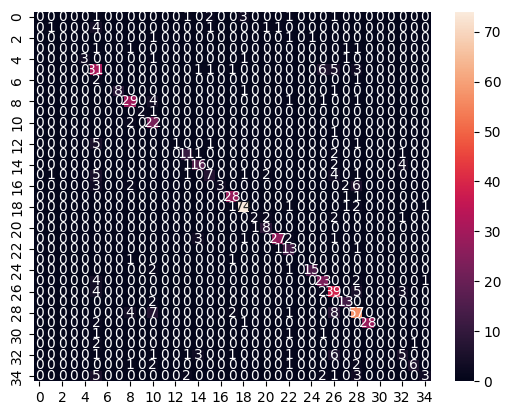

In [22]:
ax = sns.heatmap(confusion_matrix(y_test_pcawg_wgs, model_pcawg_wgs.predict(X_test_pcawg_wgs)), annot = True);

### Other WGS

0.6745182012847966


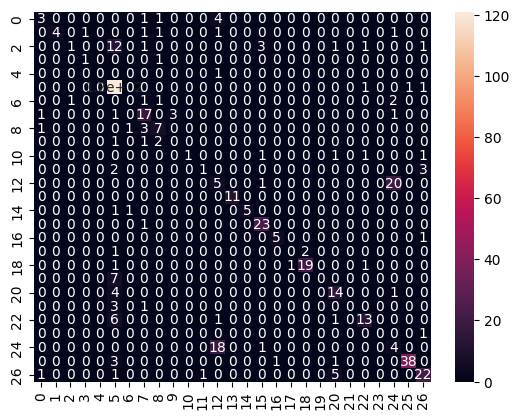

In [23]:
cancer_types_nonpcawg_wgs = np.array([ s.split(":")[0] for s in nonPCAWG_wgs_mut.columns[2:] ])

# Then we split our data into training and testing sets
# Note that for the input matrix : columns are the features, rows are the samples
X_train_nonpcawg_wgs, X_test_nonpcawg_wgs, y_train_nonpcawg_wgs, y_test_nonpcawg_wgs = train_test_split(nonPCAWG_wgs_mut.iloc[:, 2:].T, cancer_types_nonpcawg_wgs)

# Finally we create a RandomForestClassifier object, which we first train using fit()
model_nonpcawg_wgs = RandomForestClassifier().fit(X_train_nonpcawg_wgs, y_train_nonpcawg_wgs)

# Then we use it to predict data, which we then assess
print(model_nonpcawg_wgs.score(X_test_nonpcawg_wgs, y_test_nonpcawg_wgs))

ax = sns.heatmap(confusion_matrix(y_test_nonpcawg_wgs, model_nonpcawg_wgs.predict(X_test_nonpcawg_wgs)), annot = True);

### TCGA WES

0.45324347093513057


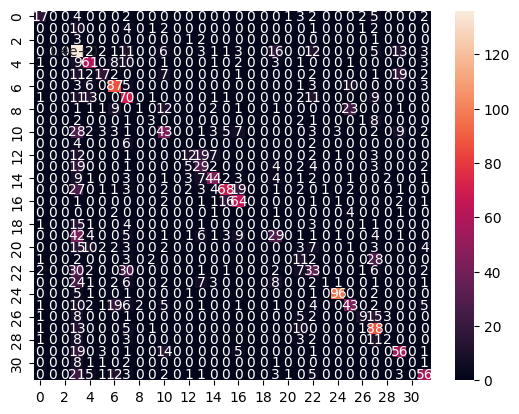

In [24]:
cancer_types_tcga_wes = np.array([ s.split(":")[0] for s in TCGA_wes_mut.columns[2:] ])

# Then we split our data into training and testing sets
# Note that for the input matrix : columns are the features, rows are the samples
X_train_tcga_wes, X_test_tcga_wes, y_train_tcga_wes, y_test_tcga_wes = train_test_split(TCGA_wes_mut.iloc[:, 2:].T, cancer_types_tcga_wes)

# Finally we create a RandomForestClassifier object, which we first train using fit()
model_tcga_wes = RandomForestClassifier().fit(X_train_tcga_wes, y_train_tcga_wes)

# Then we use it to predict data, which we then assess
print(model_tcga_wes.score(X_test_tcga_wes, y_test_tcga_wes))

ax = sns.heatmap(confusion_matrix(y_test_tcga_wes, model_tcga_wes.predict(X_test_tcga_wes)), annot = True);

### Other WES

0.34874122988031364


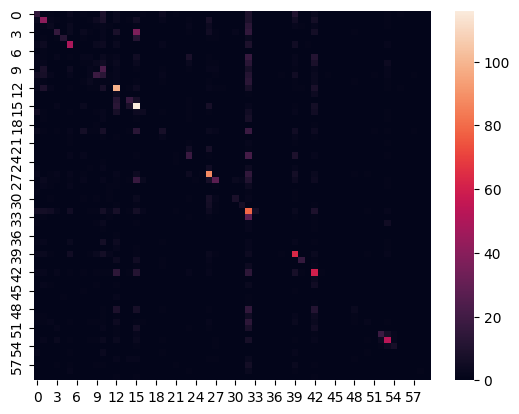

In [25]:
cancer_types_other_wes = np.array([ s.split(":")[0] for s in other_wes_mut.columns[2:] ])

# Then we split our data into training and testing sets
# Note that for the input matrix : columns are the features, rows are the samples
X_train_other_wes, X_test_other_wes, y_train_other_wes, y_test_other_wes = train_test_split(other_wes_mut.iloc[:, 2:].T, cancer_types_other_wes)

# Finally we create a RandomForestClassifier object, which we first train using fit()
model_other_wes = RandomForestClassifier().fit(X_train_other_wes, y_train_other_wes)

# Then we use it to predict data, which we then assess
print(model_other_wes.score(X_test_other_wes, y_test_other_wes))

ax = sns.heatmap(confusion_matrix(y_test_other_wes, model_other_wes.predict(X_test_other_wes)));

As expected, the models based on WGS data sets perform better than models based on WES data. The model based on the "golden standard" PWACG WGS data slightly outperforms the non-PCAWG WGS model.

## EXPLORATION

Let's test the predictive power of the models on other data sets and explore if we can improve the models.

### Fitting the models

#### Fit Other WGS data to PCAWG WGS model

First, let's try fitting the model based on PCAWG WGS data (the golden standard) on the Other WGS data.

0.16675603217158178


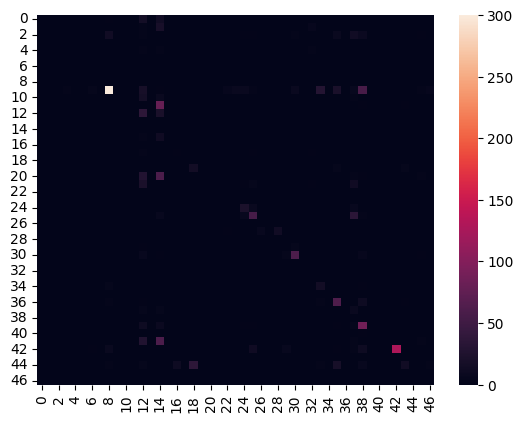

In [26]:
X_train1, y_train1 = (PCAWG_wgs_mut.iloc[:, 2:].T, cancer_types_pcawg_wgs)
X_test1, y_test1 = (nonPCAWG_wgs_mut.iloc[:, 2:].T, cancer_types_nonpcawg_wgs)


# Finally we create a RandomForestClassifier object, which we first train using fit()
model1 = RandomForestClassifier().fit(X_train1, y_train1)

# Then we use it to predict data, which we then assess
print(model1.score(X_test1, y_test1))

ax = sns.heatmap(confusion_matrix(y_test1, model1.predict(X_test1)));

The fit is not performing well - the score is only 0.167 and in the heatmap and there is barely any clear diagonal visible. 

#### Fit Other WES data to TCGA WES model

0.10380765658858734


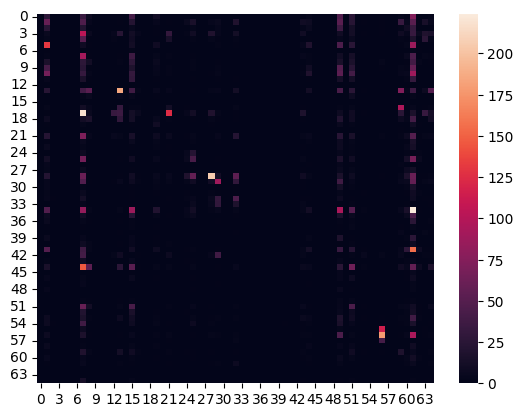

In [27]:
X_train2, y_train2 = (TCGA_wes_mut.iloc[:, 2:].T, cancer_types_tcga_wes)
X_test2, y_test2 = (other_wes_mut.iloc[:, 2:].T, cancer_types_other_wes)


# Finally we create a RandomForestClassifier object, which we first train using fit()
model2 = RandomForestClassifier().fit(X_train2, y_train2)

# Then we use it to predict data, which we then assess
print(model2.score(X_test2, y_test2))

ax = sns.heatmap(confusion_matrix(y_test2, model2.predict(X_test2)));

Fitting the model from TCGA exome data on the Other WES data set performs even worse than the whole genome sequencing model. The score of the fit is only 0.104 and there is no diagonal visible from the heatmap. Instead, there are noticeable vertical lines, indicating that the model predicts many samples from different cancer types to belong to only a handful of cancer types. To improve the results, we can try to optimise the parameters and to filter our data. 

### Varying the parameters

In [28]:
from sklearn.model_selection import RandomizedSearchCV

#### PCAWG WGS parameter optimisation

In [36]:
# define the hyperparameter grid

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 500, num = 50)]
# Criterion
criterion = ['gini', 'entropy', 'log_loss']
# Number of features to consider at every split
max_features = [None, 'sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid1 = {'n_estimators': n_estimators,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

# New instance of Random Forest classifier
rf = RandomForestClassifier()

# Create randomised search
random_search_pcawg_wgs = RandomizedSearchCV(estimator = rf, param_distributions = random_grid1, n_iter = 10)

In [37]:
random_searchmodel_pcawg_wgs = random_search_pcawg_wgs.fit(X_train_pcawg_wgs, y_train_pcawg_wgs)


In [38]:
print(random_searchmodel_pcawg_wgs.best_params_)
print(random_searchmodel_pcawg_wgs.best_score_)

{'n_estimators': 344, 'min_samples_split': 2, 'min_samples_leaf': 1}
0.6863309352517986


In [39]:
random_grid2 = { 'n_estimators': [402],
               'min_samples_split': [2],
               'min_samples_leaf': [1],
                'max_features' : max_features}

random_search_pcawg_wgs2 =  RandomizedSearchCV(estimator = rf, param_distributions = random_grid2, n_iter = 10)

In [40]:
random_searchmodel_pcawg_wgs2 = random_search_pcawg_wgs2.fit(X_train_pcawg_wgs, y_train_pcawg_wgs)


In [41]:
print(random_searchmodel_pcawg_wgs2.best_params_)
print(random_searchmodel_pcawg_wgs2.best_score_)

{'n_estimators': 402, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}
0.6877697841726619


After parameter optimisation, the score has improved minimally. Moreover, the run for optimisation was very long. However, this result supports the use of the default parameters in RandomForestClassifier. We conclude that the parameter optimisation has minimal impact and that the choice of data will most likely play a more significant role. 

### Filtering the data

In the data sets, there are some cancer types with only a few samples. The small sample size might skew the results, so lets try filter the data by only selecting cancer types with at least 15 observations. 

#### Filtering WGS data

##### Filtered PCAWG WGS (>=15 samples)

In [29]:
# create a temp dataframe without the two first cols
temp = PCAWG_wgs_mut.drop(["Mutation type", "Trinucleotide"], axis=1)
temp.head()

c_list = []
cancer_list = temp.columns.values
for i in cancer_list:
    c_list.append(i.split("::",1)[0])
    
# get unique names
c_list = list(set(c_list))
c_list


# a dict to hold the sums of all columns, key = cancer name, values = list of sums of each sample
sum_dict = {}

for cancer in c_list:
    for column in PCAWG_wgs_mut.columns.values:
        if cancer in column:
            if cancer not in sum_dict.keys():
                sum_dict[cancer] = []
            sum_dict[cancer].append(PCAWG_wgs_mut.loc[:,column].sum())
            
filtered_c_pcawg_wgs = {}
for key, value in sum_dict.items():
    if len(value) >= 15:
        filtered_c_pcawg_wgs[key] = value

# this is going to be our dataframe that includes only cancer types with 15 or more observations
filtered_pcawg_wgs = temp.copy()

for col in filtered_pcawg_wgs:
    if col.split("::",1)[0] not in filtered_c_pcawg_wgs.keys():
        filtered_pcawg_wgs = filtered_pcawg_wgs.drop(col, axis = 1)

filtered_pcawg_wgs.head()

,Biliary-AdenoCA::SP117655,Biliary-AdenoCA::SP117556,Biliary-AdenoCA::SP117627,Biliary-AdenoCA::SP117775,Biliary-AdenoCA::SP117332,Biliary-AdenoCA::SP117712,Biliary-AdenoCA::SP117017,Biliary-AdenoCA::SP117031,Biliary-AdenoCA::SP117759,Biliary-AdenoCA::SP117621,...,Uterus-AdenoCA::SP94540,Uterus-AdenoCA::SP95222,Uterus-AdenoCA::SP89389,Uterus-AdenoCA::SP90503,Uterus-AdenoCA::SP92460,Uterus-AdenoCA::SP92931,Uterus-AdenoCA::SP91265,Uterus-AdenoCA::SP89909,Uterus-AdenoCA::SP90629,Uterus-AdenoCA::SP95550
0,269,114,105,217,52,192,54,196,242,171,...,117,233,94,114,257,139,404,97,250,170
1,148,56,71,123,36,139,54,102,187,130,...,90,167,59,64,268,75,255,78,188,137
2,25,13,13,29,8,31,12,15,14,20,...,12,29,14,19,51,13,52,14,49,32
3,154,70,73,126,31,119,41,122,171,123,...,82,213,66,68,271,68,281,80,202,116
4,215,63,71,129,30,190,54,133,316,135,...,119,188,67,89,307,69,339,204,194,127


Let's use Random Forest Classifier again but with the filtered data

0.6988304093567251


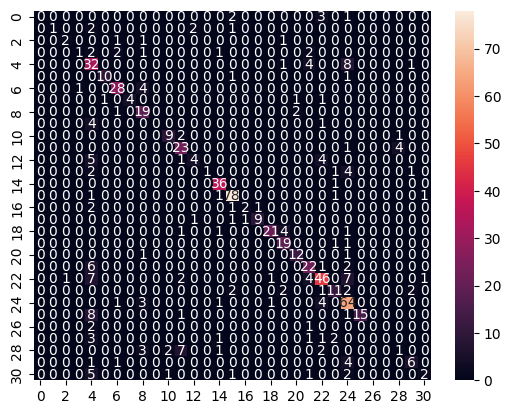

In [31]:
f_ctypes_pcawg_wgs = np.array([ s.split(":")[0] for s in filtered_pcawg_wgs.columns ])

# Then we split our data into training and testing sets
# Note that for the input matrix : columns are the features, rows are the samples
X_train_fpcawg_wgs, X_test_fpcawg_wgs, y_train_fpcawg_wgs, y_test_fpcawg_wgs = train_test_split(filtered_pcawg_wgs.T, f_ctypes_pcawg_wgs)

# Finally we create a RandomForestClassifier object, which we first train using fit()
fmodel_pcawg_wgs = RandomForestClassifier().fit(X_train_fpcawg_wgs, y_train_fpcawg_wgs)

# Then we use it to predict data, which we then assess
print(fmodel_pcawg_wgs.score(X_test_fpcawg_wgs, y_test_fpcawg_wgs))

ax = sns.heatmap(confusion_matrix(y_test_fpcawg_wgs, fmodel_pcawg_wgs.predict(X_test_fpcawg_wgs)), annot = True);

The score improved minimally. Let's see what happens when this model is applied to filtered Other WGS data.

##### Applying the model to filtered Other WGS data

Let's first filter the Other WGS data

In [32]:
# create a temp dataframe without the two first cols
temp = nonPCAWG_wgs_mut.drop(["Mutation type", "Trinucleotide"], axis=1)

c_list = []
cancer_list = temp.columns.values
for i in cancer_list:
    c_list.append(i.split("::",1)[0])
    
# get unique names
c_list = list(set(c_list))
c_list


# a dict to hold the sums of all columns, key = cancer name, values = list of sums of each sample
sum_dict = {}

for cancer in c_list:
    for column in nonPCAWG_wgs_mut.columns.values:
        if cancer in column:
            if cancer not in sum_dict.keys():
                sum_dict[cancer] = []
            sum_dict[cancer].append(nonPCAWG_wgs_mut.loc[:,column].sum())
            
filtered_c_nonpcawg_wgs = {}
for key, value in sum_dict.items():
    if len(value) >= 15:
        filtered_c_nonpcawg_wgs[key] = value

# this is going to be our dataframe that includes only cancer types with 15 or more observations
filtered_nonpcawg_wgs = temp.copy()

for col in filtered_nonpcawg_wgs:
    if col.split("::",1)[0] not in filtered_c_nonpcawg_wgs.keys():
        filtered_nonpcawg_wgs = filtered_nonpcawg_wgs.drop(col, axis = 1)
        

# an array containing the filtered cancer types        
f_ctypes_nonpcawg_wgs = np.array([ s.split(":")[0] for s in filtered_nonpcawg_wgs.columns ])

Now we can apply the model trained on filtered PCAWG WGS data to the filtered Other WGS data:

0.16766794101583835


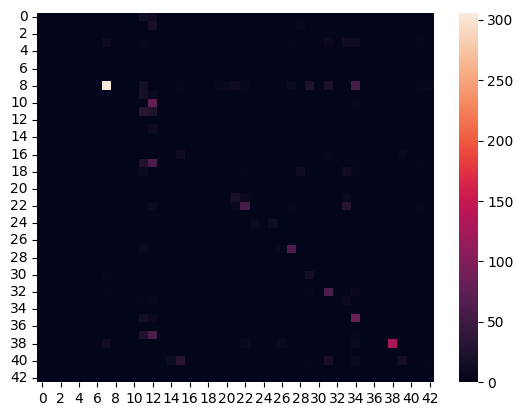

In [33]:
X_train, y_train = (filtered_pcawg_wgs.T, f_ctypes_pcawg_wgs)
X_test, y_test = (filtered_nonpcawg_wgs.T, f_ctypes_nonpcawg_wgs)


# Finally we create a RandomForestClassifier object, which we first train using fit()
model = RandomForestClassifier().fit(X_train, y_train)

# Then we use it to predict data, which we then assess
print(model.score(X_test, y_test))

ax = sns.heatmap(confusion_matrix(y_test, model.predict(X_test)));

There was only a slight improvement in the score. Let's still explore the effect of feature reduction.

### Feature reduction

The data sets have 96 mutational channels. Let's reduce the features to only the six base mutations.

In [34]:
new_pcawg_wgs = PCAWG_wgs_mut.drop(columns=['Trinucleotide'])

# Group by 'Mutation type' and sum the counts for each sample
new_pcawg_wgs = new_pcawg_wgs.groupby('Mutation type').sum()

# Display the new DataFrame
new_pcawg_wgs

,Biliary-AdenoCA::SP117655,Biliary-AdenoCA::SP117556,Biliary-AdenoCA::SP117627,Biliary-AdenoCA::SP117775,Biliary-AdenoCA::SP117332,Biliary-AdenoCA::SP117712,Biliary-AdenoCA::SP117017,Biliary-AdenoCA::SP117031,Biliary-AdenoCA::SP117759,Biliary-AdenoCA::SP117621,...,Uterus-AdenoCA::SP94540,Uterus-AdenoCA::SP95222,Uterus-AdenoCA::SP89389,Uterus-AdenoCA::SP90503,Uterus-AdenoCA::SP92460,Uterus-AdenoCA::SP92931,Uterus-AdenoCA::SP91265,Uterus-AdenoCA::SP89909,Uterus-AdenoCA::SP90629,Uterus-AdenoCA::SP95550
Mutation type,,,,,,,,,,,,,,,,,,,,,
C>A,2406,987,967,2059,502,2558,668,1871,2724,1801,...,1577,2466,920,1074,4531,979,3342,2529,3755,1614
C>G,1731,337,363,1748,587,741,306,984,1008,1708,...,559,3326,1283,1533,623,419,2243,515,14160,1733
C>T,5419,1998,3029,5226,1400,2372,3714,4023,5992,5849,...,2109,4681,2581,2618,12547,1853,3962,8935,10867,2888
T>A,2276,639,545,1098,356,1511,538,1123,1265,1141,...,698,1409,542,529,2955,512,1981,907,1857,981
T>C,1886,783,761,1580,438,3413,1060,1251,1639,1619,...,1159,2100,803,933,5355,807,2584,4806,2565,1258
T>G,1182,344,258,700,173,712,276,716,682,756,...,451,1117,373,421,953,410,1505,537,1589,595


Let's run the Random Forest Classifier again

0.576978417266187


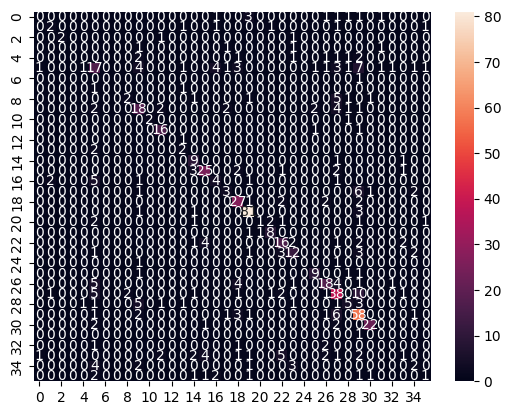

In [35]:
new_ctypes_pcawg_wgs = np.array([ s.split(":")[0] for s in new_pcawg_wgs.columns ])

# Then we split our data into training and testing sets
# Note that for the input matrix : columns are the features, rows are the samples
X_train_new_pcawg_wgs, X_test_new_pcawg_wgs, y_train_new_pcawg_wgs, y_test_new_pcawg_wgs = train_test_split(new_pcawg_wgs.T, new_ctypes_pcawg_wgs)

# Finally we create a RandomForestClassifier object, which we first train using fit()
new_model_pcawg_wgs = RandomForestClassifier().fit(X_train_new_pcawg_wgs, y_train_new_pcawg_wgs)

# Then we use it to predict data, which we then assess
print(new_model_pcawg_wgs.score(X_test_new_pcawg_wgs, y_test_new_pcawg_wgs))

ax = sns.heatmap(confusion_matrix(y_test_new_pcawg_wgs, new_model_pcawg_wgs.predict(X_test_new_pcawg_wgs)), annot = True);

The score of the model got actually worse. Let's still try it's predictive power in the other WGS data set.

In [36]:
# Let's create a six channel dataframe of the Other WGS data
new_nonpcawg_wgs = nonPCAWG_wgs_mut.drop(columns=['Trinucleotide'])

# Group by 'Mutation type' and sum the counts for each sample
new_nonpcawg_wgs = new_nonpcawg_wgs.groupby('Mutation type').sum()

# Cancer types
new_ctypes_nonpcawg_wgs = np.array([ s.split(":")[0] for s in new_nonpcawg_wgs.columns ])

# Display the new DataFrame
new_nonpcawg_wgs

,ALL::PD4020a,ALL::SJBALL011_D,ALL::SJBALL012_D,ALL::SJBALL020013_D1,ALL::SJBALL020422_D1,ALL::SJBALL020579_D1,ALL::SJBALL020589_D1,ALL::SJBALL020625_D1,ALL::SJBALL020704_D1,ALL::SJBALL020877_D1,...,Stomach-AdenoCa::pfg316T,Stomach-AdenoCa::pfg317T,Stomach-AdenoCa::pfg344T,Stomach-AdenoCa::pfg373T,Stomach-AdenoCa::pfg375T,Stomach-AdenoCa::pfg378T,Stomach-AdenoCa::pfg398T,Stomach-AdenoCa::pfg413T,Stomach-AdenoCa::pfg416T,Stomach-AdenoCa::pfg424T
Mutation type,,,,,,,,,,,,,,,,,,,,,
C>A,504,71,29,105,48,80,24,39,50,61,...,1356,1963,1726,1831,840,1943,224,2986,939,1100
C>G,3530,30,20,19,14,13,5,13,15,23,...,431,303,785,415,247,354,62,437,225,583
C>T,3429,139,106,332,179,164,77,90,139,179,...,2274,2459,3207,2374,1581,1807,516,5178,1373,1660
T>A,149,74,37,73,35,44,17,29,49,56,...,557,495,1142,916,320,495,54,891,206,706
T>C,160,79,44,84,54,55,17,43,69,68,...,1284,884,2198,1757,469,925,139,1369,465,903
T>G,91,33,15,37,21,15,13,9,19,21,...,1195,504,2755,2349,290,424,72,901,236,480


And now we can apply the model created with PCAWG WGS data to the Other WGS data

0.142627345844504


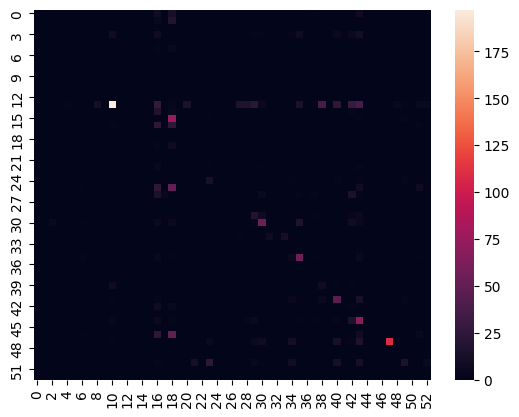

In [37]:
X_train, y_train = (new_pcawg_wgs.T, new_ctypes_pcawg_wgs)
X_test, y_test = (new_nonpcawg_wgs.T, new_ctypes_nonpcawg_wgs)


# Finally we create a RandomForestClassifier object, which we first train using fit()
model = RandomForestClassifier().fit(X_train, y_train)

# Then we use it to predict data, which we then assess
print(model.score(X_test, y_test))

ax = sns.heatmap(confusion_matrix(y_test, model.predict(X_test)));

The model performs worse than the original one, indicating that the trinucleotide context is an important feature. 

Let's explore which mutational channel has most importance for the model.

In [65]:
# import new_pcawg_wgs
from sklearn.metrics import accuracy_score

new_pcawg_wgs = new_pcawg_wgs.T

# Prepare data
X = new_pcawg_wgs  # Features
y = new_ctypes_pcawg_wgs  # Labels (cancer types)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y)

# Train the model using the full feature set
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)


# Evaluate model's performance
initial_accuracy = new_model_pcawg_wgs.score(X_test_new_pcawg_wgs, y_test_new_pcawg_wgs)
print("Initial Accuracy:", initial_accuracy)

# Iterate through each mutation channel
mutation_channels = X.columns
for mutation_channel in mutation_channels:
    # Remove the mutation channel from the feature set
    X_train_updated = X_train.drop(columns=[mutation_channel])
    X_test_updated = X_test.drop(columns=[mutation_channel])
    
    # Retrain the model
    model.fit(X_train_updated, y_train)
    
    # Evaluate model's performance without the mutation channel
    updated_accuracy = accuracy_score(y_test, model.predict(X_test_updated))
    print(f"Accuracy without {mutation_channel}: {updated_accuracy}")

Initial Accuracy: 0.576978417266187
Accuracy without C>A: 0.5309352517985612
Accuracy without C>G: 0.5007194244604316
Accuracy without C>T: 0.49928057553956834
Accuracy without T>A: 0.5251798561151079
Accuracy without T>C: 0.49640287769784175
Accuracy without T>G: 0.5007194244604316


The least important mutational channel seems to be C>A and the most important one T>C, however, as the intial model had the highest accuracy score, we conclude that all the channels have important predicitive power.

### Random Forest Classifier on mutational signatures

In [69]:
# Prepare data
X = PCAWG_wgs_act.drop(columns=["Cancer Types", "Sample Names", "Accuracy"])  # Features
y = PCAWG_wgs_act["Cancer Types"]  # Labels

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model using the full feature set
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Evaluate model's performance
initial_accuracy = accuracy_score(y_test, model.predict(X_test))
print("Initial Accuracy:", initial_accuracy)

# Iterate through each mutation channel
mutation_channels = X.columns
for mutation_channel in mutation_channels:
    # Remove the mutation channel from the feature set
    X_train_updated = X_train.drop(columns=[mutation_channel])
    X_test_updated = X_test.drop(columns=[mutation_channel])
    
    # Retrain the model
    model.fit(X_train_updated, y_train)
    
    # Evaluate model's performance without the mutation channel
    updated_accuracy = accuracy_score(y_test, model.predict(X_test_updated))
    print(f"Accuracy without {mutation_channel}: {updated_accuracy}")

Initial Accuracy: 0.6528776978417267
Accuracy without SBS1: 0.5755395683453237
Accuracy without SBS2: 0.6546762589928058
Accuracy without SBS3: 0.6348920863309353
Accuracy without SBS4: 0.6366906474820144
Accuracy without SBS5: 0.6097122302158273
Accuracy without SBS6: 0.6510791366906474
Accuracy without SBS7a: 0.6600719424460432
Accuracy without SBS7b: 0.6600719424460432
Accuracy without SBS7c: 0.6510791366906474
Accuracy without SBS7d: 0.6474820143884892
Accuracy without SBS8: 0.6510791366906474
Accuracy without SBS9: 0.658273381294964
Accuracy without SBS10a: 0.6618705035971223
Accuracy without SBS10b: 0.6510791366906474
Accuracy without SBS11: 0.6438848920863309
Accuracy without SBS12: 0.6564748201438849
Accuracy without SBS13: 0.6474820143884892
Accuracy without SBS14: 0.6546762589928058
Accuracy without SBS15: 0.6492805755395683
Accuracy without SBS16: 0.6528776978417267
Accuracy without SBS17a: 0.6474820143884892
Accuracy without SBS17b: 0.6492805755395683
Accuracy without SBS18

In [68]:

# Prepare data
X = PCAWG_wgs_act.drop(columns=["Cancer Types", "Sample Names", "Accuracy"])  # Features
y = PCAWG_wgs_act["Cancer Types"]  # Labels

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model using the full feature set
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Evaluate model's performance
initial_accuracy = accuracy_score(y_test, model.predict(X_test))
print("Initial Accuracy:", initial_accuracy)

# Track mutation channel with the highest accuracy
best_mutation_channel = None
best_accuracy = initial_accuracy

# Iterate through each mutation channel
mutation_channels = X.columns
for mutation_channel in mutation_channels:
    # Remove the mutation channel from the feature set
    X_train_updated = X_train.drop(columns=[mutation_channel])
    X_test_updated = X_test.drop(columns=[mutation_channel])
    
    # Retrain the model
    model.fit(X_train_updated, y_train)
    
    # Evaluate model's performance without the mutation channel
    updated_accuracy = accuracy_score(y_test, model.predict(X_test_updated))
    
    # Update best accuracy and mutation channel if applicable
    if updated_accuracy > best_accuracy:
        best_accuracy = updated_accuracy
        best_mutation_channel = mutation_channel

# Output mutation channel with the highest impact on accuracy when removed
if best_mutation_channel:
    print(f"Mutation channel with highest impact on accuracy when removed: {best_mutation_channel} (Accuracy: {best_accuracy})")
else:
    print("No mutation channel significantly impacts accuracy when removed.")

# Print the most important mutation channel
importance_rank = model.feature_importances_.argsort()[::-1]
most_important_channel = X.columns[importance_rank[0]]
print(f"Most important mutation channel: {most_important_channel}")

Initial Accuracy: 0.6528776978417267
Mutation channel with highest impact on accuracy when removed: SBS29 (Accuracy: 0.6672661870503597)
Most important mutation channel: SBS1


When SBS29 is removed, the accuracy of the model actually increases slightly. The most important channel is SBS1, the removal of which decreases the accuracy significantly.

# Test SVM

Support Vector Machine (SVM) is a popular algorithm for classification and regression tasks. It finds the best hyperplane to separate different classes by maximizing the margin between classes. SVM can handle linear and nonlinear tasks using different kernel functions. It's known for its versatility and robustness, but its performance depends on parameter tuning and kernel selection.

1. Add `stratify` parameter when splitting data. When using the `sklearn.model_selection.train_test_split` function, the `stratify` parameter serves to ensure that the proportions of samples in each category in both the training and test sets are the same as in the original dataset. This is especially important for dealing with unbalanced datasets, and can help keep the distribution of the dataset more stable and efficient for model training.
2. Before training the model, the data should be preprocessed using a pipeline.
3. Hyperparametric optimisation can be performed using Bayesian search or grid search.Hyperparameters are important for the performance of the model.I tested the SVM model here with the default parameters and it didn't perform well.
4. Different models may perform differently on different classes. Even though the overall results of SVM are not good, it outperforms the original scripted GradientBoosting in some classes.So we can use stacking to integrate these models and get higher performance scores.
5. For unbalanced datasets, accuracy_score is not a good indicator and average_precision_score is generally more appropriate than accuracy_score.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split,cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from scipy.stats import uniform, randint
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

In [ ]:
def train_test_evaluate(X, y, show_matrix=True, each_acc=False):
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42, train_size=0.7)
    
    # Create a pipeline with a StandardScaler and an SVC
    clf = make_pipeline(StandardScaler(), SVC(random_state=42))
    
    # Fit the model
    clf.fit(X_train, y_train)
    
    # Predict on the test set
    y_pred = clf.predict(X_test)
    
    # Evaluate the accuracy
    accuracy = accuracy_score(y_test, y_pred)
    
    # Generate the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    class_labels = clf.named_steps['svc'].classes_
    
    if show_matrix:
        # Plot the confusion matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='g', xticklabels=class_labels, yticklabels=class_labels)
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title('Confusion Matrix')
        plt.show()
    
    if each_acc:
        class_accuracy = cm.diagonal() / cm.sum(axis=1)
        sorted_class_accuracy = sorted(zip(class_labels, class_accuracy), key=lambda x: x[1], reverse=True)
        for label, acc in sorted_class_accuracy:
            print(f'{label}: Accuracy = {acc}')
    
    return accuracy

## Catalog WGS PCAWG

In [ ]:
catalogs_wgs_pcawg = pd.read_csv('./project_data/catalogs/WGS/WGS_PCAWG.96.csv')
catalogs_wgs_pcawg = catalogs_wgs_pcawg.set_index (catalogs_wgs_pcawg['Mutation type'] + "_" + catalogs_wgs_pcawg['Trinucleotide'])
wgs_cancer_types = np.array([ s.split(":")[0] for s in catalogs_wgs_pcawg.columns[2:] ])
catalogs_wgs_pcawg.head()
unique_elements_wgs, counts_wgs = np.unique(wgs_cancer_types,return_counts=True)
unique_elements_wgs,counts_wgs

(array(['Biliary-AdenoCA', 'Bladder-TCC', 'Bone-Benign', 'Bone-Epith',
        'Bone-Osteosarc', 'Breast-AdenoCA', 'Breast-DCIS',
        'Breast-LobularCA', 'CNS-GBM', 'CNS-Medullo', 'CNS-Oligo',
        'CNS-PiloAstro', 'Cervix-AdenoCA', 'Cervix-SCC',
        'ColoRect-AdenoCA', 'Eso-AdenoCA', 'Head-SCC', 'Kidney-ChRCC',
        'Kidney-RCC', 'Liver-HCC', 'Lung-AdenoCA', 'Lung-SCC',
        'Lymph-BNHL', 'Lymph-CLL', 'Myeloid-AML', 'Myeloid-MDS',
        'Myeloid-MPN', 'Ovary-AdenoCA', 'Panc-AdenoCA', 'Panc-Endocrine',
        'Prost-AdenoCA', 'Skin-Melanoma', 'SoftTissue-Leiomyo',
        'SoftTissue-Liposarc', 'Stomach-AdenoCA', 'Thy-AdenoCA',
        'Uterus-AdenoCA'], dtype='<U19'),
 array([ 35,  23,  16,  11,  38, 198,   3,  13,  41, 146,  18,  89,   2,
         18,  60,  98,  57,  45, 144, 326,  38,  48, 107,  95,  11,   4,
         56, 113, 241,  85, 286, 107,  15,  19,  75,  48,  51], dtype=int64))

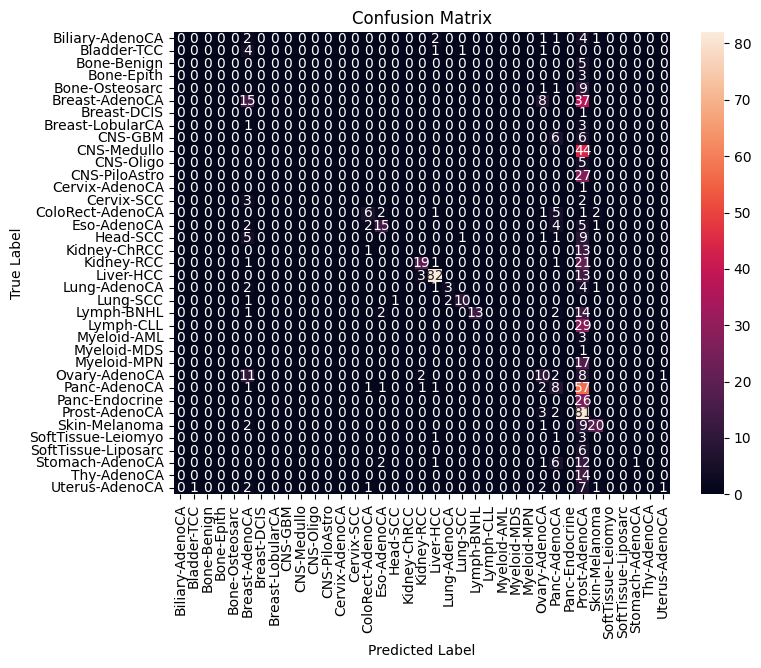

Prost-AdenoCA: Accuracy = 0.9418604651162791
Liver-HCC: Accuracy = 0.8367346938775511
Lung-SCC: Accuracy = 0.7142857142857143
Skin-Melanoma: Accuracy = 0.625
Eso-AdenoCA: Accuracy = 0.5172413793103449
Kidney-RCC: Accuracy = 0.4418604651162791
Lymph-BNHL: Accuracy = 0.40625
ColoRect-AdenoCA: Accuracy = 0.3333333333333333
Ovary-AdenoCA: Accuracy = 0.29411764705882354
Lung-AdenoCA: Accuracy = 0.2727272727272727
Breast-AdenoCA: Accuracy = 0.25
Panc-AdenoCA: Accuracy = 0.1111111111111111
Uterus-AdenoCA: Accuracy = 0.06666666666666667
Stomach-AdenoCA: Accuracy = 0.043478260869565216
Biliary-AdenoCA: Accuracy = 0.0
Bladder-TCC: Accuracy = 0.0
Bone-Benign: Accuracy = 0.0
Bone-Epith: Accuracy = 0.0
Bone-Osteosarc: Accuracy = 0.0
Breast-DCIS: Accuracy = 0.0
Breast-LobularCA: Accuracy = 0.0
CNS-GBM: Accuracy = 0.0
CNS-Medullo: Accuracy = 0.0
CNS-Oligo: Accuracy = 0.0
CNS-PiloAstro: Accuracy = 0.0
Cervix-AdenoCA: Accuracy = 0.0
Cervix-SCC: Accuracy = 0.0
Head-SCC: Accuracy = 0.0
Kidney-ChRCC: Accu

In [ ]:
acc_wgs_pcawg_96 = train_test_evaluate(catalogs_wgs_pcawg.iloc[:, 2:].T, wgs_cancer_types,each_acc=True)

In [ ]:
print(f"Accuracy on full wgs count dataset:{acc_wgs_pcawg_96}")

Accuracy on full wgs count dataset:0.3401197604790419


## Catalog WES TCGA

In [ ]:
# dataset 2: wes tcga counts
catalogs_wes_tcga = pd.read_csv('./project_data/catalogs/WES/WES_TCGA.96.csv')
catalogs_wes_tcga = catalogs_wes_tcga.set_index (catalogs_wes_tcga['Mutation type'] + "_" + catalogs_wes_tcga['Trinucleotide'])
cancer_types_wes = np.array([ s.split(":")[0] for s in catalogs_wes_tcga.columns[2:] ])
catalogs_wes_tcga.head()
unique_elements, counts = np.unique(cancer_types_wes,return_counts=True)
unique_elements,counts

(array(['AML', 'Adrenal-neoplasm', 'Biliary-AdenoCa', 'Breast-cancer',
        'CNS-GBM', 'Cervix-CA', 'ColoRect-AdenoCa', 'DLBC', 'Eso-AdenoCa',
        'Eye-Melanoma', 'Head-SCC', 'Kidney-ChRCC', 'Kidney-Papillary',
        'Kidney-RCC', 'Liver-HCC', 'Lung-AdenoCa', 'Lung-SCC',
        'Lymph-BNHL', 'Mesothelium-Mesothelioma', 'Ovary-AdenoCa',
        'Panc-AdenoCa', 'Pheochromocytoma', 'Prost-AdenoCa', 'Sarcoma',
        'Skin-Melanoma', 'Stomach-AdenoCa', 'Testis-Ca', 'Thy-AdenoCa',
        'Thymoma', 'Transitional-cell-carcinoma', 'UCS', 'Uterus-AdenoCa'],
       dtype='<U27'),
 array([139,  91,  36, 930, 362, 271, 496, 512, 182,  80, 464,  50, 251,
        334, 311, 528, 427,  31,  82, 385, 174, 182, 484, 208, 412, 401,
        149, 478, 123, 389,  57, 474], dtype=int64))

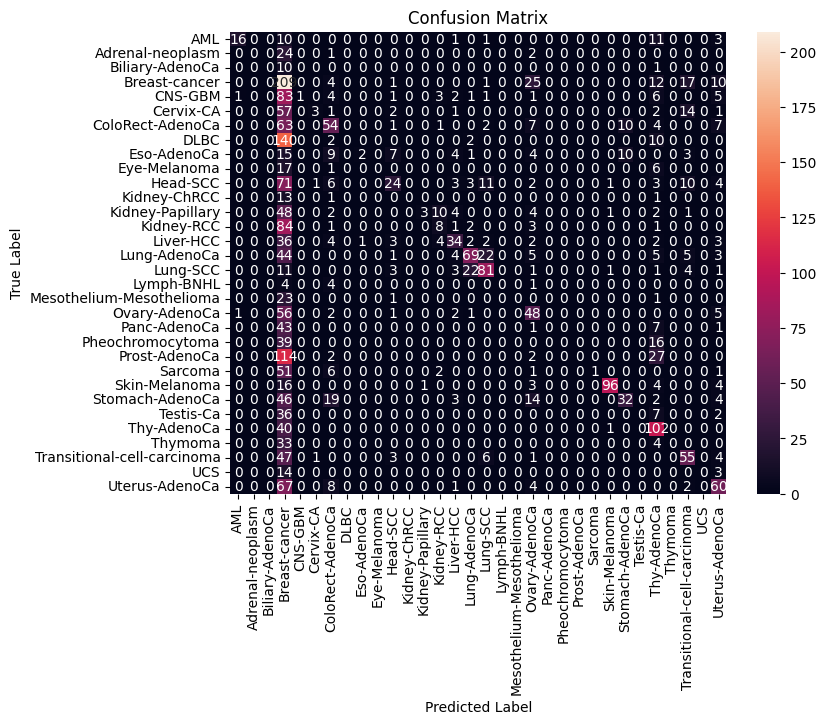

Accuracy on full wes count dataset:0.31530898876404495


In [ ]:
# train on full dataset
acc_wes_tcga_96 = train_test_evaluate(catalogs_wes_tcga.iloc[:, 2:].T, cancer_types_wes)
print(f"Accuracy on full wes count dataset:{acc_wes_tcga_96}")

## Activity WGS PCAWG

In [ ]:
# dataset 3: wgs activity
activity_wgs_pcawg = pd.read_csv('./project_data/activities/WGS/WGS_PCAWG.activities.csv')
cancer_types_wgs = np.array([ s.split(":")[0] for s in activity_wgs_pcawg.iloc[:,0] ])
unique_elements, counts = np.unique(cancer_types_wgs,return_counts=True)
unique_elements,counts

(array(['Biliary-AdenoCA', 'Bladder-TCC', 'Bone-Benign', 'Bone-Epith',
        'Bone-Osteosarc', 'Breast-AdenoCA', 'Breast-DCIS',
        'Breast-LobularCA', 'CNS-GBM', 'CNS-Medullo', 'CNS-Oligo',
        'CNS-PiloAstro', 'Cervix-AdenoCA', 'Cervix-SCC',
        'ColoRect-AdenoCA', 'Eso-AdenoCA', 'Head-SCC', 'Kidney-ChRCC',
        'Kidney-RCC', 'Liver-HCC', 'Lung-AdenoCA', 'Lung-SCC',
        'Lymph-BNHL', 'Lymph-CLL', 'Myeloid-AML', 'Myeloid-MDS',
        'Myeloid-MPN', 'Ovary-AdenoCA', 'Panc-AdenoCA', 'Panc-Endocrine',
        'Prost-AdenoCA', 'Skin-Melanoma', 'SoftTissue-Leiomyo',
        'SoftTissue-Liposarc', 'Stomach-AdenoCA', 'Thy-AdenoCA',
        'Uterus-AdenoCA'], dtype='<U19'),
 array([ 35,  23,  16,  11,  38, 198,   3,  13,  41, 146,  18,  89,   2,
         18,  60,  98,  57,  45, 144, 326,  38,  48, 107,  95,  11,   4,
         56, 113, 241,  85, 286, 107,  15,  19,  75,  48,  51], dtype=int64))

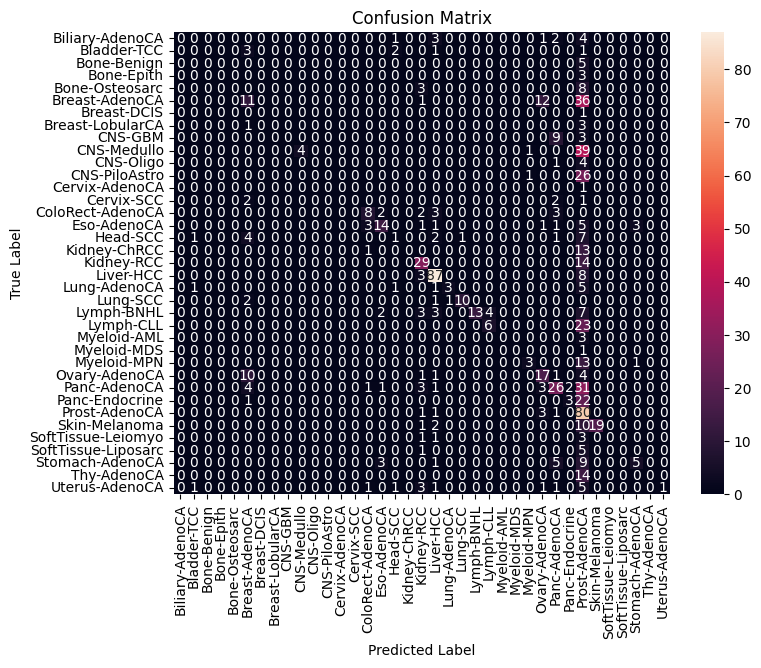

Accuracy on full wgs activity dataset:0.40718562874251496


In [ ]:
# train on full dataset
acc_wgs_pcawg_activity = train_test_evaluate(activity_wgs_pcawg.iloc[:,3:], cancer_types_wgs)
print(f"Accuracy on full wgs activity dataset:{acc_wgs_pcawg_activity}")

## Activity WES TCGA

In [ ]:
# dataset 4: wes activity
activity_wes_tcga = pd.read_csv('./project_data/activities/WES/WES_TCGA.activities.csv')
cancer_types_wes = np.array([ s.split(":")[0] for s in activity_wes_tcga.iloc[:,0] ])
unique_elements, counts = np.unique(cancer_types_wes,return_counts=True)
unique_elements,counts

(array(['AML', 'Adrenal-neoplasm', 'Biliary-AdenoCa', 'Breast-cancer',
        'CNS-GBM', 'Cervix-CA', 'ColoRect-AdenoCa', 'DLBC', 'Eso-AdenoCa',
        'Eye-Melanoma', 'Head-SCC', 'Kidney-ChRCC', 'Kidney-Papillary',
        'Kidney-RCC', 'Liver-HCC', 'Lung-AdenoCa', 'Lung-SCC',
        'Lymph-BNHL', 'Mesothelium-Mesothelioma', 'Ovary-AdenoCa',
        'Panc-AdenoCa', 'Pheochromocytoma', 'Prost-AdenoCa', 'Sarcoma',
        'Skin-Melanoma', 'Stomach-AdenoCa', 'Testis-Ca', 'Thy-AdenoCa',
        'Thymoma', 'Transitional-cell-carcinoma', 'UCS', 'Uterus-AdenoCa'],
       dtype='<U27'),
 array([139,  91,  36, 930, 362, 271, 496, 512, 182,  80, 464,  50, 251,
        334, 311, 528, 427,  31,  82, 385, 174, 182, 484, 208, 412, 401,
        149, 478, 123, 389,  57, 474], dtype=int64))

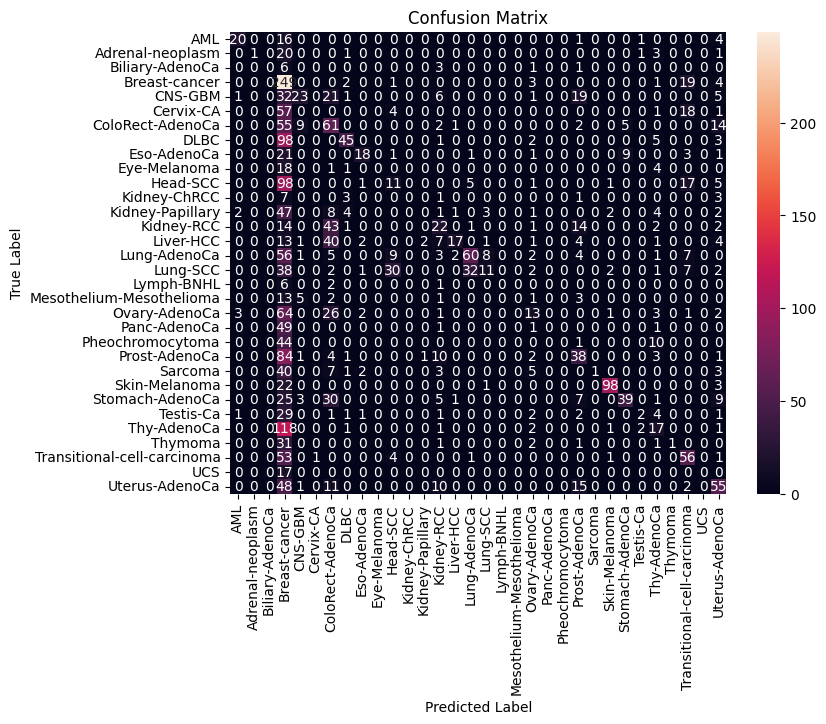

Accuracy on full wes activity dataset:0.3012640449438202


In [ ]:
# train on full dataset
acc_wes_tcga_activity = train_test_evaluate(activity_wes_tcga.iloc[:, 3:], cancer_types_wes)
print(f"Accuracy on full wes activity dataset:{acc_wes_tcga_activity}")

## Results

In [ ]:
print("Catalog WGS PCAWG: ",acc_wgs_pcawg_96)
print("Catalog WES TCGA: ",acc_wes_tcga_96)
print("Activity WGS PCAWG: ",acc_wgs_pcawg_activity)
print("Activity WES TCGA: ",acc_wes_tcga_activity)
df = pd.DataFrame({'WGS_PCAWG':[acc_wgs_pcawg_96,acc_wgs_pcawg_activity],'WES_TCGA':[acc_wes_tcga_96,acc_wes_tcga_activity],'index':['catalog','activity']})
df = df.set_index('index')
df

Catalog WGS PCAWG:  0.3401197604790419
Catalog WES TCGA:  0.31530898876404495
Activity WGS PCAWG:  0.40718562874251496
Activity WES TCGA:  0.3012640449438202


,WGS_PCAWG,WES_TCGA
index,,
catalog,0.340120,0.315309
activity,0.407186,0.301264


# Deep Neural Network

A deep neural network (DNN) is a type of artificial neural network with multiple hidden layers between the input and output layers. Each layer consists of interconnected nodes, also known as neurons, which process information using weighted connections and activation functions. DNNs are capable of learning complex patterns and representations from data through a process called training, where the network adjusts its parameters to minimize the difference between predicted and actual outputs. They have achieved remarkable success in various fields such as computer vision, natural language processing, and speech recognition, owing to their ability to automatically extract hierarchical features from raw data.

In [401]:
def creat_opt_basic_model(X_train,encoder):
    dropout = 0.5
    # Define neural network model
    model = Sequential()
    model.add(Dense(128, input_dim=X_train.shape[1], activation='relu', kernel_regularizer='l2'))
    model.add(Dropout(dropout))
    model.add(Dense(64, activation='relu', kernel_regularizer='l2'))
    model.add(Dropout(dropout))
    model.add(Dense(len(encoder.classes_), activation='softmax'))    
    return model

## Split data

In [402]:
from sklearn.preprocessing import StandardScaler

def split_data(data_path, data, cancer_types):
    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(data, cancer_types, test_size=0.2, random_state=42)
    
    # Normalize the data using StandardScaler
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    print("\nFeature nums: " + str(X_train.shape[1])+"\nTraining Samples: " + str(X_train.shape[0]) + '\n')
    print("Test Samples: " + str(X_test.shape[0]))
    
    return X_train, X_test, y_train, y_test

## Basic train method

In [482]:
def train(epochs, model,X_train,y_train_encoded,X_test,y_test_encoded,batch_size,learning_rate):
    
    # Compile the model
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    
    # Train the model
#     history = model.fit(x=X_train, y=y_train_encoded, epochs=epochs, batch_size=batch_size, validation_data=(X_test, y_test_encoded))
    history = model.fit(x=X_train, y=y_train_encoded, epochs=epochs, batch_size=batch_size, validation_data=(X_test, y_test_encoded), verbose=1)

    # Evaluate the model on test data
    y_pred = np.argmax(model.predict(X_test), axis=1)
    accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"Accuracy on test data: {accuracy * 100:.2f}%")
    
    return model,accuracy,y_pred, history

## Visualization 

In [457]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.metrics import confusion_matrix, f1_score, recall_score
import seaborn as sns
import numpy as np

def plot_ax(fig_path, y_pred, y_test_encoded, enclasses, font_size=12, figsize=(16, 14)):
    # Find classes with at least one occurrence in the test data
    valid_classes = np.unique(y_test_encoded)

    # Filter predictions and true labels for valid classes
    mask = np.isin(y_test_encoded, valid_classes)
    y_pred_filtered = y_pred[mask]
    y_test_filtered = y_test_encoded[mask]

    # Calculate the confusion matrix
    conf_matrix = confusion_matrix(y_test_filtered, y_pred_filtered)

    # Calculate F1 scores and Recall scores
    f1_scores = f1_score(y_test_filtered, y_pred_filtered, average=None)
    recall_scores = recall_score(y_test_filtered, y_pred_filtered, average=None)

    # Convert percentages to integers
    f1_scores = (f1_scores * 100).astype(int)
    recall_scores = (recall_scores * 100).astype(int)

    # Create the figure and grid specification
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(2, 2, width_ratios=[len(valid_classes), 1], height_ratios=[1, len(valid_classes)], wspace=0.1, hspace=0.1)

    # Heatmap - Confusion Matrix
    ax_matrix = plt.subplot(gs[1, 0])
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=enclasses[valid_classes], yticklabels=enclasses[valid_classes], annot_kws={"size": font_size})
    ax_matrix.set_title('Confusion Matrix')
    ax_matrix.set_xlabel('Predicted')
    ax_matrix.set_ylabel('Actual')

    # Set font size for Confusion Matrix heatmap
    for text in ax_matrix.texts:
        text.set_fontsize(font_size)
    
    # Set font size for x and y-axis labels
    ax_matrix.tick_params(axis='both', labelsize=font_size)

    # Heatmap - F1 Score
    ax_f1 = plt.subplot(gs[0, 0], sharex=ax_matrix)
    sns.heatmap(np.expand_dims(f1_scores, axis=0), annot=True, fmt='d', cmap='YlGn', xticklabels=enclasses[valid_classes], yticklabels=['F1'], ax=ax_f1)

    # Move F1 label to the top and rotate the x-axis labels
    ax_f1.xaxis.tick_top()
    ax_f1.xaxis.set_label_position('top')
    plt.xticks(rotation=90)

    # Set font size for F1 Score heatmap
    for text in ax_f1.texts:
        text.set_fontsize(font_size)
    
    # Set font size for x-axis labels
    ax_f1.tick_params(axis='x', labelsize=font_size)
    
    # Heatmap - Recall
    ax_recall = plt.subplot(gs[1, 1], sharey=ax_matrix)
    sns.heatmap(np.expand_dims(recall_scores, axis=1), annot=True, fmt='d', cmap='YlGn', xticklabels=['Recall'], yticklabels=enclasses[valid_classes], ax=ax_recall)
    
    # Set font size for Recall heatmap
    for text in ax_recall.texts:
        text.set_fontsize(font_size)

    # Set font size for y-axis labels
    ax_recall.tick_params(axis='y', labelsize=font_size)

    # Remove the empty subplot
    fig.delaxes(plt.subplot(gs[0, 1]))

    # Adjust the spacing between subplots
    plt.tight_layout()

    # Save the figure
    plt.savefig(fig_path)

    # Display the figure (if needed)
    plt.show()

# Example usage:
# plot_ax("example.png", y_pred, y_test_encoded, encoder)



In [405]:
def plot_history(path, history):

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

    axes[0].plot(history.history['accuracy'], label='Training Accuracy')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
    axes[0].set_title('Training and Validation Accuracy')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()

    axes[1].plot(history.history['loss'], label='Training Loss')
    axes[1].plot(history.history['val_loss'], label='Validation Loss')
    axes[1].set_title('Training and Validation Loss')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend()

    plt.tight_layout()

    plt.savefig(path + "training_history.png")
    
    plt.show()

## Main call function 

In [458]:
def main(data_path, data, cancer_types, epochs=200, batch_size=32,learning_rate=0.001):
    X_train, X_test, y_train, y_test = split_data(data_path, data, cancer_types)

    # Label encoding for target variable
    encoder = LabelEncoder()
    y_train_encoded = encoder.fit_transform(y_train)
    y_test_encoded = encoder.transform(y_test)
    
    model = creat_opt_basic_model(X_train, encoder)    
    
    model,accuracy,y_pred,history = train(epochs, model,X_train,y_train_encoded,X_test,y_test_encoded,batch_size,learning_rate)
    
    plot_ax(data_path[:-4]+"ax.png",y_pred,y_test_encoded,encoder.classes_)
    plot_history(data_path[:-4],history)
    
    return model,accuracy,y_pred,history

## Optimize Method & Experiment
### Tune parameter: LR, batch_size

In [460]:
def main_tune_para(data_path, data, cancer_types, epochs=200,
                   batch_sizes = [4 ,8, 16, 32],
                   learning_rates = [0.00001, 0.0001, 0.001]):
    X_train, X_test, y_train, y_test = split_data(data_path, data, cancer_types)

    # Label encoding for target variable
    encoder = LabelEncoder()
    y_train_encoded = encoder.fit_transform(y_train)
    y_test_encoded = encoder.transform(y_test)
    
    results = np.zeros((len(batch_sizes), len(learning_rates)))
    models = np.empty((len(batch_sizes), len(learning_rates)), dtype=object)
    
    for i, batch_size in enumerate(batch_sizes):
        for j, lr in enumerate(learning_rates):
            print(f"Training with batch_size={batch_size} and learning_rate={lr}")
            
            model = creat_opt_basic_model(X_train, encoder)
            
            model,accuracy,y_pred, history = train(epochs, model, X_train, y_train_encoded, X_test, y_test_encoded, batch_size, lr)
            
            plot_ax(data_path[:-4]+"ax.png",y_pred,y_test_encoded,encoder.classes_)
            plot_history(data_path[:-4],history)
    
            results[i, j] = accuracy
            models[i,j] = model
    
            print(f"Accuracy on test data: {accuracy * 100:.2f}%\n")
    
    # Plot heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(results, annot=True, fmt='.2f', xticklabels=learning_rates, yticklabels=batch_sizes, cmap='YlGnBu')
    plt.title('Accuracy Heatmap for Different Batch Sizes and Learning Rates')
    plt.xlabel('Learning Rate')
    plt.ylabel('Batch Size')
    plt.show()

    # Find the best parameters
    best_indices = np.unravel_index(np.argmax(results, axis=None), results.shape)
    best_batch_size = batch_sizes[best_indices[0]]
    best_learning_rate = learning_rates[best_indices[1]]
    best_model = models[best_indices[0], best_indices[1]]
    print(f"Best parameters: Batch Size = {best_batch_size}, Learning Rate = {best_learning_rate}")
    
    return best_batch_size, best_learning_rate, results, best_model

### Tune LR & Batch_size


Feature nums: 96
Training Samples: 2216

Test Samples: 555
Training with batch_size=4 and learning_rate=1e-05
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Accuracy on test data: 34.95%


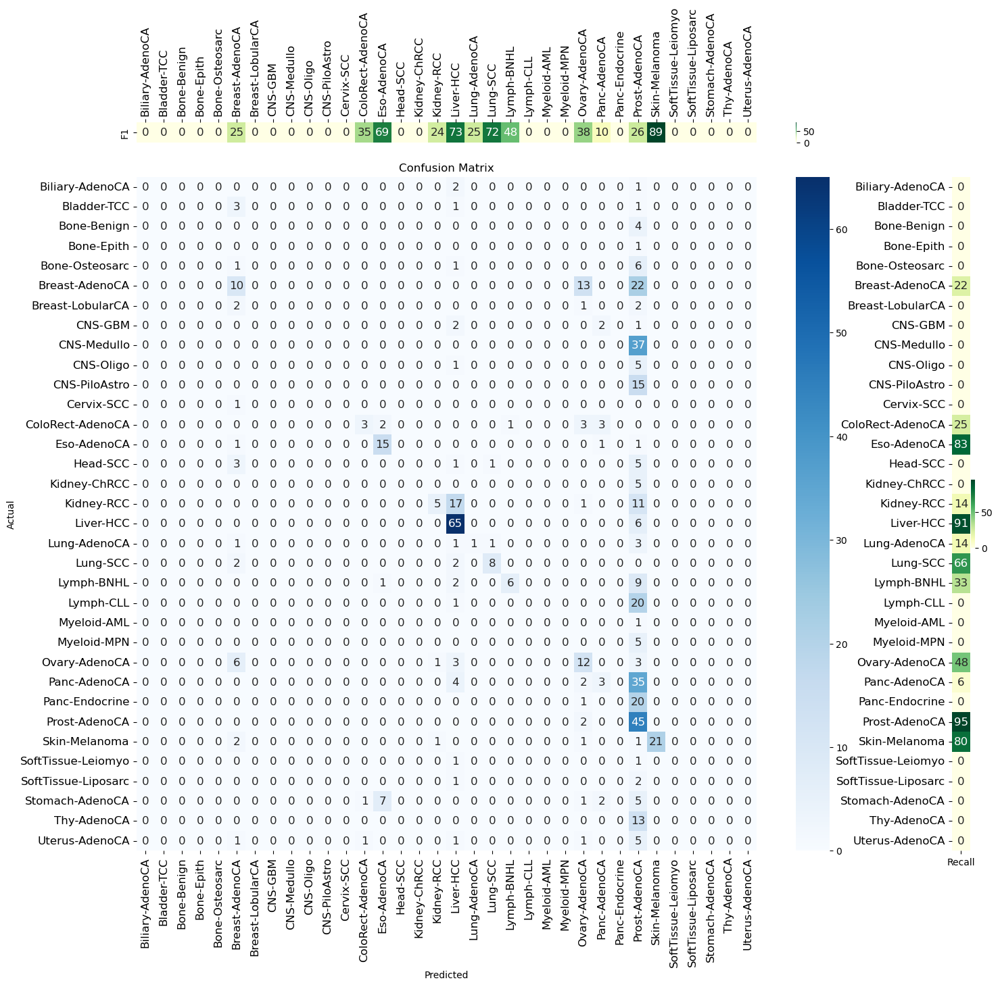

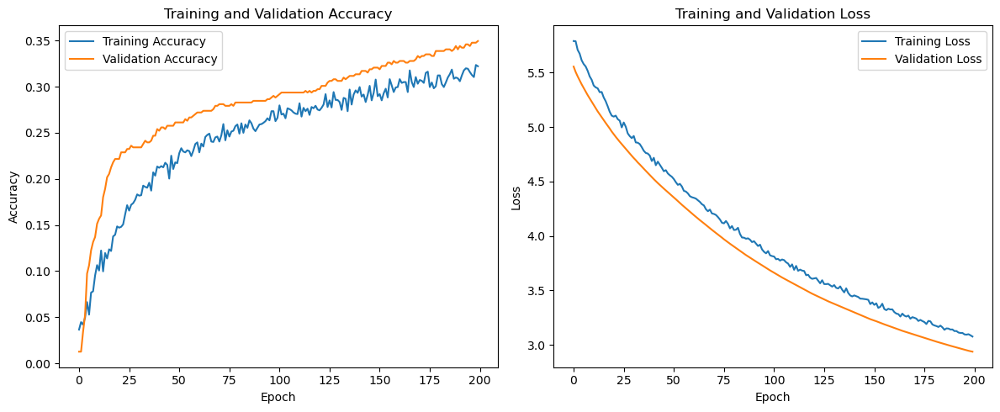

Accuracy on test data: 34.95%

Training with batch_size=4 and learning_rate=0.0001
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Accuracy on test data: 52.61%


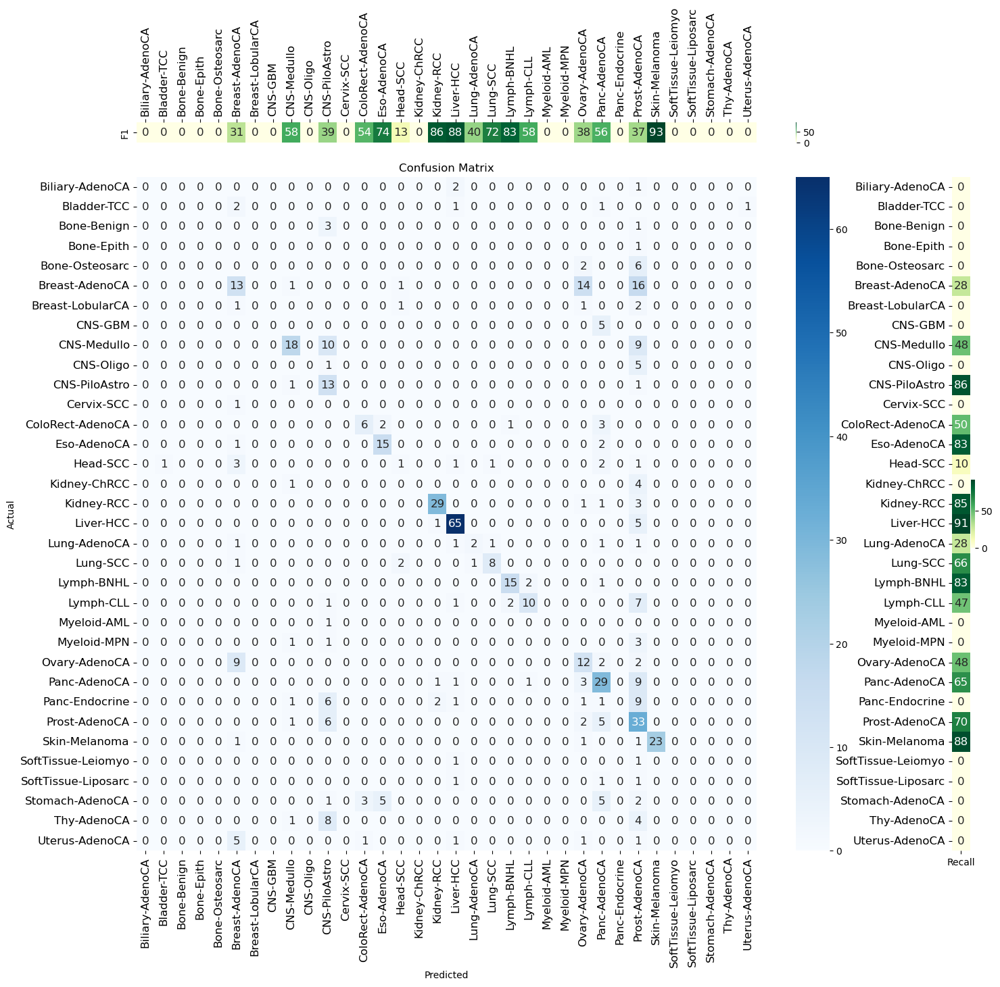

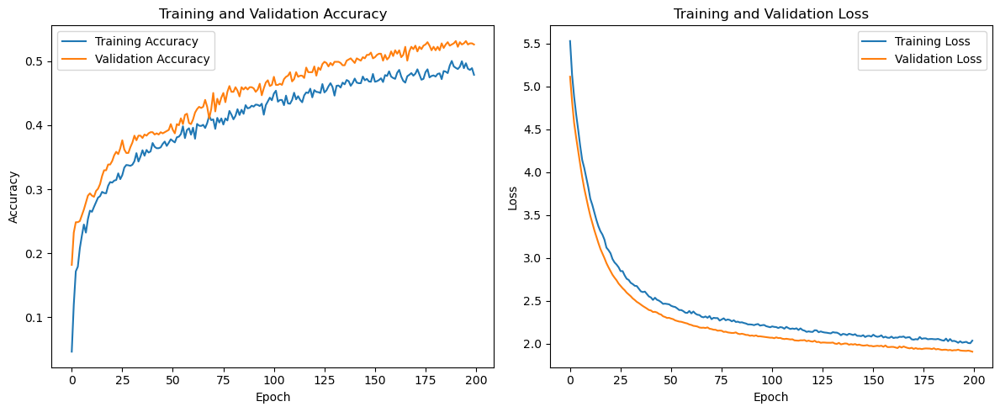

Accuracy on test data: 52.61%

Training with batch_size=4 and learning_rate=0.001
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 55.14%


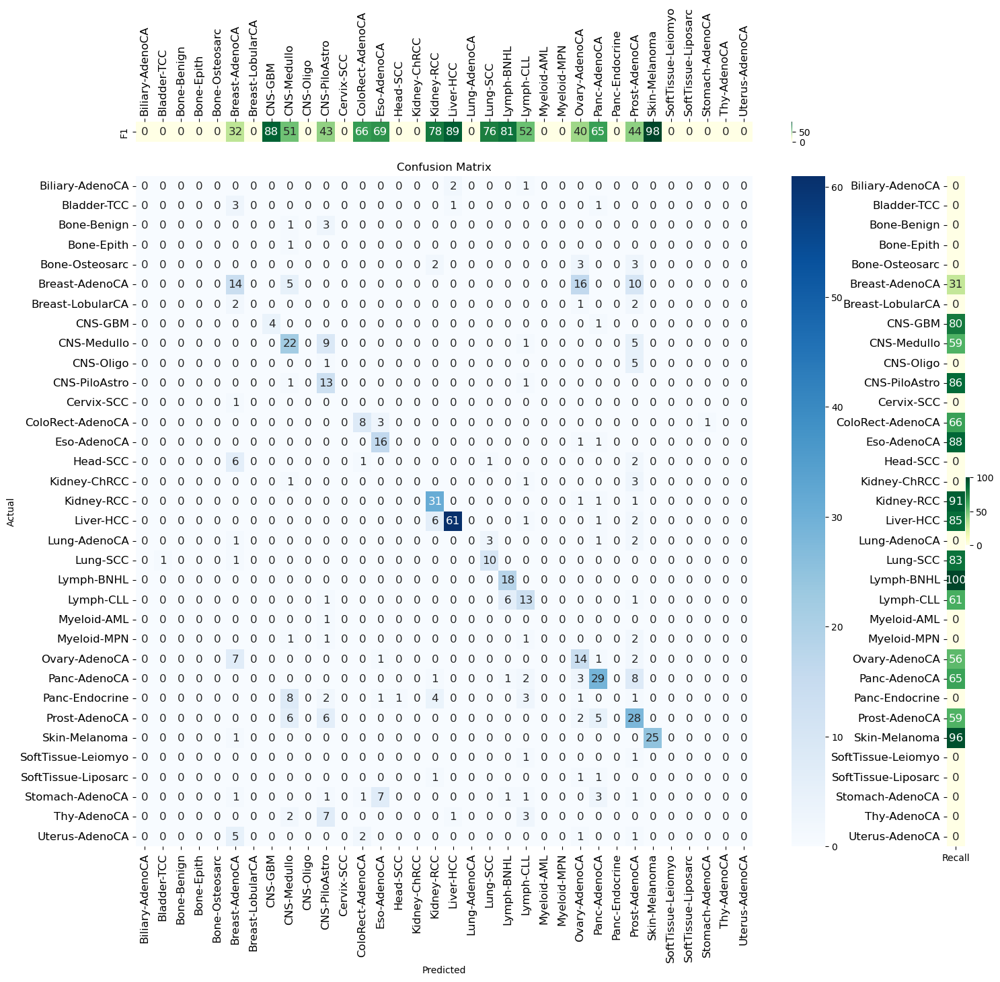

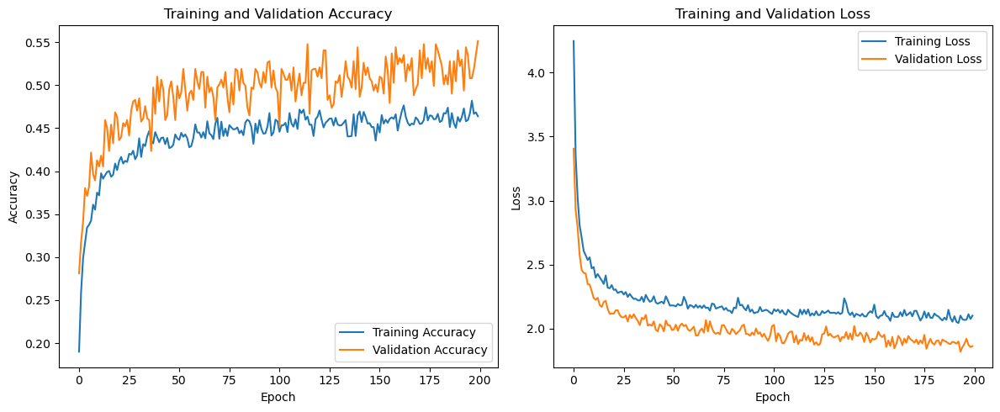

Accuracy on test data: 55.14%

Training with batch_size=8 and learning_rate=1e-05
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 30.81%


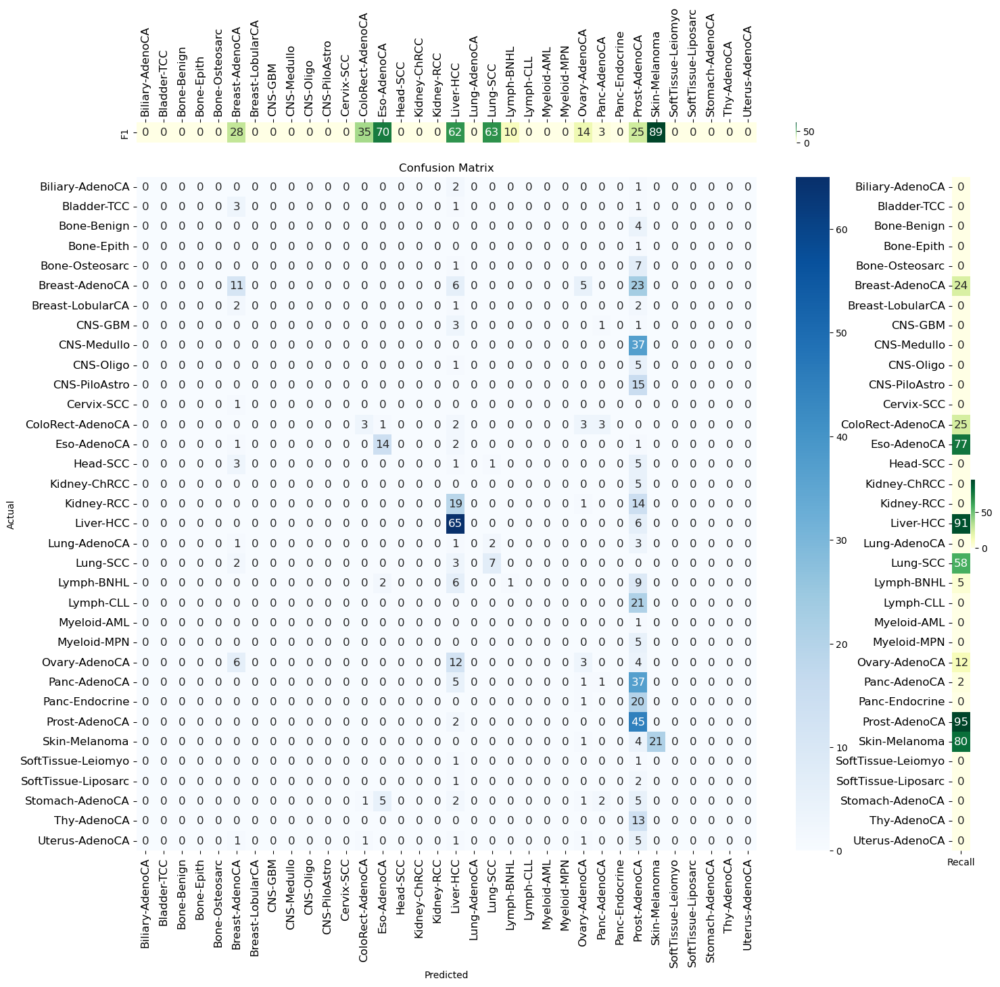

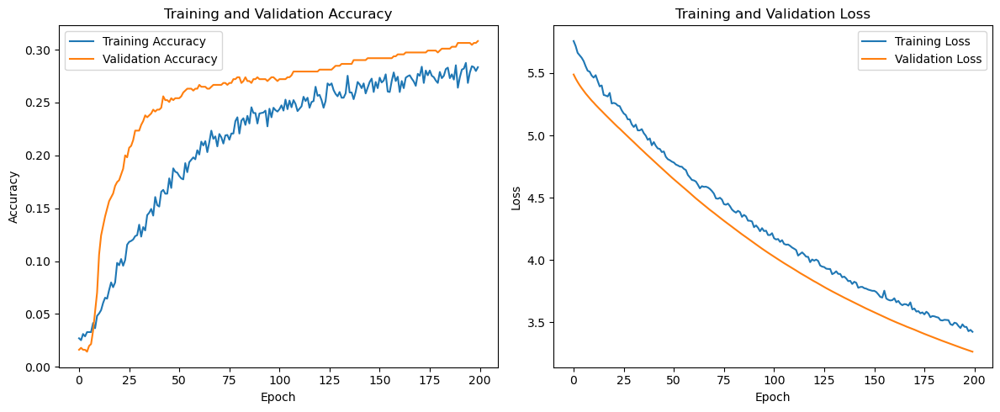

Accuracy on test data: 30.81%

Training with batch_size=8 and learning_rate=0.0001
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 49.19%


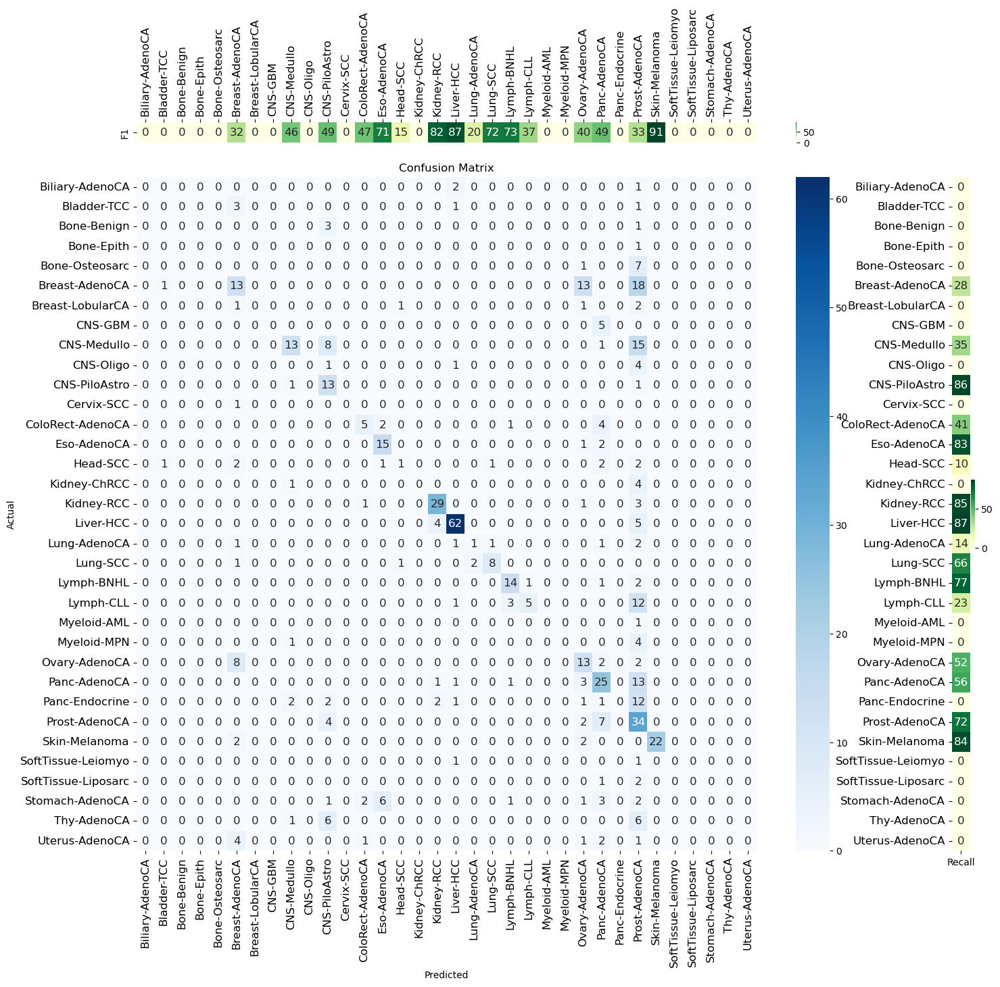

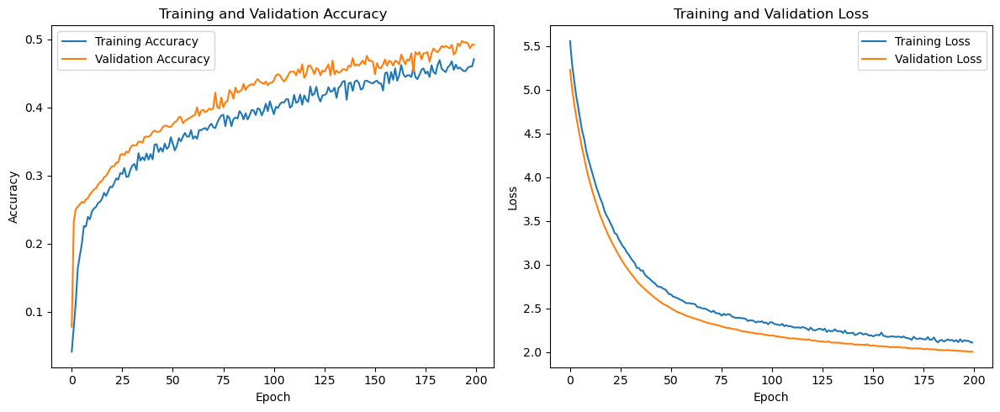

Accuracy on test data: 49.19%

Training with batch_size=8 and learning_rate=0.001
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 55.68%


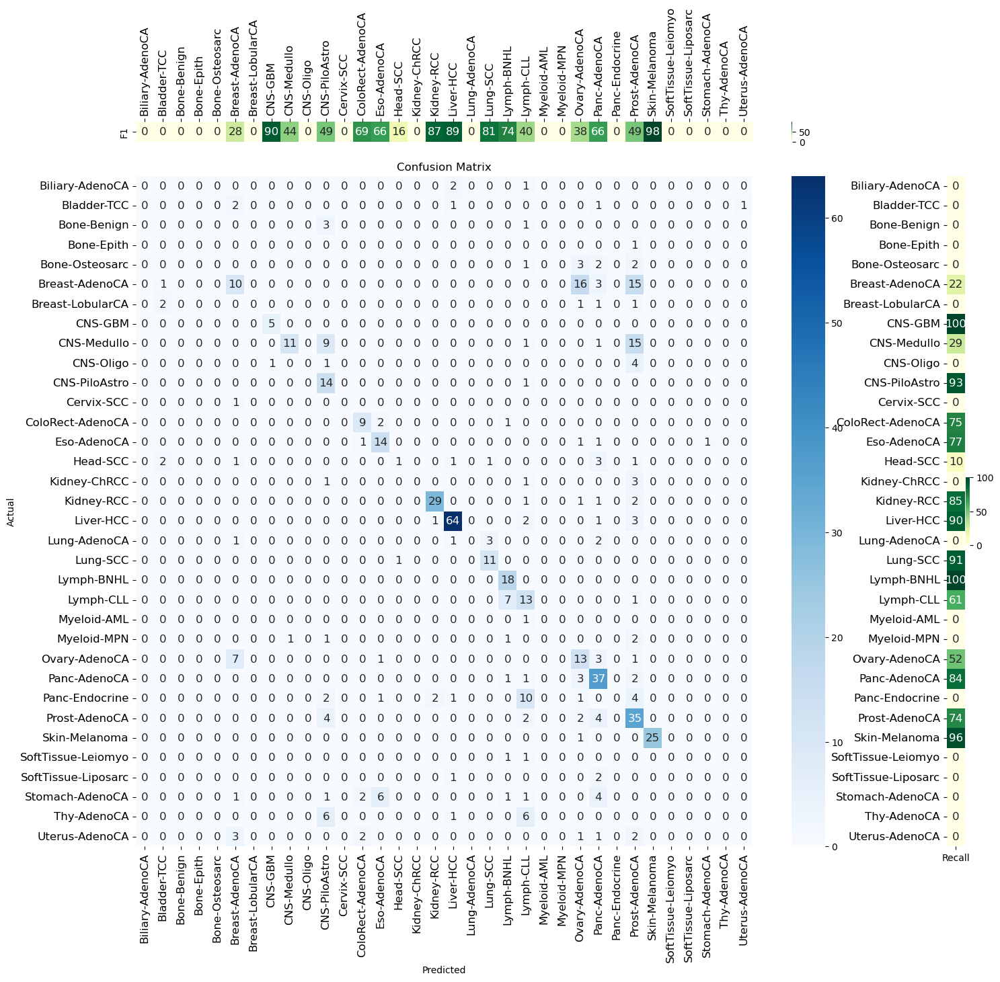

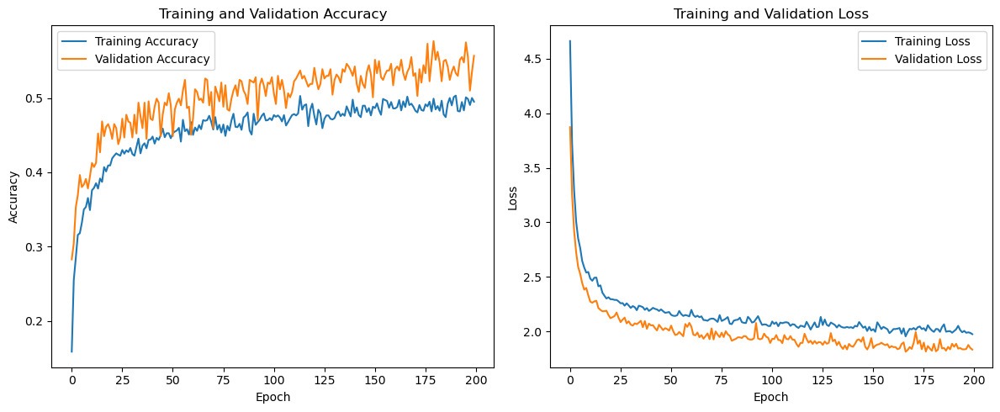

Accuracy on test data: 55.68%

Training with batch_size=16 and learning_rate=1e-05
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 29.01%


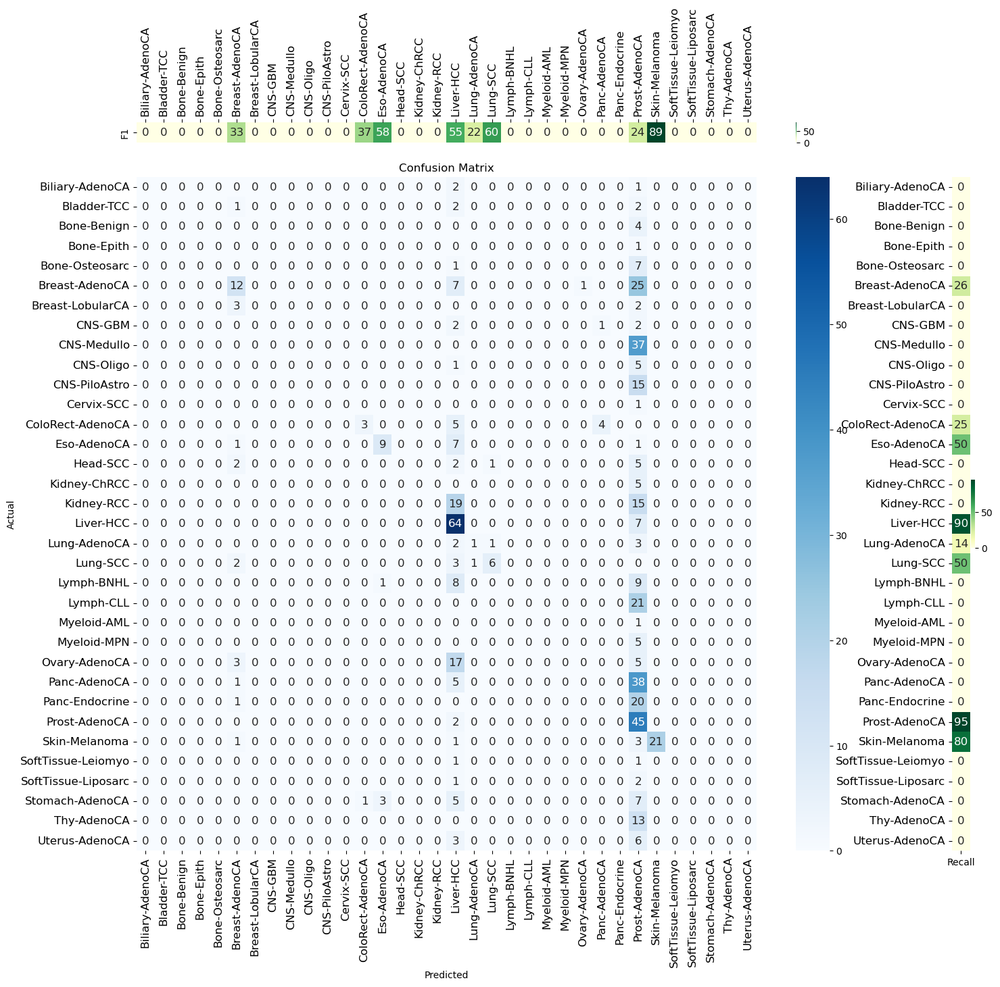

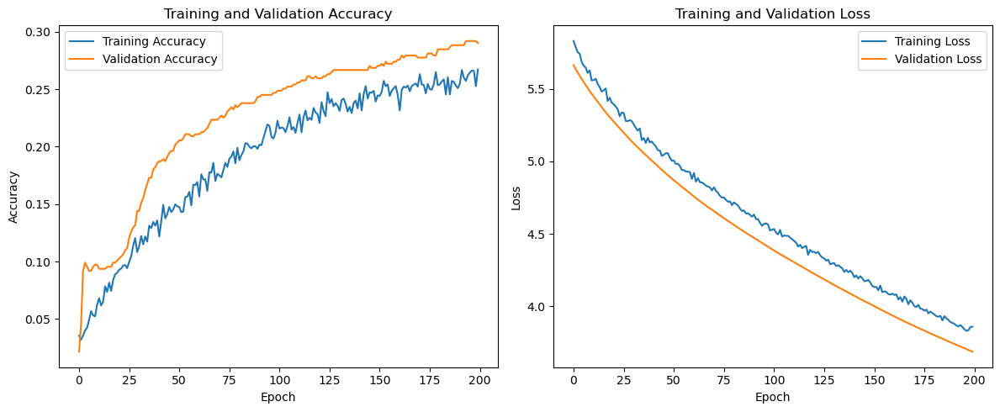

Accuracy on test data: 29.01%

Training with batch_size=16 and learning_rate=0.0001
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 46.85%


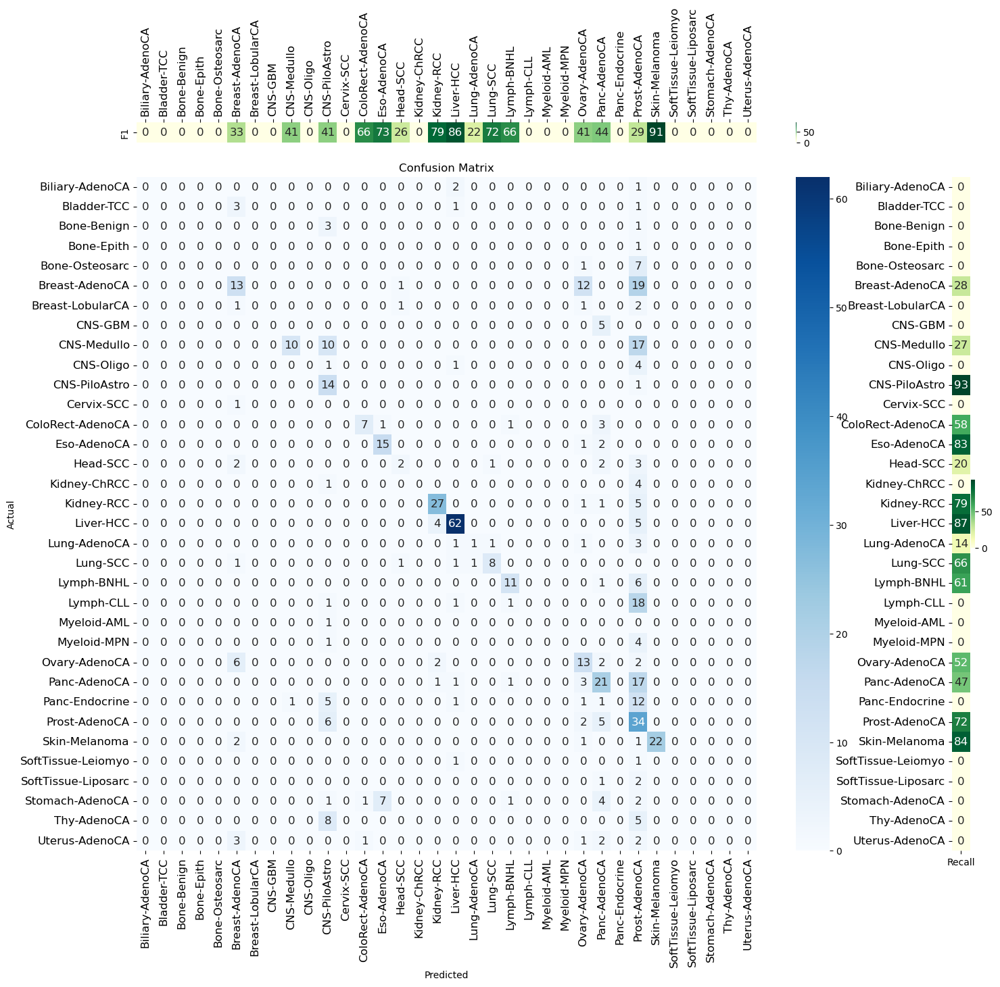

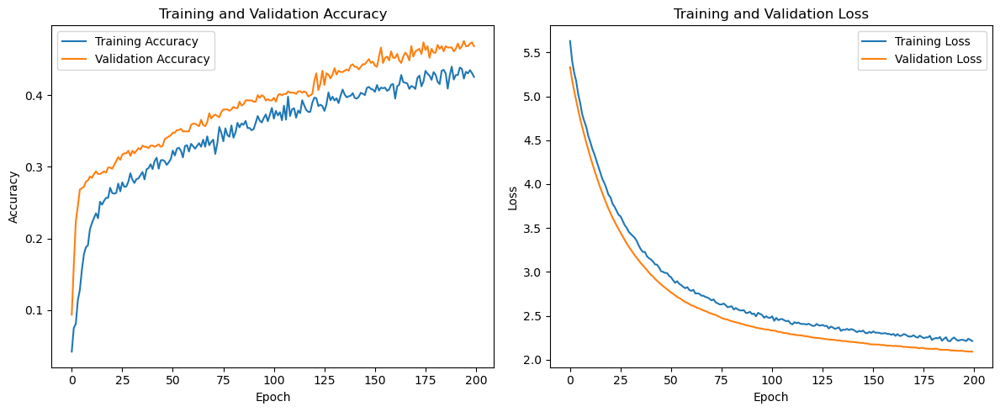

Accuracy on test data: 46.85%

Training with batch_size=16 and learning_rate=0.001
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 55.14%


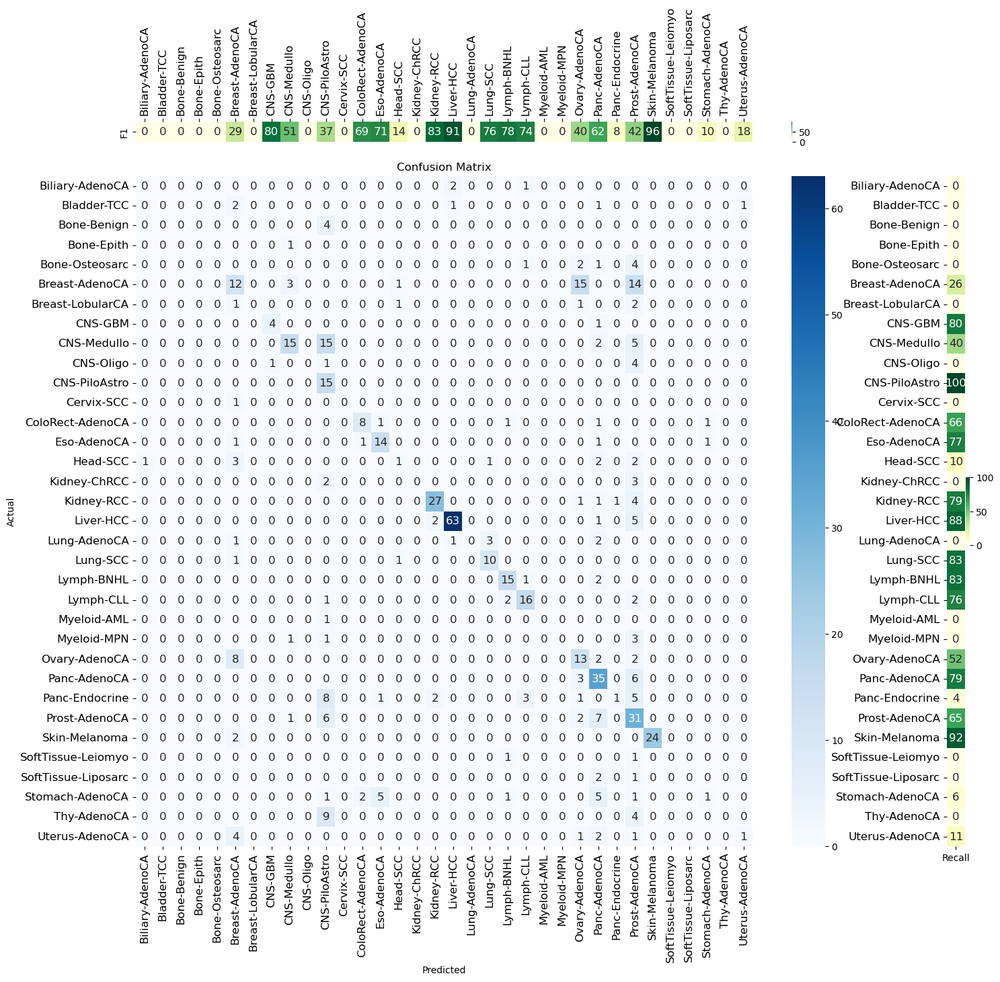

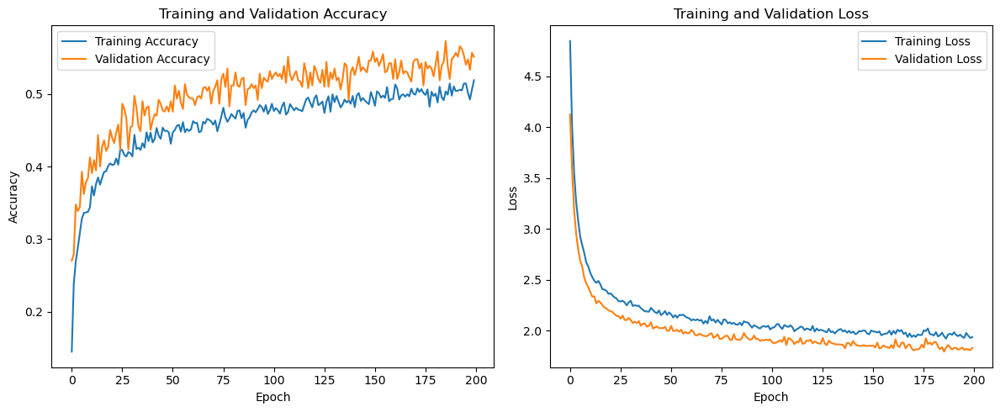

Accuracy on test data: 55.14%

Training with batch_size=32 and learning_rate=1e-05
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 27.39%


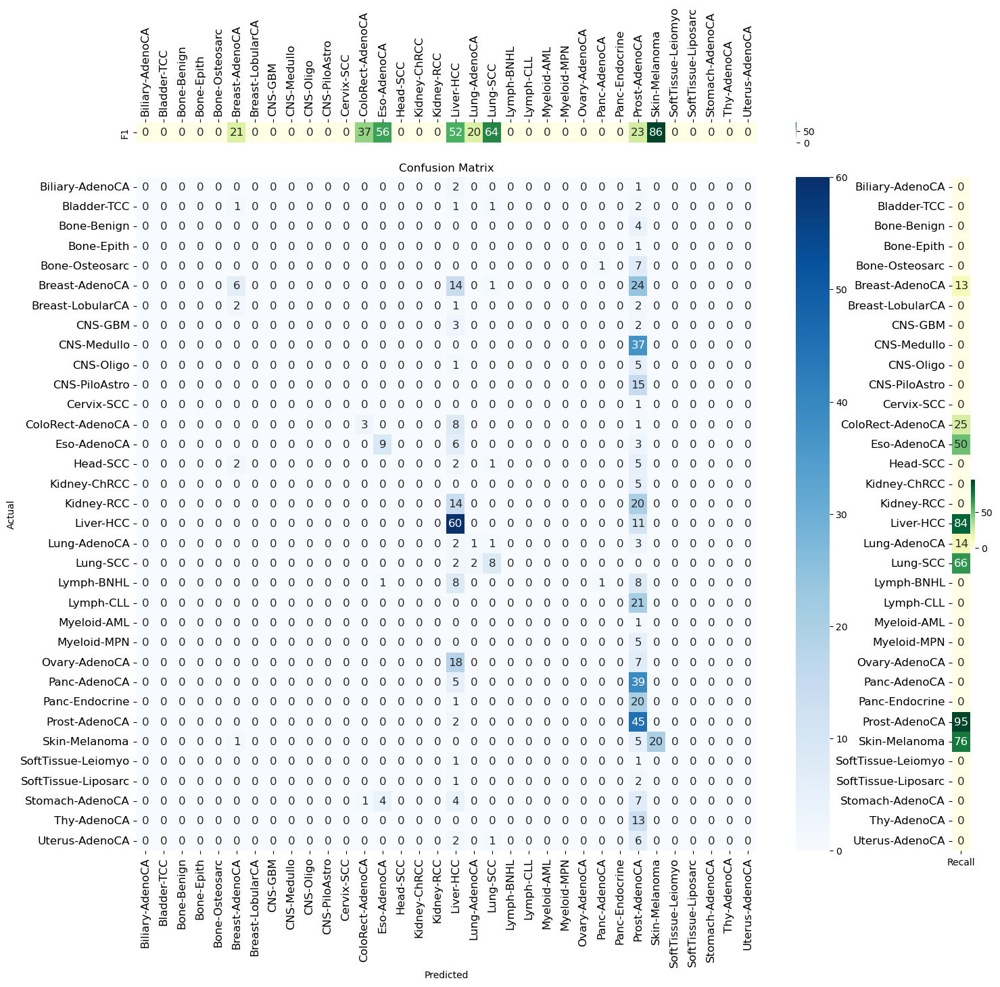

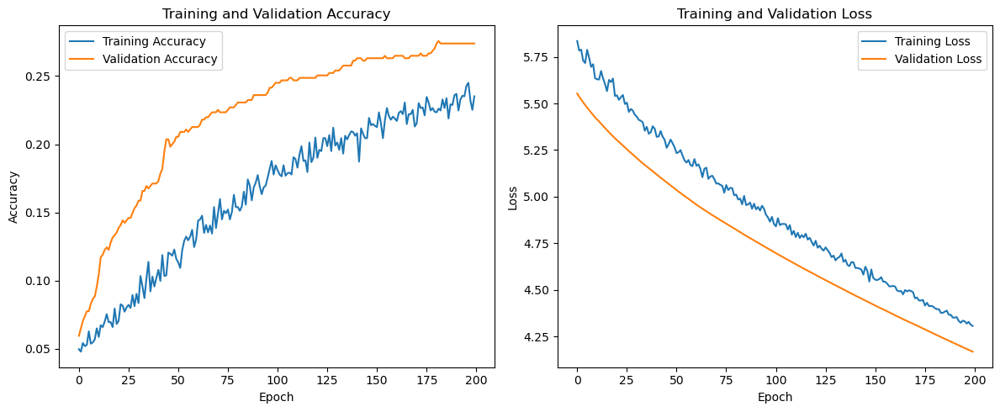

Accuracy on test data: 27.39%

Training with batch_size=32 and learning_rate=0.0001
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 43.96%


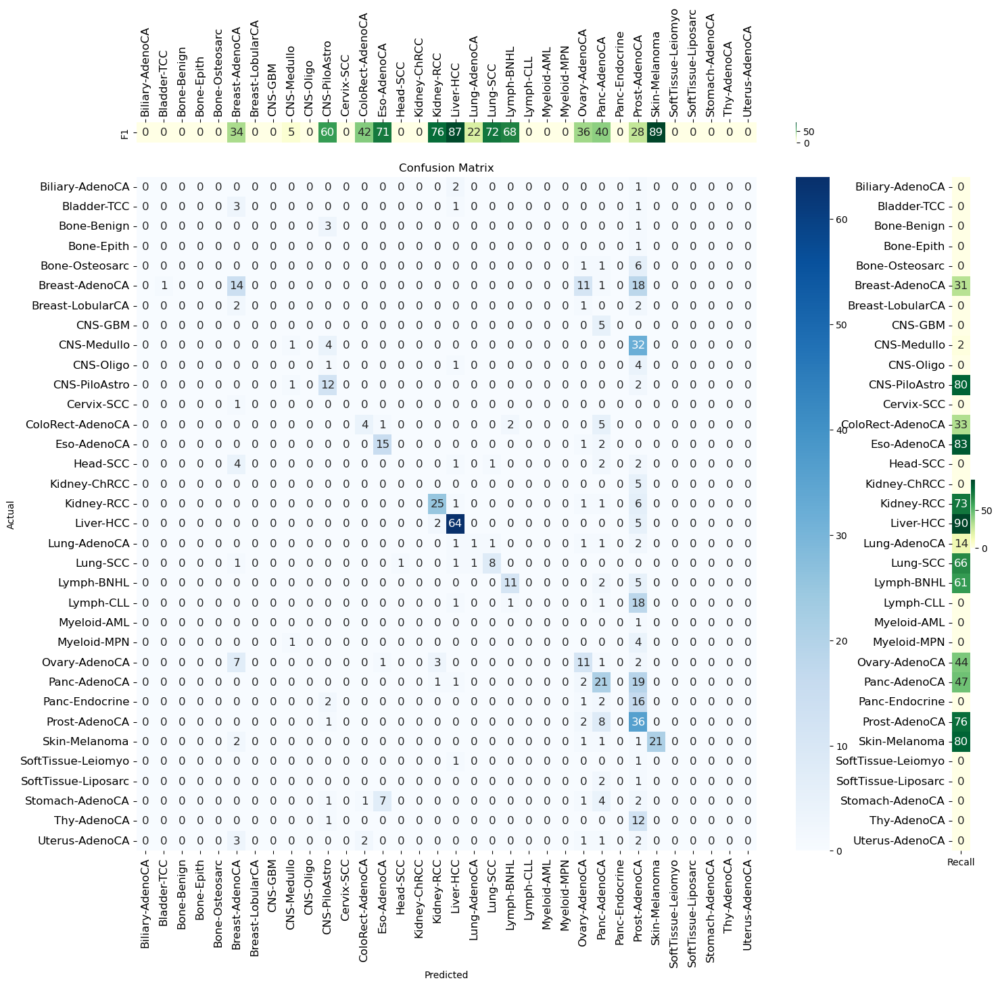

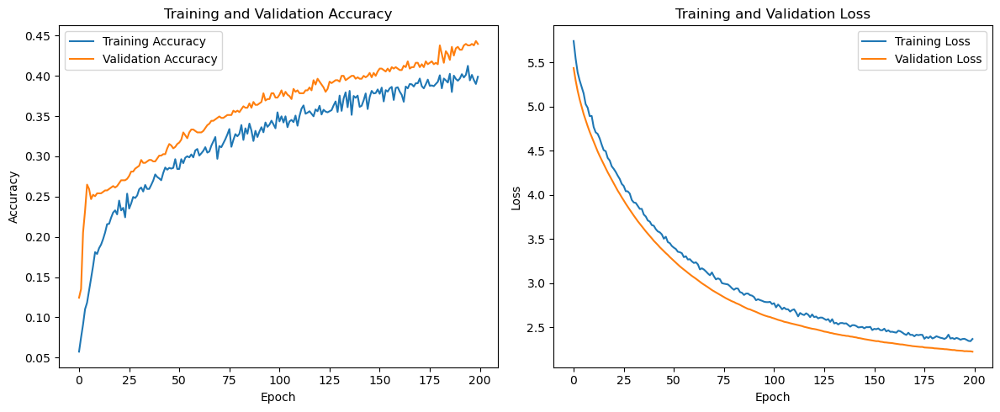

Accuracy on test data: 43.96%

Training with batch_size=32 and learning_rate=0.001
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 55.68%


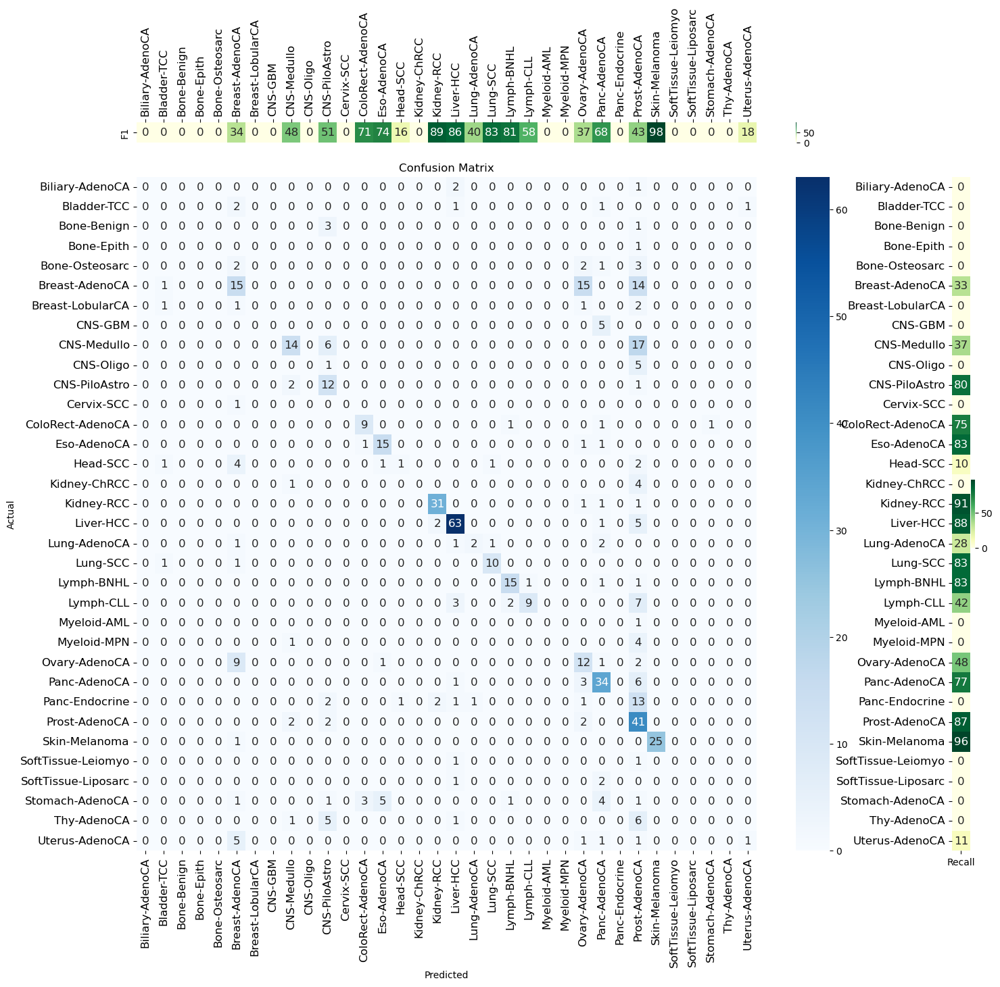

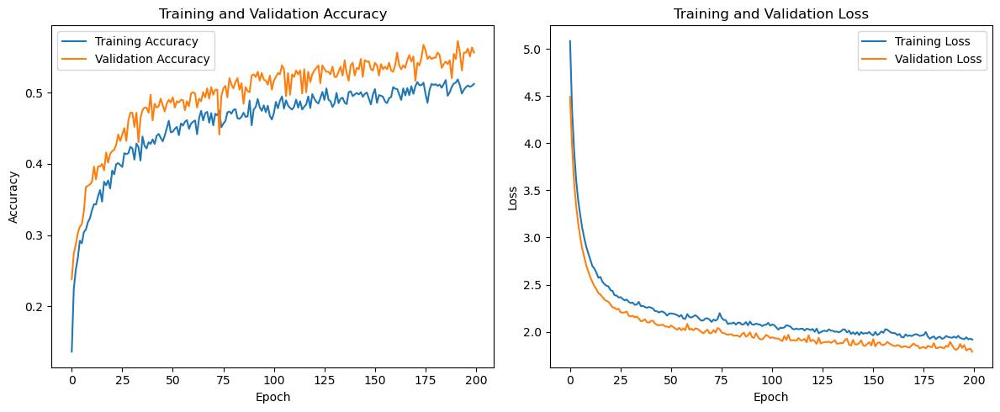

Accuracy on test data: 55.68%


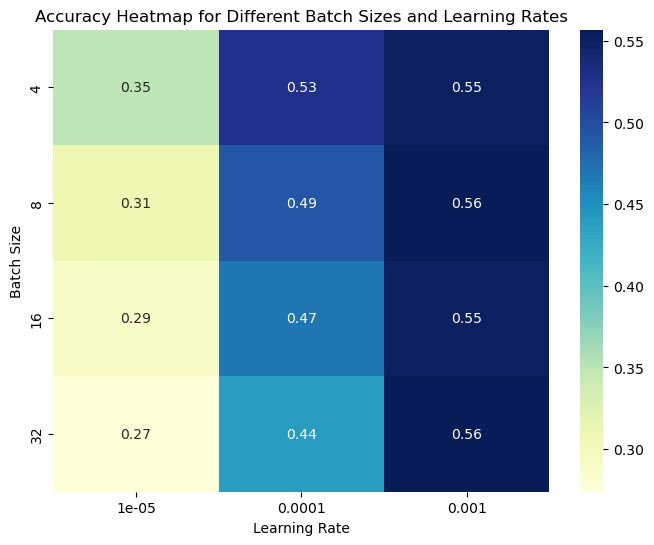

Best parameters: Batch Size = 8, Learning Rate = 0.001


In [276]:
best_batch_size, best_learning_rate, results, best_model = main_tune_para('./project_data/catalogs/WGS/WGS_PCAWG.96.csv', catalogs_wgs_pcawg, cancer_types_wgs_pcawg)

### LR=0.001, batch_size=32
val_acc = 65.77%


Feature nums: 96
Training Samples: 2216

Test Samples: 555
Epoch 1/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.0816 - loss: 5.4385 - val_accuracy: 0.2468 - val_loss: 4.5712
Epoch 2/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2397 - loss: 4.4523 - val_accuracy: 0.2613 - val_loss: 3.9930
Epoch 3/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2529 - loss: 3.9698 - val_accuracy: 0.2901 - val_loss: 3.5949
Epoch 4/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2442 - loss: 3.6698 - val_accuracy: 0.2937 - val_loss: 3.3294
Epoch 5/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2635 - loss: 3.4800 - val_accuracy: 0.3063 - val_loss: 3.1417
Epoch 6/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2971 - loss: 3.2163 - val_accuracy: 0.3568 - val_loss: 2.9824
Epoch 7/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2973 - loss: 3.1407 - val_accuracy: 0.3514 - val_loss: 2.8599
Epoch 8/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4

Epoch 51/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4319 - loss: 2.2591 - val_accuracy: 0.5045 - val_loss: 2.0377
Epoch 52/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4619 - loss: 2.1090 - val_accuracy: 0.5027 - val_loss: 2.0456
Epoch 53/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4469 - loss: 2.1636 - val_accuracy: 0.4721 - val_loss: 2.0624
Epoch 54/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4275 - loss: 2.2516 - val_accuracy: 0.4811 - val_loss: 2.0457
Epoch 55/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4621 - loss: 2.1472 - val_accuracy: 0.5027 - val_loss: 2.0223
Epoch 56/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4499 - loss: 2.1960 - val_accuracy: 0.4865 - val_loss: 2.0422
Epoch 57/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4466 - loss: 2.1892 - val_accuracy: 0.4919 - val_loss: 2.0277
Epoch 58/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4477 - loss: 2.1733 - val_accu

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4984 - loss: 1.9534 - val_accuracy: 0.5369 - val_loss: 1.8606
Epoch 152/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4981 - loss: 1.9570 - val_accuracy: 0.5369 - val_loss: 1.8741
Epoch 153/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5000 - loss: 1.9698 - val_accuracy: 0.5532 - val_loss: 1.8608
Epoch 154/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5142 - loss: 1.9361 - val_accuracy: 0.5279 - val_loss: 1.8716
Epoch 155/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4997 - loss: 1.9563 - val_accuracy: 0.5369 - val_loss: 1.8317
Epoch 156/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5102 - loss: 1.9280 - val_accuracy: 0.5351 - val_loss: 1.8510
Epoch 157/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4937 - loss: 1.9652 - val_accuracy: 0.5297 - val_loss: 1.8599
Epoch 158/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5034 - loss: 1.9668 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4973 - loss: 1.9936 - val_accuracy: 0.5261 - val_loss: 1.8476
Epoch 202/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4929 - loss: 1.9562 - val_accuracy: 0.5351 - val_loss: 1.8204
Epoch 203/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4882 - loss: 2.0499 - val_accuracy: 0.5477 - val_loss: 1.8498
Epoch 204/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4817 - loss: 2.0546 - val_accuracy: 0.5532 - val_loss: 1.8135
Epoch 205/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5224 - loss: 1.9044 - val_accuracy: 0.5477 - val_loss: 1.8219
Epoch 206/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5157 - loss: 1.9287 - val_accuracy: 0.5441 - val_loss: 1.8143
Epoch 207/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5210 - loss: 1.9209 - val_accuracy: 0.5550 - val_loss: 1.8042
Epoch 208/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5277 - loss: 1.9277 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5234 - loss: 1.8894 - val_accuracy: 0.5748 - val_loss: 1.7448
Epoch 252/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5425 - loss: 1.8835 - val_accuracy: 0.5694 - val_loss: 1.7604
Epoch 253/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5318 - loss: 1.9141 - val_accuracy: 0.5802 - val_loss: 1.7572
Epoch 254/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5508 - loss: 1.8453 - val_accuracy: 0.5784 - val_loss: 1.7548
Epoch 255/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5252 - loss: 1.8550 - val_accuracy: 0.5766 - val_loss: 1.7586
Epoch 256/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5158 - loss: 1.9545 - val_accuracy: 0.5568 - val_loss: 1.7720
Epoch 257/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5090 - loss: 1.9602 - val_accuracy: 0.5676 - val_loss: 1.7535
Epoch 258/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5419 - loss: 1.8772 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5295 - loss: 1.9094 - val_accuracy: 0.5568 - val_loss: 1.7398
Epoch 302/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5417 - loss: 1.8522 - val_accuracy: 0.5820 - val_loss: 1.7046
Epoch 303/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5375 - loss: 1.8750 - val_accuracy: 0.5694 - val_loss: 1.7528
Epoch 304/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5133 - loss: 1.9040 - val_accuracy: 0.5784 - val_loss: 1.7305
Epoch 305/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5226 - loss: 1.8436 - val_accuracy: 0.5856 - val_loss: 1.7286
Epoch 306/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5516 - loss: 1.8049 - val_accuracy: 0.5892 - val_loss: 1.7197
Epoch 307/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5433 - loss: 1.8675 - val_accuracy: 0.5784 - val_loss: 1.7601
Epoch 308/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5439 - loss: 1.8722 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5568 - loss: 1.8417 - val_accuracy: 0.6018 - val_loss: 1.7014
Epoch 352/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5328 - loss: 1.8389 - val_accuracy: 0.5928 - val_loss: 1.7154
Epoch 353/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5674 - loss: 1.7793 - val_accuracy: 0.5892 - val_loss: 1.7262
Epoch 354/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5425 - loss: 1.7851 - val_accuracy: 0.5838 - val_loss: 1.6937
Epoch 355/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5597 - loss: 1.7904 - val_accuracy: 0.5766 - val_loss: 1.7057
Epoch 356/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5727 - loss: 1.7643 - val_accuracy: 0.5946 - val_loss: 1.6836
Epoch 357/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5188 - loss: 1.9001 - val_accuracy: 0.6000 - val_loss: 1.6784
Epoch 358/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5377 - loss: 1.8294 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5755 - loss: 1.7684 - val_accuracy: 0.6090 - val_loss: 1.7319
Epoch 402/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5337 - loss: 1.8605 - val_accuracy: 0.5784 - val_loss: 1.7438
Epoch 403/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5936 - loss: 1.7584 - val_accuracy: 0.6090 - val_loss: 1.6884
Epoch 404/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5725 - loss: 1.7839 - val_accuracy: 0.5838 - val_loss: 1.7262
Epoch 405/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5562 - loss: 1.8359 - val_accuracy: 0.5622 - val_loss: 1.7585
Epoch 406/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5581 - loss: 1.8091 - val_accuracy: 0.5784 - val_loss: 1.6856
Epoch 407/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5642 - loss: 1.8064 - val_accuracy: 0.5964 - val_loss: 1.6660
Epoch 408/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5558 - loss: 1.8040 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5304 - loss: 1.8505 - val_accuracy: 0.5856 - val_loss: 1.6764
Epoch 452/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5728 - loss: 1.8100 - val_accuracy: 0.5946 - val_loss: 1.6588
Epoch 453/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5511 - loss: 1.7888 - val_accuracy: 0.5964 - val_loss: 1.6725
Epoch 454/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5527 - loss: 1.7692 - val_accuracy: 0.6072 - val_loss: 1.6769
Epoch 455/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5536 - loss: 1.7668 - val_accuracy: 0.5982 - val_loss: 1.6789
Epoch 456/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5572 - loss: 1.7739 - val_accuracy: 0.5946 - val_loss: 1.6811
Epoch 457/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5405 - loss: 1.7881 - val_accuracy: 0.5784 - val_loss: 1.6766
Epoch 458/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5523 - loss: 1.7853 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5692 - loss: 1.7289 - val_accuracy: 0.6018 - val_loss: 1.6379
Epoch 502/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5730 - loss: 1.7394 - val_accuracy: 0.6108 - val_loss: 1.6205
Epoch 503/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5606 - loss: 1.8104 - val_accuracy: 0.6126 - val_loss: 1.6522
Epoch 504/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5514 - loss: 1.8029 - val_accuracy: 0.6108 - val_loss: 1.6385
Epoch 505/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5875 - loss: 1.7234 - val_accuracy: 0.5928 - val_loss: 1.6926
Epoch 506/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5584 - loss: 1.7886 - val_accuracy: 0.6036 - val_loss: 1.6571
Epoch 507/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5604 - loss: 1.7577 - val_accuracy: 0.5946 - val_loss: 1.6385
Epoch 508/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5443 - loss: 1.8095 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5528 - loss: 1.7776 - val_accuracy: 0.6018 - val_loss: 1.6101
Epoch 552/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5478 - loss: 1.7613 - val_accuracy: 0.6198 - val_loss: 1.6298
Epoch 553/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5686 - loss: 1.7456 - val_accuracy: 0.6054 - val_loss: 1.6522
Epoch 554/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5529 - loss: 1.7747 - val_accuracy: 0.5982 - val_loss: 1.6809
Epoch 555/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5568 - loss: 1.7524 - val_accuracy: 0.6432 - val_loss: 1.6185
Epoch 556/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5757 - loss: 1.7575 - val_accuracy: 0.6072 - val_loss: 1.6270
Epoch 557/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5523 - loss: 1.7718 - val_accuracy: 0.6180 - val_loss: 1.5975
Epoch 558/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5584 - loss: 1.7759 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5587 - loss: 1.7805 - val_accuracy: 0.6252 - val_loss: 1.5929
Epoch 602/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5490 - loss: 1.7844 - val_accuracy: 0.6018 - val_loss: 1.6444
Epoch 603/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5542 - loss: 1.7908 - val_accuracy: 0.5928 - val_loss: 1.6477
Epoch 604/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5314 - loss: 1.8368 - val_accuracy: 0.6234 - val_loss: 1.5958
Epoch 605/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5865 - loss: 1.6777 - val_accuracy: 0.6072 - val_loss: 1.6394
Epoch 606/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5789 - loss: 1.6908 - val_accuracy: 0.6036 - val_loss: 1.6091
Epoch 607/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5725 - loss: 1.7802 - val_accuracy: 0.6126 - val_loss: 1.6171
Epoch 608/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5811 - loss: 1.6988 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5743 - loss: 1.7465 - val_accuracy: 0.6288 - val_loss: 1.5821
Epoch 652/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5518 - loss: 1.7777 - val_accuracy: 0.6072 - val_loss: 1.6141
Epoch 653/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5649 - loss: 1.7506 - val_accuracy: 0.6072 - val_loss: 1.6630
Epoch 654/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5811 - loss: 1.7815 - val_accuracy: 0.6108 - val_loss: 1.6160
Epoch 655/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5627 - loss: 1.7286 - val_accuracy: 0.6018 - val_loss: 1.6277
Epoch 656/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5568 - loss: 1.7515 - val_accuracy: 0.6180 - val_loss: 1.5661
Epoch 657/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5581 - loss: 1.7289 - val_accuracy: 0.6000 - val_loss: 1.6049
Epoch 658/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5798 - loss: 1.7539 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5365 - loss: 1.8182 - val_accuracy: 0.6288 - val_loss: 1.5939
Epoch 702/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5815 - loss: 1.7652 - val_accuracy: 0.6342 - val_loss: 1.5968
Epoch 703/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5613 - loss: 1.7267 - val_accuracy: 0.6432 - val_loss: 1.5710
Epoch 704/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5938 - loss: 1.6739 - val_accuracy: 0.6108 - val_loss: 1.6002
Epoch 705/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5574 - loss: 1.7876 - val_accuracy: 0.6486 - val_loss: 1.5731
Epoch 706/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5825 - loss: 1.7064 - val_accuracy: 0.6072 - val_loss: 1.5871
Epoch 707/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5817 - loss: 1.7085 - val_accuracy: 0.6216 - val_loss: 1.6056
Epoch 708/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5704 - loss: 1.7580 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5786 - loss: 1.6927 - val_accuracy: 0.6288 - val_loss: 1.5699
Epoch 752/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5752 - loss: 1.7386 - val_accuracy: 0.6162 - val_loss: 1.5954
Epoch 753/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5658 - loss: 1.7405 - val_accuracy: 0.6324 - val_loss: 1.5761
Epoch 754/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5572 - loss: 1.7701 - val_accuracy: 0.6234 - val_loss: 1.5946
Epoch 755/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5769 - loss: 1.7086 - val_accuracy: 0.6198 - val_loss: 1.6106
Epoch 756/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5946 - loss: 1.6851 - val_accuracy: 0.6450 - val_loss: 1.5573
Epoch 757/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5658 - loss: 1.7717 - val_accuracy: 0.6126 - val_loss: 1.6145
Epoch 758/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5599 - loss: 1.7686 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5816 - loss: 1.6938 - val_accuracy: 0.6378 - val_loss: 1.5626
Epoch 802/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5872 - loss: 1.6755 - val_accuracy: 0.6324 - val_loss: 1.5860
Epoch 803/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5681 - loss: 1.6960 - val_accuracy: 0.6306 - val_loss: 1.5736
Epoch 804/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5892 - loss: 1.6805 - val_accuracy: 0.6541 - val_loss: 1.5357
Epoch 805/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5813 - loss: 1.7172 - val_accuracy: 0.6144 - val_loss: 1.6044
Epoch 806/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5734 - loss: 1.6912 - val_accuracy: 0.6162 - val_loss: 1.5948
Epoch 807/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5904 - loss: 1.7567 - val_accuracy: 0.6378 - val_loss: 1.5581
Epoch 808/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5802 - loss: 1.7014 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5909 - loss: 1.7394 - val_accuracy: 0.6649 - val_loss: 1.5207
Epoch 852/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5514 - loss: 1.7878 - val_accuracy: 0.6432 - val_loss: 1.5532
Epoch 853/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5843 - loss: 1.7074 - val_accuracy: 0.6234 - val_loss: 1.5687
Epoch 854/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5722 - loss: 1.7069 - val_accuracy: 0.6144 - val_loss: 1.5730
Epoch 855/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5808 - loss: 1.6959 - val_accuracy: 0.6450 - val_loss: 1.5436
Epoch 856/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5533 - loss: 1.7429 - val_accuracy: 0.6468 - val_loss: 1.5770
Epoch 857/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5804 - loss: 1.7006 - val_accuracy: 0.6054 - val_loss: 1.6100
Epoch 858/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5271 - loss: 1.8111 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5919 - loss: 1.6694 - val_accuracy: 0.6306 - val_loss: 1.5904
Epoch 902/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5776 - loss: 1.6866 - val_accuracy: 0.6541 - val_loss: 1.5340
Epoch 903/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5908 - loss: 1.6687 - val_accuracy: 0.6306 - val_loss: 1.5770
Epoch 904/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5883 - loss: 1.7216 - val_accuracy: 0.6306 - val_loss: 1.5541
Epoch 905/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5755 - loss: 1.7180 - val_accuracy: 0.6378 - val_loss: 1.5608
Epoch 906/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5739 - loss: 1.7317 - val_accuracy: 0.6162 - val_loss: 1.5825
Epoch 907/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5760 - loss: 1.7165 - val_accuracy: 0.6414 - val_loss: 1.5766
Epoch 908/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6045 - loss: 1.6389 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5989 - loss: 1.6706 - val_accuracy: 0.5946 - val_loss: 1.6056
Epoch 952/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5541 - loss: 1.7734 - val_accuracy: 0.6432 - val_loss: 1.5702
Epoch 953/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5649 - loss: 1.7623 - val_accuracy: 0.6198 - val_loss: 1.5669
Epoch 954/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5696 - loss: 1.7153 - val_accuracy: 0.6144 - val_loss: 1.5843
Epoch 955/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5860 - loss: 1.7020 - val_accuracy: 0.6144 - val_loss: 1.6180
Epoch 956/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5865 - loss: 1.6934 - val_accuracy: 0.6270 - val_loss: 1.5507
Epoch 957/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5737 - loss: 1.7436 - val_accuracy: 0.6378 - val_loss: 1.5616
Epoch 958/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5897 - loss: 1.7145 - val_accuracy: 0

70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5749 - loss: 1.7287 - val_accuracy: 0.6198 - val_loss: 1.6033
Epoch 1002/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5651 - loss: 1.7500 - val_accuracy: 0.6342 - val_loss: 1.6023
Epoch 1003/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5789 - loss: 1.7238 - val_accuracy: 0.6306 - val_loss: 1.6093
Epoch 1004/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5747 - loss: 1.7392 - val_accuracy: 0.6270 - val_loss: 1.5678
Epoch 1005/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5670 - loss: 1.6906 - val_accuracy: 0.6072 - val_loss: 1.5893
Epoch 1006/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5611 - loss: 1.7519 - val_accuracy: 0.6396 - val_loss: 1.5444
Epoch 1007/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5664 - loss: 1.7262 - val_accuracy: 0.6450 - val_loss: 1.5523
Epoch 1008/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5995 - loss: 1.6341 - val_accu

Epoch 1051/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5827 - loss: 1.7144 - val_accuracy: 0.6414 - val_loss: 1.5471
Epoch 1052/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5680 - loss: 1.6872 - val_accuracy: 0.6378 - val_loss: 1.5669
Epoch 1053/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5786 - loss: 1.6748 - val_accuracy: 0.6234 - val_loss: 1.5781
Epoch 1054/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6017 - loss: 1.6470 - val_accuracy: 0.6414 - val_loss: 1.5666
Epoch 1055/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5714 - loss: 1.7035 - val_accuracy: 0.6360 - val_loss: 1.5788
Epoch 1056/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5736 - loss: 1.7320 - val_accuracy: 0.6342 - val_loss: 1.5547
Epoch 1057/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5674 - loss: 1.6978 - val_accuracy: 0.6432 - val_loss: 1.5526
Epoch 1058/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5695 - loss: 1

Epoch 1150/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5813 - loss: 1.6525 - val_accuracy: 0.6000 - val_loss: 1.6495
Epoch 1151/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5906 - loss: 1.7027 - val_accuracy: 0.6414 - val_loss: 1.5134
Epoch 1152/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5772 - loss: 1.6744 - val_accuracy: 0.6378 - val_loss: 1.5422
Epoch 1153/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5760 - loss: 1.7287 - val_accuracy: 0.6559 - val_loss: 1.5115
Epoch 1154/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5780 - loss: 1.7012 - val_accuracy: 0.6234 - val_loss: 1.5369
Epoch 1155/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5866 - loss: 1.6719 - val_accuracy: 0.6613 - val_loss: 1.5348
Epoch 1156/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6122 - loss: 1.6305 - val_accuracy: 0.6288 - val_loss: 1.5757
Epoch 1157/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5792 - loss: 1

Epoch 1249/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5977 - loss: 1.6399 - val_accuracy: 0.6288 - val_loss: 1.5347
Epoch 1250/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6007 - loss: 1.6705 - val_accuracy: 0.6450 - val_loss: 1.5521
Epoch 1251/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6061 - loss: 1.6314 - val_accuracy: 0.6378 - val_loss: 1.5506
Epoch 1252/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5740 - loss: 1.6879 - val_accuracy: 0.6054 - val_loss: 1.6122
Epoch 1253/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5936 - loss: 1.7013 - val_accuracy: 0.6162 - val_loss: 1.5723
Epoch 1254/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5944 - loss: 1.6416 - val_accuracy: 0.6342 - val_loss: 1.5418
Epoch 1255/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5879 - loss: 1.6632 - val_accuracy: 0.6378 - val_loss: 1.5300
Epoch 1256/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6128 - loss: 1

Epoch 1348/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5888 - loss: 1.6563 - val_accuracy: 0.6324 - val_loss: 1.5093
Epoch 1349/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5956 - loss: 1.6283 - val_accuracy: 0.6342 - val_loss: 1.5282
Epoch 1350/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5787 - loss: 1.6515 - val_accuracy: 0.6342 - val_loss: 1.5109
Epoch 1351/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5928 - loss: 1.6500 - val_accuracy: 0.6234 - val_loss: 1.5159
Epoch 1352/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6033 - loss: 1.6281 - val_accuracy: 0.6342 - val_loss: 1.5683
Epoch 1353/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5984 - loss: 1.6454 - val_accuracy: 0.6468 - val_loss: 1.4987
Epoch 1354/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5984 - loss: 1.6407 - val_accuracy: 0.6270 - val_loss: 1.5297
Epoch 1355/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5921 - loss: 1

Epoch 1447/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5865 - loss: 1.6644 - val_accuracy: 0.6396 - val_loss: 1.5606
Epoch 1448/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5760 - loss: 1.6822 - val_accuracy: 0.6270 - val_loss: 1.5633
Epoch 1449/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5970 - loss: 1.6644 - val_accuracy: 0.6288 - val_loss: 1.5406
Epoch 1450/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5878 - loss: 1.6821 - val_accuracy: 0.6252 - val_loss: 1.5252
Epoch 1451/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5986 - loss: 1.6359 - val_accuracy: 0.6396 - val_loss: 1.4891
Epoch 1452/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6100 - loss: 1.6319 - val_accuracy: 0.6342 - val_loss: 1.5206
Epoch 1453/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5993 - loss: 1.6116 - val_accuracy: 0.6414 - val_loss: 1.5054
Epoch 1454/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5939 - loss: 1

Epoch 1546/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6149 - loss: 1.5917 - val_accuracy: 0.6523 - val_loss: 1.5155
Epoch 1547/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5708 - loss: 1.7173 - val_accuracy: 0.6234 - val_loss: 1.5385
Epoch 1548/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5835 - loss: 1.6766 - val_accuracy: 0.6162 - val_loss: 1.5423
Epoch 1549/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5703 - loss: 1.7317 - val_accuracy: 0.6505 - val_loss: 1.5141
Epoch 1550/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5810 - loss: 1.6983 - val_accuracy: 0.6288 - val_loss: 1.5131
Epoch 1551/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5895 - loss: 1.6455 - val_accuracy: 0.6613 - val_loss: 1.5025
Epoch 1552/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6059 - loss: 1.6369 - val_accuracy: 0.6631 - val_loss: 1.5093
Epoch 1553/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6070 - loss: 1

Epoch 1645/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5767 - loss: 1.6595 - val_accuracy: 0.6306 - val_loss: 1.5280
Epoch 1646/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5825 - loss: 1.7179 - val_accuracy: 0.6180 - val_loss: 1.5511
Epoch 1647/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5863 - loss: 1.6597 - val_accuracy: 0.6144 - val_loss: 1.5613
Epoch 1648/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5789 - loss: 1.6792 - val_accuracy: 0.6486 - val_loss: 1.5015
Epoch 1649/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5676 - loss: 1.7201 - val_accuracy: 0.6108 - val_loss: 1.5535
Epoch 1650/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5568 - loss: 1.7250 - val_accuracy: 0.6144 - val_loss: 1.5350
Epoch 1651/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5831 - loss: 1.6690 - val_accuracy: 0.6216 - val_loss: 1.5150
Epoch 1652/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5713 - loss: 1

Epoch 1744/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5833 - loss: 1.6989 - val_accuracy: 0.6378 - val_loss: 1.5166
Epoch 1745/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5699 - loss: 1.7205 - val_accuracy: 0.6577 - val_loss: 1.4850
Epoch 1746/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5826 - loss: 1.6474 - val_accuracy: 0.6342 - val_loss: 1.5003
Epoch 1747/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5819 - loss: 1.6860 - val_accuracy: 0.6450 - val_loss: 1.5196
Epoch 1748/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5796 - loss: 1.7120 - val_accuracy: 0.6523 - val_loss: 1.5003
Epoch 1749/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5694 - loss: 1.6845 - val_accuracy: 0.6505 - val_loss: 1.5022
Epoch 1750/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5975 - loss: 1.6366 - val_accuracy: 0.6072 - val_loss: 1.5306
Epoch 1751/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6092 - loss: 1

Epoch 1843/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5897 - loss: 1.6309 - val_accuracy: 0.6685 - val_loss: 1.4568
Epoch 1844/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5859 - loss: 1.6463 - val_accuracy: 0.6541 - val_loss: 1.4885
Epoch 1845/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5955 - loss: 1.6445 - val_accuracy: 0.6270 - val_loss: 1.4926
Epoch 1846/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6067 - loss: 1.5994 - val_accuracy: 0.6072 - val_loss: 1.5736
Epoch 1847/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6001 - loss: 1.6308 - val_accuracy: 0.6288 - val_loss: 1.5644
Epoch 1848/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5674 - loss: 1.7403 - val_accuracy: 0.6613 - val_loss: 1.5220
Epoch 1849/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5789 - loss: 1.6711 - val_accuracy: 0.6649 - val_loss: 1.4833
Epoch 1850/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5637 - loss: 1

Epoch 1942/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5733 - loss: 1.6681 - val_accuracy: 0.6090 - val_loss: 1.5774
Epoch 1943/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5859 - loss: 1.5916 - val_accuracy: 0.6577 - val_loss: 1.4735
Epoch 1944/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5840 - loss: 1.6683 - val_accuracy: 0.6450 - val_loss: 1.5023
Epoch 1945/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5820 - loss: 1.6566 - val_accuracy: 0.6559 - val_loss: 1.4779
Epoch 1946/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5802 - loss: 1.6552 - val_accuracy: 0.6342 - val_loss: 1.5289
Epoch 1947/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6123 - loss: 1.6046 - val_accuracy: 0.6486 - val_loss: 1.4711
Epoch 1948/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5926 - loss: 1.6270 - val_accuracy: 0.6450 - val_loss: 1.4766
Epoch 1949/2000
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5726 - loss: 1

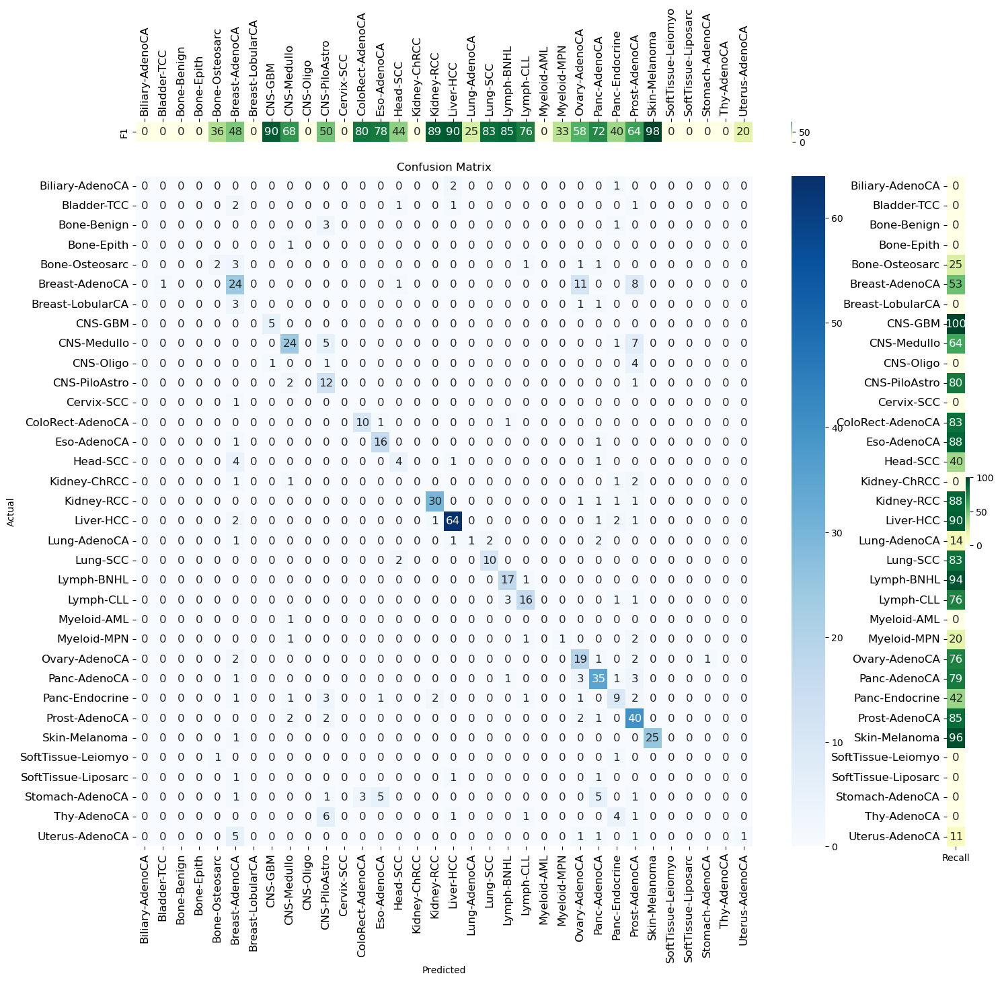

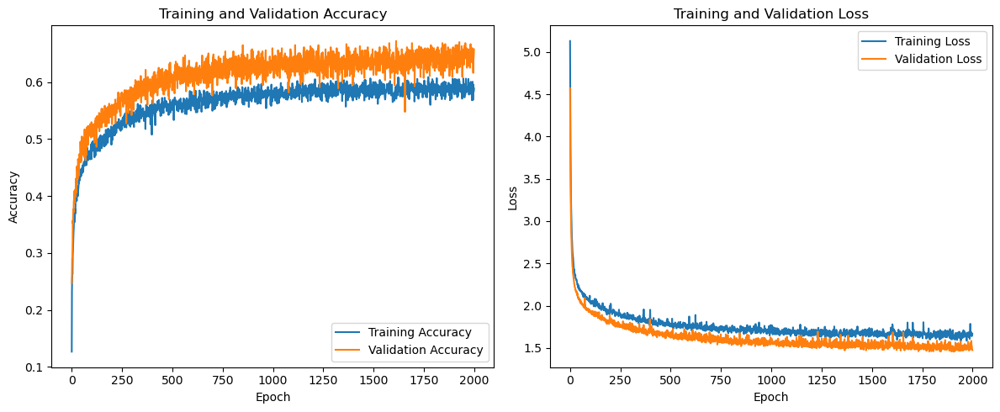

In [281]:
model1,accuracy1,y_pred1,history1 = main('./project_data/catalogs/WGS/WGS_PCAWG.96.csv', catalogs_wgs_pcawg, cancer_types_wgs_pcawg, 2000,learning_rate=0.001, batch_size=32)

### Conversion from category 34 to category 21

In [408]:
X_train, X_test, y_train, y_test = split_data('./project_data/catalogs/WGS/WGS_PCAWG.96.csv', catalogs_wgs_pcawg, cancer_types_wgs_pcawg)

# Label encoding for target variable
encoder = LabelEncoder()
y_train_encoded = encoder.fit_transform(y_train)
y_test_encoded = encoder.transform(y_test)



Feature nums: 96
Training Samples: 2216

Test Samples: 555


In [466]:
def conv(encoder,y_test_encoded,y_pred1):
    suffix_array = np.array([item.split('-')[1] if '-' in item else item for item in encoder.classes_])

    unique_suffix = np.unique(suffix_array)
    index_mapping = {encoder.classes_[index]: np.where(unique_suffix == suffix)[0][0] for index, suffix in enumerate(suffix_array)}
    new_y_test_encoded = np.array([index_mapping[encoder.classes_[i]] for i in y_test_encoded])
    new_y_pred1 = np.array([index_mapping[encoder.classes_[i]] for i in y_pred1])
    new_accuracy = accuracy_score(new_y_test_encoded, new_y_pred1)
    print("val_acc = ",new_accuracy)
    plot_ax('./project_data/catalogs/WGS/WGS_PCAWG.96.csv'[:-4]+"ax.png",new_y_pred1,new_y_test_encoded,unique_suffix)
#     print(unique_suffix,index_mapping)

In [467]:
def main_conv(data_path, data, cancer_types, epochs=200, batch_size=32,learning_rate=0.001):
    X_train, X_test, y_train, y_test = split_data(data_path, data, cancer_types)

    # Label encoding for target variable
    encoder = LabelEncoder()
    y_train_encoded = encoder.fit_transform(y_train)
    y_test_encoded = encoder.transform(y_test)
    
    model = creat_opt_basic_model(X_train, encoder)    
    
    model,accuracy,y_pred,history = train(epochs, model,X_train,y_train_encoded,X_test,y_test_encoded,batch_size,learning_rate)
    
    plot_ax(data_path[:-4]+"ax.png",y_pred,y_test_encoded,encoder.classes_) 
    conv(encoder,y_test_encoded,y_pred)
    plot_history(data_path[:-4],history)
    
    return model,accuracy,y_pred,history

val_acc =  0.7783783783783784


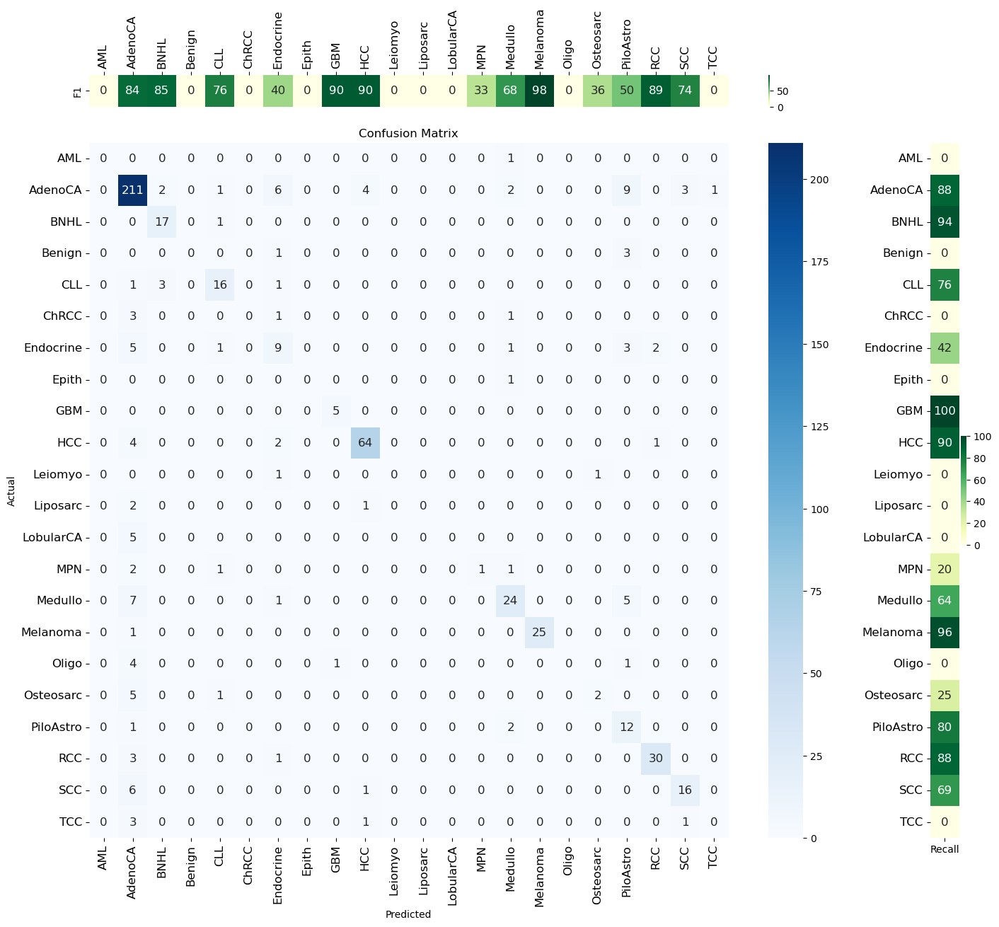

In [468]:
conv(encoder,y_test_encoded,y_pred1)

### Result
For WGS_PCAWG_CAT, best LR = 0.001, best batch_size = 32.


Feature nums: 65
Training Samples: 2216

Test Samples: 555
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy on test data: 58.56%


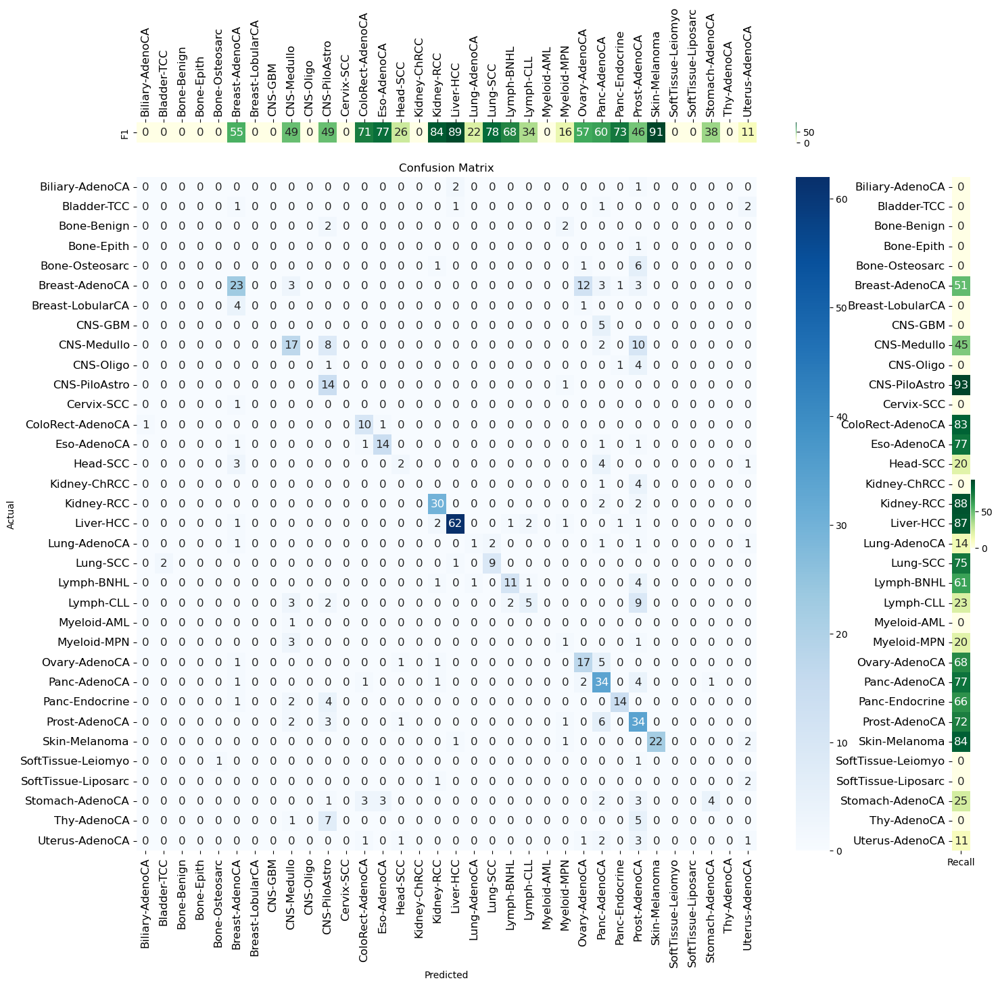

val_acc =  0.7171171171171171


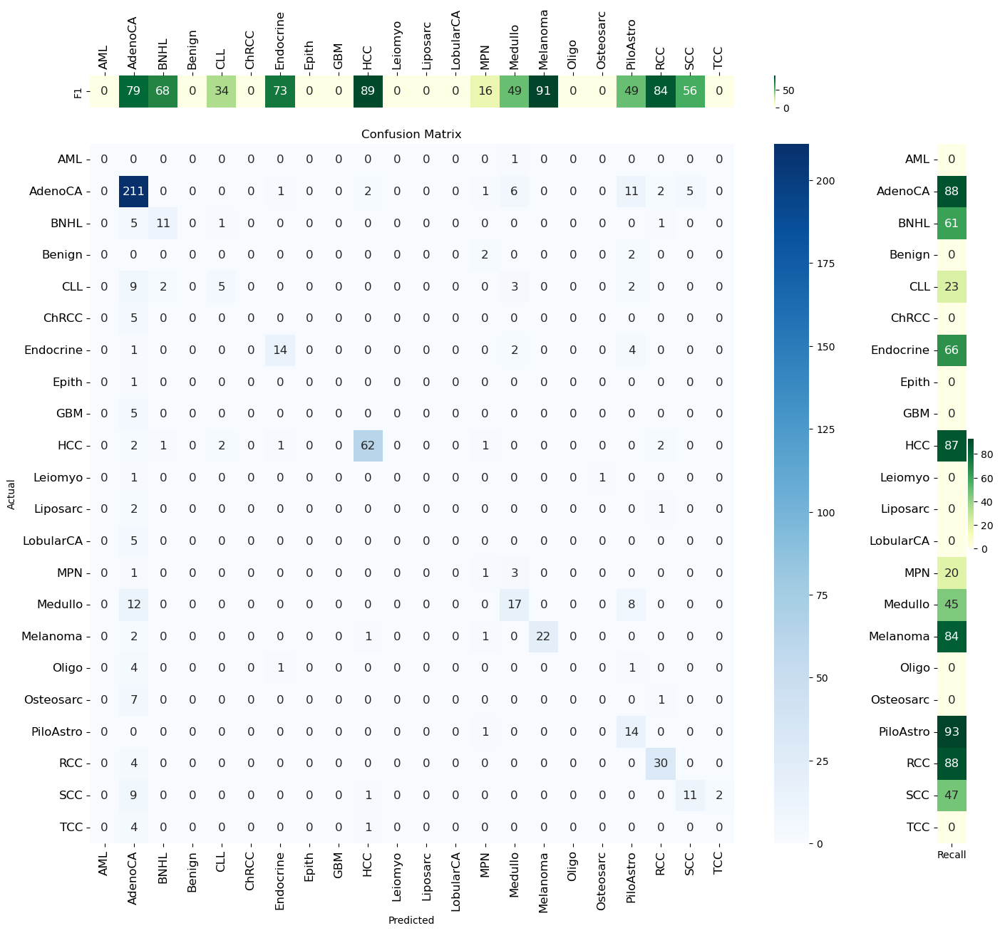

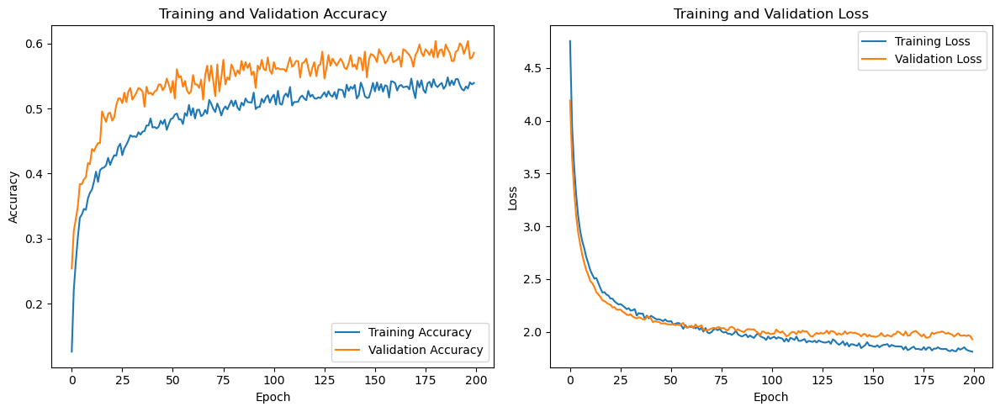


Feature nums: 96
Training Samples: 7594

Test Samples: 1899
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Accuracy on test data: 40.28%


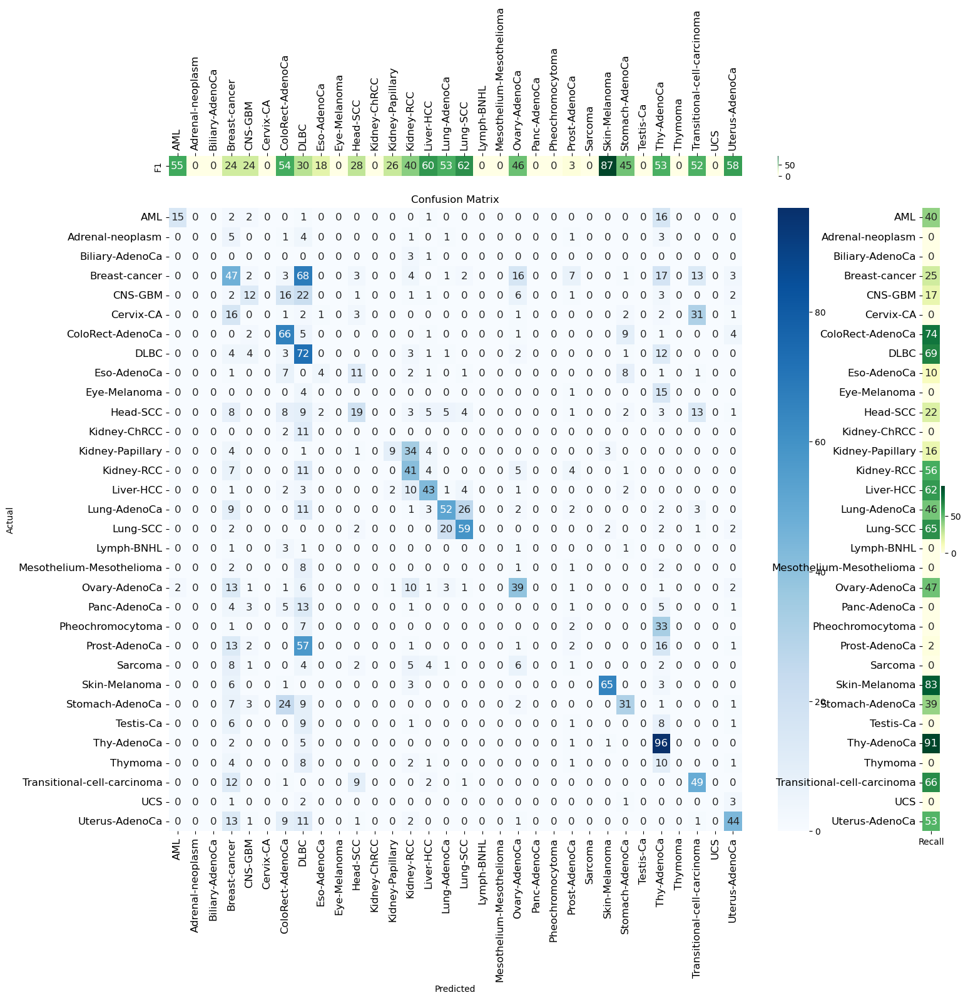

val_acc =  0.4660347551342812


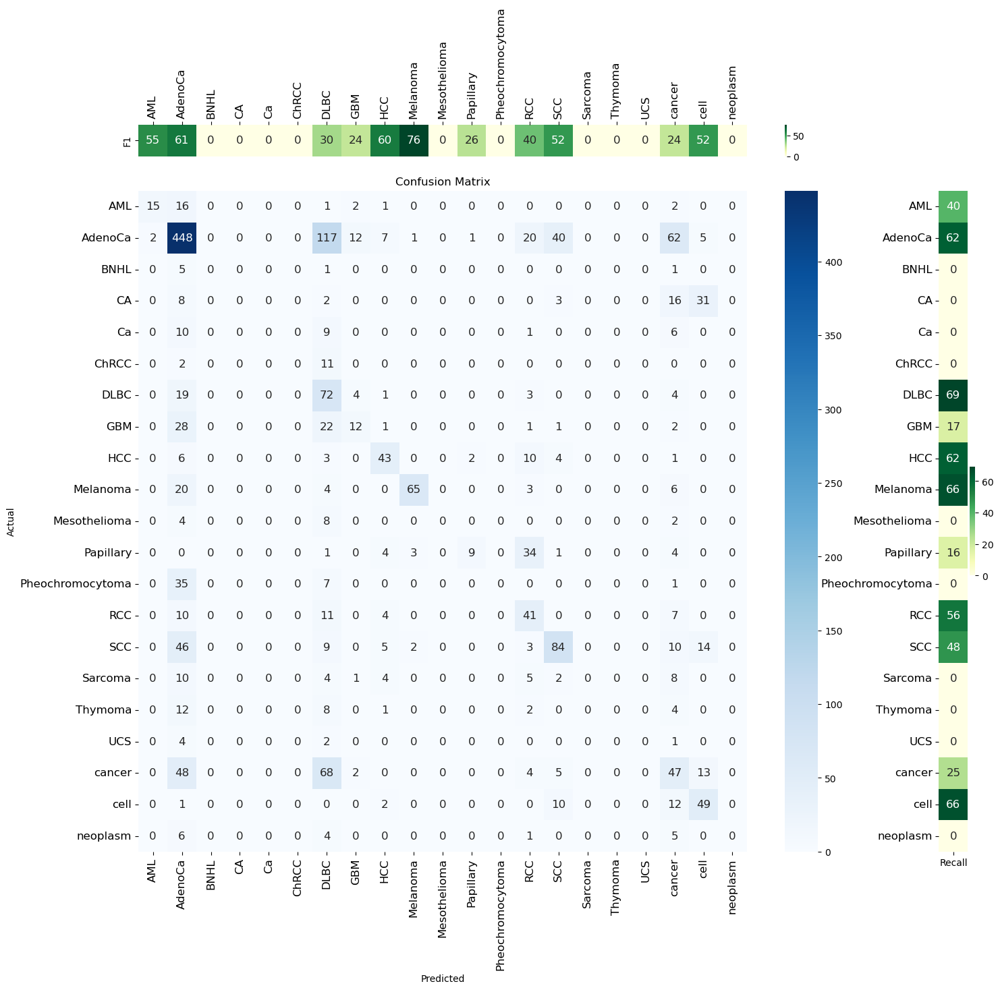

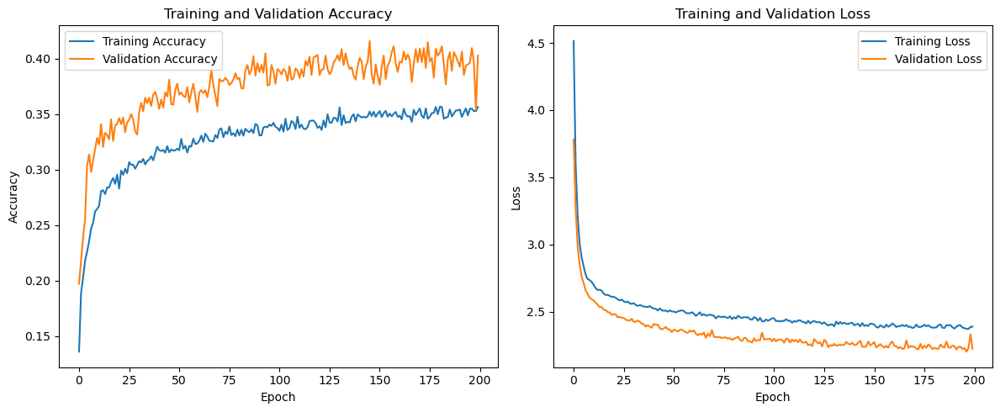


Feature nums: 65
Training Samples: 7594

Test Samples: 1899
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Accuracy on test data: 43.44%


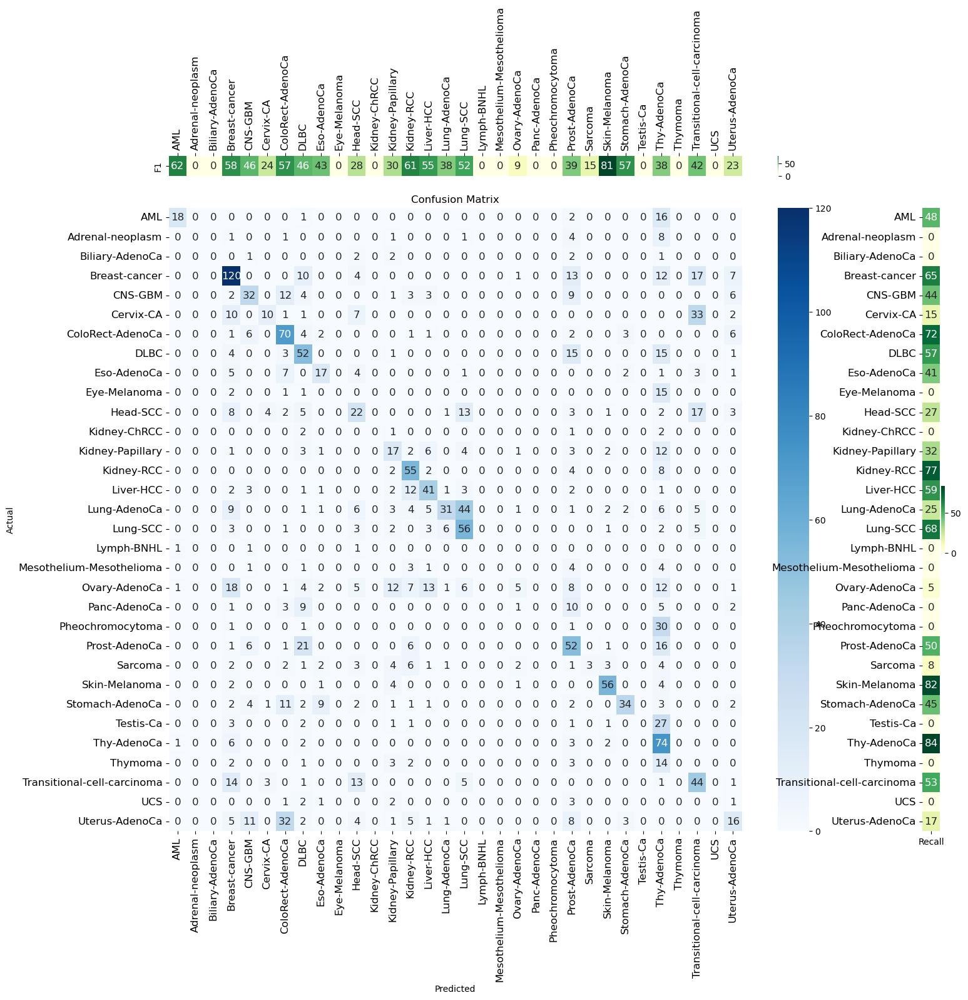

val_acc =  0.5350184307530279


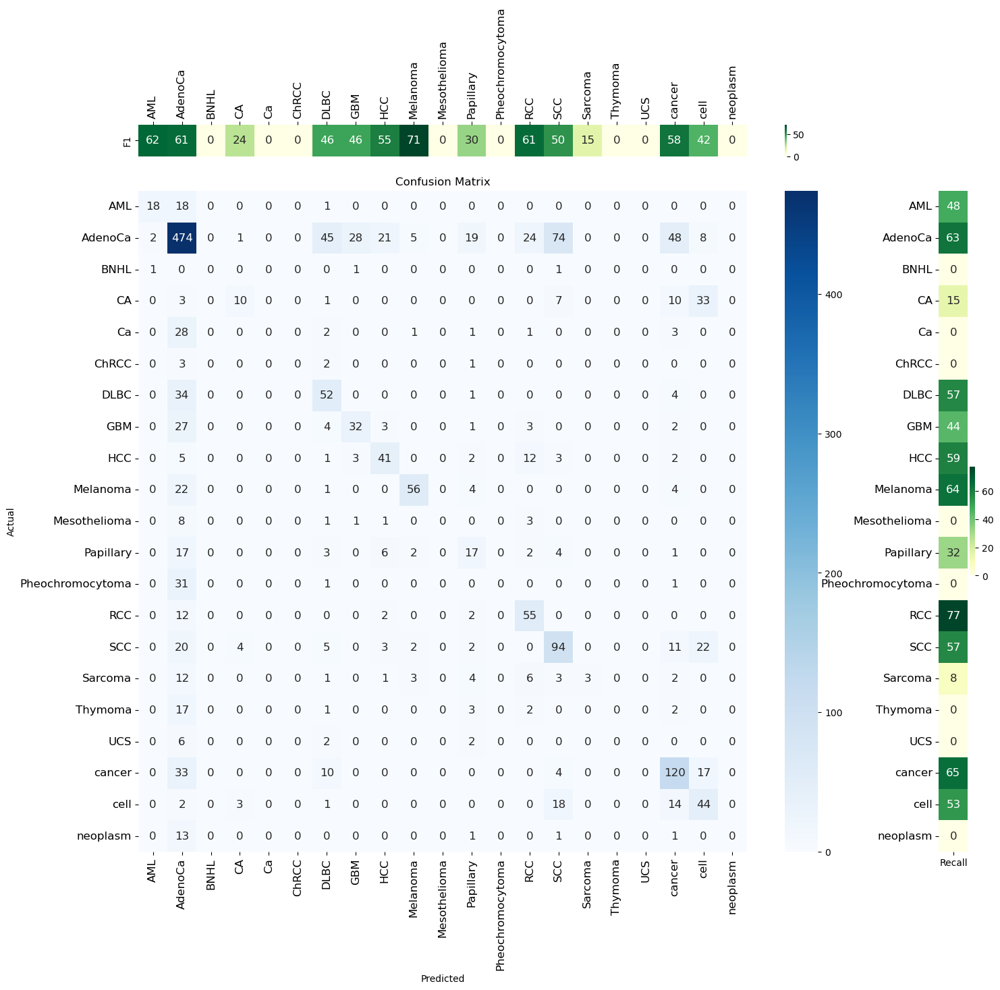

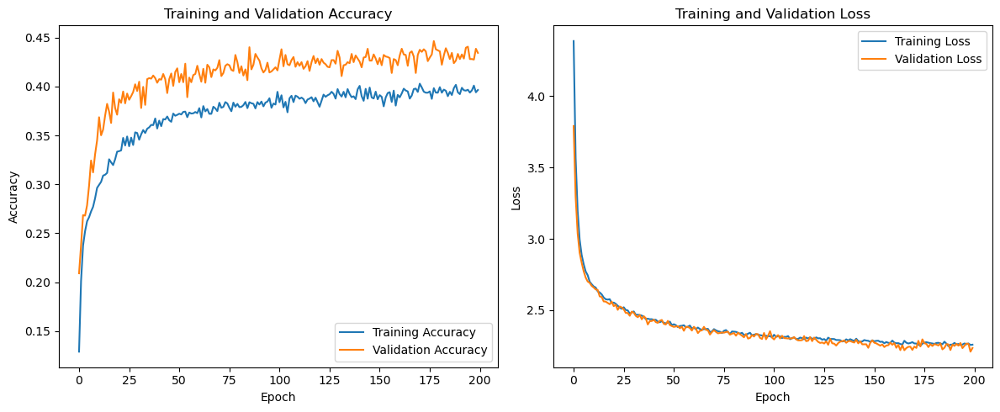

In [469]:
# _,_,_,_ = main_conv('./project_data/catalogs/WGS/WGS_PCAWG.96.csv', catalogs_wgs_pcawg, cancer_types_wgs_pcawg)
_,_,_,_ = main_conv('./project_data/activities/WGS/WGS_PCAWG.activities.csv', activity_wgs_pcawg, cancer_types_wgs_act)
_,_,_,_ = main_conv('./project_data/catalogs/WES/WES_TCGA.96.csv', catalogs_wes_tcga, cancer_types_wes_cat)
_,_,_,_ = main_conv('./project_data/activities/WES/WES_TCGA.activities.csv', activity_wes_tcga, cancer_types_wes_act)


Feature nums: 161
Training Samples: 7594

Test Samples: 1899
Epoch 1/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0927 - loss: 5.3098 - val_accuracy: 0.2227 - val_loss: 3.9328
Epoch 2/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2032 - loss: 3.8629 - val_accuracy: 0.2638 - val_loss: 3.2873
Epoch 3/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2425 - loss: 3.3233 - val_accuracy: 0.3270 - val_loss: 2.9030
Epoch 4/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2724 - loss: 3.0182 - val_accuracy: 0.3549 - val_loss: 2.6925
Epoch 5/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2936 - loss: 2.8818 - val_accuracy: 0.3755 - val_loss: 2.5761
Epoch 6/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3022 - loss: 2.7055 - val_accuracy: 0.3855 - val_loss: 2.5249
Epoch 7/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3139 - loss: 2.6541 - val_accuracy: 0.3881 - val_loss: 2.4615
Epoch 8/2000
238/238 ━━━━━━━

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4289 - loss: 2.1919 - val_accuracy: 0.4834 - val_loss: 2.0428
Epoch 100/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4187 - loss: 2.2172 - val_accuracy: 0.4897 - val_loss: 2.0329
Epoch 101/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4253 - loss: 2.1882 - val_accuracy: 0.4866 - val_loss: 2.0283
Epoch 102/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4207 - loss: 2.1874 - val_accuracy: 0.4892 - val_loss: 2.0388
Epoch 103/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4261 - loss: 2.1937 - val_accuracy: 0.4813 - val_loss: 2.0485
Epoch 104/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4193 - loss: 2.2165 - val_accuracy: 0.4892 - val_loss: 2.0213
Epoch 105/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4301 - loss: 2.2110 - val_accuracy: 0.4808 - val_loss: 2.0412
Epoch 106/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4260 - loss: 2.2346 -

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4370 - loss: 2.1435 - val_accuracy: 0.4845 - val_loss: 1.9926
Epoch 198/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4231 - loss: 2.1996 - val_accuracy: 0.4929 - val_loss: 2.0070
Epoch 199/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4325 - loss: 2.1435 - val_accuracy: 0.4839 - val_loss: 2.0228
Epoch 200/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4188 - loss: 2.1755 - val_accuracy: 0.4918 - val_loss: 1.9910
Epoch 201/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4214 - loss: 2.1688 - val_accuracy: 0.4955 - val_loss: 1.9942
Epoch 202/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4461 - loss: 2.1313 - val_accuracy: 0.4897 - val_loss: 1.9959
Epoch 203/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4237 - loss: 2.1681 - val_accuracy: 0.4976 - val_loss: 1.9966
Epoch 204/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4312 - loss: 2.1885 -

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4423 - loss: 2.1324 - val_accuracy: 0.4945 - val_loss: 1.9775
Epoch 296/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4450 - loss: 2.1146 - val_accuracy: 0.5050 - val_loss: 1.9806
Epoch 297/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4323 - loss: 2.1613 - val_accuracy: 0.4997 - val_loss: 1.9741
Epoch 298/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4381 - loss: 2.1252 - val_accuracy: 0.4876 - val_loss: 1.9852
Epoch 299/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4371 - loss: 2.1365 - val_accuracy: 0.5155 - val_loss: 1.9673
Epoch 300/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4460 - loss: 2.1469 - val_accuracy: 0.5061 - val_loss: 1.9507
Epoch 301/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4359 - loss: 2.1692 - val_accuracy: 0.5003 - val_loss: 1.9723
Epoch 302/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4473 - loss: 2.1126 -

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4420 - loss: 2.1322 - val_accuracy: 0.4871 - val_loss: 1.9760
Epoch 394/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4303 - loss: 2.1215 - val_accuracy: 0.4961 - val_loss: 1.9677
Epoch 395/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4546 - loss: 2.1163 - val_accuracy: 0.5076 - val_loss: 1.9917
Epoch 396/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4499 - loss: 2.1572 - val_accuracy: 0.4976 - val_loss: 1.9908
Epoch 397/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4565 - loss: 2.1126 - val_accuracy: 0.4929 - val_loss: 1.9919
Epoch 398/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4540 - loss: 2.1259 - val_accuracy: 0.5082 - val_loss: 1.9574
Epoch 399/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4352 - loss: 2.1238 - val_accuracy: 0.5161 - val_loss: 1.9394
Epoch 400/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4421 - loss: 2.1337 -

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4415 - loss: 2.1453 - val_accuracy: 0.5087 - val_loss: 1.9467
Epoch 492/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4462 - loss: 2.1180 - val_accuracy: 0.5108 - val_loss: 1.9377
Epoch 493/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4468 - loss: 2.1250 - val_accuracy: 0.4955 - val_loss: 1.9783
Epoch 494/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4373 - loss: 2.1489 - val_accuracy: 0.5045 - val_loss: 1.9343
Epoch 495/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4514 - loss: 2.1162 - val_accuracy: 0.5140 - val_loss: 1.9365
Epoch 496/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4258 - loss: 2.1225 - val_accuracy: 0.5166 - val_loss: 1.9497
Epoch 497/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4427 - loss: 2.1370 - val_accuracy: 0.5140 - val_loss: 1.9406
Epoch 498/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4422 - loss: 2.1136 -

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4464 - loss: 2.1047 - val_accuracy: 0.5113 - val_loss: 1.9217
Epoch 590/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4311 - loss: 2.1446 - val_accuracy: 0.4950 - val_loss: 1.9553
Epoch 591/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4441 - loss: 2.1488 - val_accuracy: 0.4903 - val_loss: 1.9469
Epoch 592/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4477 - loss: 2.1085 - val_accuracy: 0.5082 - val_loss: 1.9601
Epoch 593/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4479 - loss: 2.1181 - val_accuracy: 0.4987 - val_loss: 1.9340
Epoch 594/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4388 - loss: 2.1284 - val_accuracy: 0.5066 - val_loss: 1.9506
Epoch 595/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4469 - loss: 2.1317 - val_accuracy: 0.5108 - val_loss: 1.9577
Epoch 596/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4426 - loss: 2.1191 -

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4325 - loss: 2.1176 - val_accuracy: 0.4982 - val_loss: 1.9787
Epoch 688/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4486 - loss: 2.0901 - val_accuracy: 0.4939 - val_loss: 1.9758
Epoch 689/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4429 - loss: 2.1134 - val_accuracy: 0.4982 - val_loss: 1.9953
Epoch 690/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4456 - loss: 2.1254 - val_accuracy: 0.5066 - val_loss: 1.9429
Epoch 691/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4384 - loss: 2.1229 - val_accuracy: 0.5029 - val_loss: 1.9650
Epoch 692/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4488 - loss: 2.1162 - val_accuracy: 0.5140 - val_loss: 1.9317
Epoch 693/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4436 - loss: 2.1245 - val_accuracy: 0.5097 - val_loss: 1.9644
Epoch 694/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4529 - loss: 2.0966 -

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4507 - loss: 2.1173 - val_accuracy: 0.5082 - val_loss: 1.9597
Epoch 786/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4300 - loss: 2.1878 - val_accuracy: 0.5050 - val_loss: 1.9423
Epoch 787/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4490 - loss: 2.1296 - val_accuracy: 0.4982 - val_loss: 1.9726
Epoch 788/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4436 - loss: 2.1278 - val_accuracy: 0.5045 - val_loss: 1.9862
Epoch 789/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4462 - loss: 2.1119 - val_accuracy: 0.5171 - val_loss: 1.9488
Epoch 790/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4509 - loss: 2.0907 - val_accuracy: 0.5150 - val_loss: 1.9440
Epoch 791/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4427 - loss: 2.1142 - val_accuracy: 0.5071 - val_loss: 1.9015
Epoch 792/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4435 - loss: 2.1366 -

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4412 - loss: 2.1135 - val_accuracy: 0.5013 - val_loss: 1.9683
Epoch 884/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4357 - loss: 2.0942 - val_accuracy: 0.5140 - val_loss: 1.9116
Epoch 885/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4331 - loss: 2.1358 - val_accuracy: 0.5155 - val_loss: 1.9250
Epoch 886/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4418 - loss: 2.1557 - val_accuracy: 0.5024 - val_loss: 1.9203
Epoch 887/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4458 - loss: 2.1213 - val_accuracy: 0.4945 - val_loss: 1.9481
Epoch 888/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4419 - loss: 2.0974 - val_accuracy: 0.5029 - val_loss: 1.9298
Epoch 889/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4449 - loss: 2.1298 - val_accuracy: 0.5055 - val_loss: 1.9170
Epoch 890/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4576 - loss: 2.0547 -

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4415 - loss: 2.1069 - val_accuracy: 0.4934 - val_loss: 1.9651
Epoch 982/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4368 - loss: 2.1242 - val_accuracy: 0.4976 - val_loss: 1.9852
Epoch 983/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4452 - loss: 2.1593 - val_accuracy: 0.5013 - val_loss: 1.9425
Epoch 984/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4501 - loss: 2.0915 - val_accuracy: 0.4845 - val_loss: 2.0011
Epoch 985/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4409 - loss: 2.1314 - val_accuracy: 0.5129 - val_loss: 1.9285
Epoch 986/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4308 - loss: 2.1617 - val_accuracy: 0.5066 - val_loss: 1.9382
Epoch 987/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4451 - loss: 2.1179 - val_accuracy: 0.5182 - val_loss: 1.9143
Epoch 988/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4421 - loss: 2.1058 -

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4362 - loss: 2.1594 - val_accuracy: 0.5113 - val_loss: 1.9148
Epoch 1080/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4502 - loss: 2.0765 - val_accuracy: 0.5003 - val_loss: 1.9657
Epoch 1081/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4365 - loss: 2.1216 - val_accuracy: 0.4918 - val_loss: 1.9560
Epoch 1082/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4433 - loss: 2.1037 - val_accuracy: 0.5161 - val_loss: 1.9084
Epoch 1083/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4338 - loss: 2.1137 - val_accuracy: 0.5029 - val_loss: 1.9417
Epoch 1084/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4372 - loss: 2.1185 - val_accuracy: 0.5134 - val_loss: 1.9015
Epoch 1085/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4478 - loss: 2.1272 - val_accuracy: 0.5108 - val_loss: 1.9553
Epoch 1086/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4609 - loss: 2

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4445 - loss: 2.1132 - val_accuracy: 0.4818 - val_loss: 1.9427
Epoch 1178/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4423 - loss: 2.1051 - val_accuracy: 0.5092 - val_loss: 1.9140
Epoch 1179/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4585 - loss: 2.0933 - val_accuracy: 0.5108 - val_loss: 1.9305
Epoch 1180/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4428 - loss: 2.1020 - val_accuracy: 0.4982 - val_loss: 1.9330
Epoch 1181/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4413 - loss: 2.1446 - val_accuracy: 0.5082 - val_loss: 1.9451
Epoch 1182/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4344 - loss: 2.1129 - val_accuracy: 0.5213 - val_loss: 1.9256
Epoch 1183/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4504 - loss: 2.0974 - val_accuracy: 0.5018 - val_loss: 1.9631
Epoch 1184/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4466 - loss: 2

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4443 - loss: 2.1287 - val_accuracy: 0.5050 - val_loss: 1.9718
Epoch 1276/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4416 - loss: 2.1156 - val_accuracy: 0.5118 - val_loss: 1.9431
Epoch 1277/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4379 - loss: 2.1159 - val_accuracy: 0.4945 - val_loss: 1.9548
Epoch 1278/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4359 - loss: 2.1263 - val_accuracy: 0.5118 - val_loss: 1.9382
Epoch 1279/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4479 - loss: 2.1064 - val_accuracy: 0.5045 - val_loss: 1.9363
Epoch 1280/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4580 - loss: 2.0782 - val_accuracy: 0.5071 - val_loss: 1.9743
Epoch 1281/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4564 - loss: 2.1059 - val_accuracy: 0.5118 - val_loss: 1.9072
Epoch 1282/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4367 - loss: 2

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4483 - loss: 2.1075 - val_accuracy: 0.5034 - val_loss: 1.9633
Epoch 1374/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4400 - loss: 2.1232 - val_accuracy: 0.5176 - val_loss: 1.8983
Epoch 1375/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4345 - loss: 2.1059 - val_accuracy: 0.5118 - val_loss: 1.9228
Epoch 1376/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4451 - loss: 2.1250 - val_accuracy: 0.5108 - val_loss: 1.9149
Epoch 1377/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4424 - loss: 2.1277 - val_accuracy: 0.4950 - val_loss: 1.9632
Epoch 1378/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4509 - loss: 2.1116 - val_accuracy: 0.5192 - val_loss: 1.9205
Epoch 1379/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4555 - loss: 2.0487 - val_accuracy: 0.4992 - val_loss: 1.9502
Epoch 1380/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4311 - loss: 2

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4457 - loss: 2.1110 - val_accuracy: 0.5155 - val_loss: 1.9306
Epoch 1472/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4372 - loss: 2.0927 - val_accuracy: 0.5008 - val_loss: 1.9495
Epoch 1473/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4419 - loss: 2.1137 - val_accuracy: 0.5118 - val_loss: 1.9842
Epoch 1474/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4376 - loss: 2.0743 - val_accuracy: 0.4918 - val_loss: 1.9684
Epoch 1475/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4452 - loss: 2.1196 - val_accuracy: 0.5161 - val_loss: 1.9268
Epoch 1476/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4325 - loss: 2.1259 - val_accuracy: 0.5150 - val_loss: 1.9406
Epoch 1477/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4367 - loss: 2.1222 - val_accuracy: 0.5008 - val_loss: 1.9517
Epoch 1478/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4466 - loss: 2

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4257 - loss: 2.1625 - val_accuracy: 0.4829 - val_loss: 1.9413
Epoch 1570/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4449 - loss: 2.1383 - val_accuracy: 0.4892 - val_loss: 1.9672
Epoch 1571/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4623 - loss: 2.0765 - val_accuracy: 0.4976 - val_loss: 1.9215
Epoch 1572/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4335 - loss: 2.1285 - val_accuracy: 0.4929 - val_loss: 1.9737
Epoch 1573/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4367 - loss: 2.1107 - val_accuracy: 0.5066 - val_loss: 1.9386
Epoch 1574/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4356 - loss: 2.1120 - val_accuracy: 0.5155 - val_loss: 1.9138
Epoch 1575/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4546 - loss: 2.0920 - val_accuracy: 0.4961 - val_loss: 1.9601
Epoch 1576/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4484 - loss: 2

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4416 - loss: 2.0962 - val_accuracy: 0.4976 - val_loss: 1.9320
Epoch 1668/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4497 - loss: 2.1131 - val_accuracy: 0.5108 - val_loss: 1.9445
Epoch 1669/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4395 - loss: 2.1371 - val_accuracy: 0.5097 - val_loss: 1.9210
Epoch 1670/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4471 - loss: 2.1129 - val_accuracy: 0.4945 - val_loss: 1.9267
Epoch 1671/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4480 - loss: 2.1268 - val_accuracy: 0.4918 - val_loss: 1.9499
Epoch 1672/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4464 - loss: 2.0902 - val_accuracy: 0.4897 - val_loss: 1.9550
Epoch 1673/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4476 - loss: 2.0720 - val_accuracy: 0.4824 - val_loss: 2.0042
Epoch 1674/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4483 - loss: 2

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4377 - loss: 2.1352 - val_accuracy: 0.5176 - val_loss: 1.9266
Epoch 1766/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4425 - loss: 2.1089 - val_accuracy: 0.5018 - val_loss: 1.9663
Epoch 1767/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4349 - loss: 2.1196 - val_accuracy: 0.5087 - val_loss: 1.9290
Epoch 1768/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4339 - loss: 2.1426 - val_accuracy: 0.5082 - val_loss: 1.9405
Epoch 1769/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4451 - loss: 2.0912 - val_accuracy: 0.5045 - val_loss: 1.9363
Epoch 1770/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4355 - loss: 2.1364 - val_accuracy: 0.4892 - val_loss: 1.9532
Epoch 1771/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4468 - loss: 2.0645 - val_accuracy: 0.5034 - val_loss: 1.9565
Epoch 1772/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4455 - loss: 2

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4412 - loss: 2.1092 - val_accuracy: 0.5029 - val_loss: 1.9400
Epoch 1864/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4307 - loss: 2.1260 - val_accuracy: 0.4982 - val_loss: 1.9219
Epoch 1865/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4471 - loss: 2.1085 - val_accuracy: 0.5118 - val_loss: 1.9473
Epoch 1866/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4449 - loss: 2.0731 - val_accuracy: 0.5092 - val_loss: 1.9331
Epoch 1867/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4363 - loss: 2.1221 - val_accuracy: 0.4997 - val_loss: 1.9168
Epoch 1868/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4474 - loss: 2.0729 - val_accuracy: 0.5097 - val_loss: 1.9427
Epoch 1869/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4444 - loss: 2.1324 - val_accuracy: 0.5045 - val_loss: 1.9676
Epoch 1870/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4397 - loss: 2

238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4365 - loss: 2.1303 - val_accuracy: 0.4945 - val_loss: 1.9221
Epoch 1962/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4251 - loss: 2.1537 - val_accuracy: 0.4997 - val_loss: 1.9178
Epoch 1963/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4428 - loss: 2.1230 - val_accuracy: 0.5076 - val_loss: 1.9625
Epoch 1964/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4342 - loss: 2.1048 - val_accuracy: 0.5029 - val_loss: 1.9625
Epoch 1965/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4466 - loss: 2.0971 - val_accuracy: 0.4971 - val_loss: 1.9324
Epoch 1966/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4404 - loss: 2.0943 - val_accuracy: 0.5039 - val_loss: 1.9362
Epoch 1967/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4361 - loss: 2.1148 - val_accuracy: 0.4781 - val_loss: 1.9918
Epoch 1968/2000
238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4442 - loss: 2

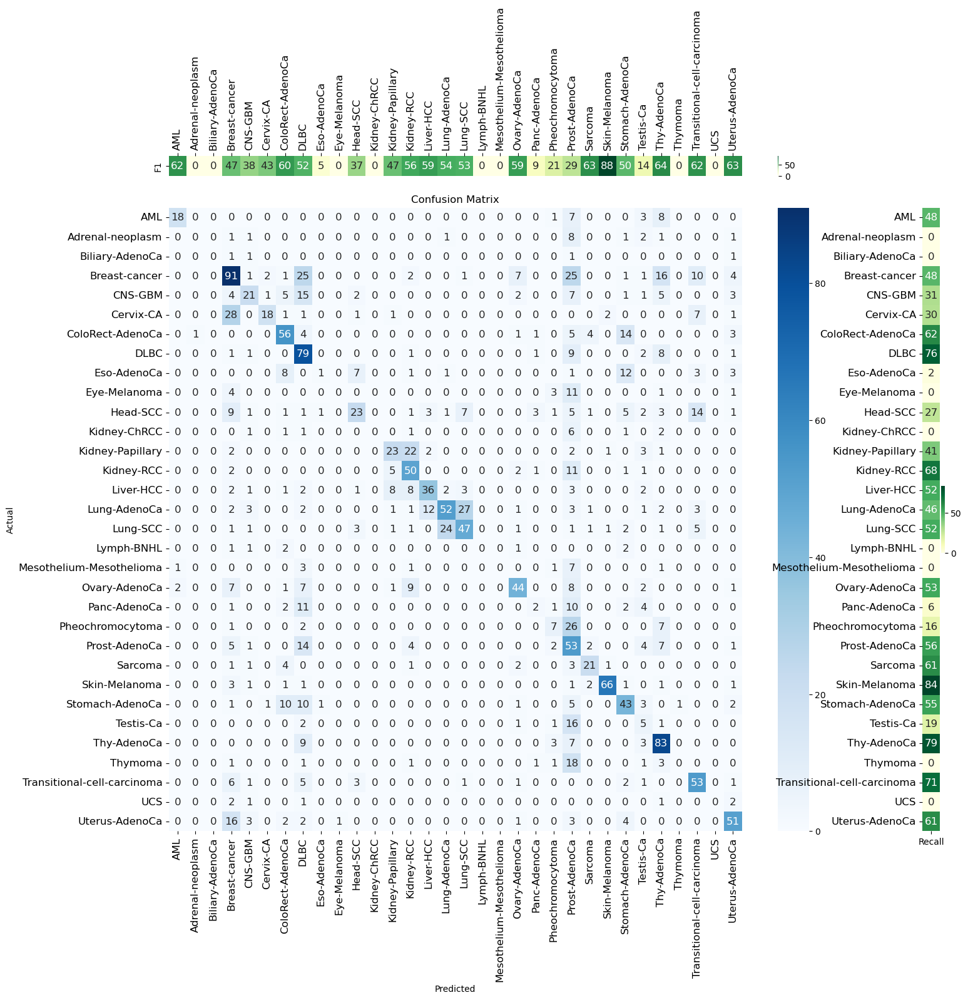

val_acc =  0.5676671932596103


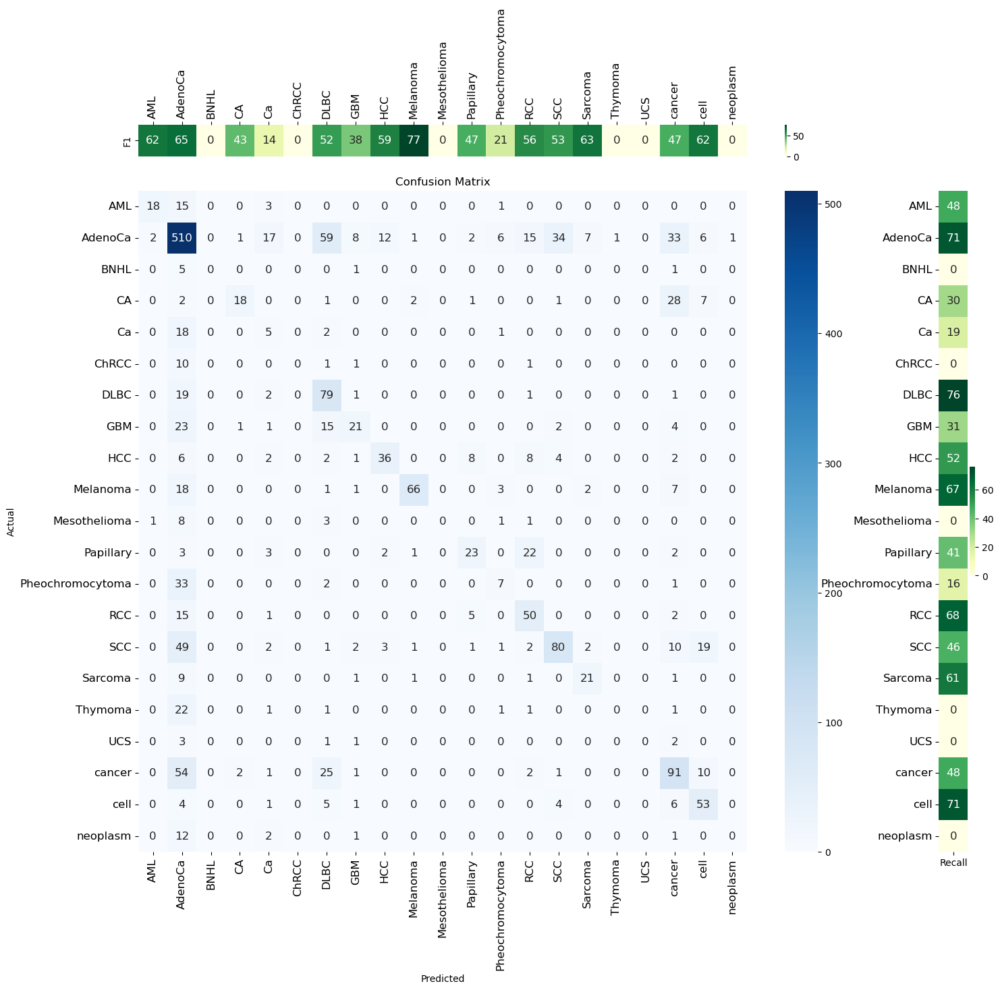

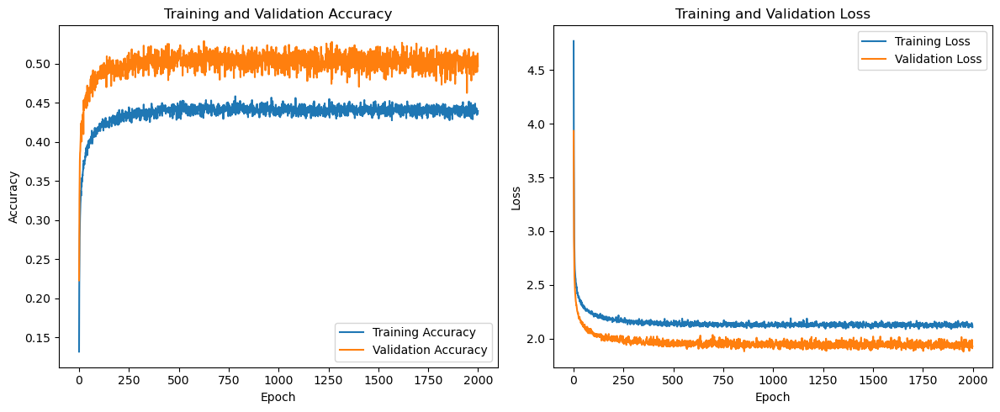

In [565]:
model62,accuracy62,y_pred62,history62 = main_conv('./project_data/catalogs/WES/WES_TCGA.96.csv', concatenated_wes, cance_type_concatenated_wes, 2000,learning_rate=0.001, batch_size=32)

# Convolutional Neural Network

Here, we apply a convolutional neural network for the task of labeling samples. The main benefit of using a CNN for a classification task is its inherent ability (when configured appropriately) to recognize complex features without manual engineering.

The structure of the network used comprises three convolutional layers, followed by five linear layers. The convoltional layers extract features from the data, and the linear layers classify it based on the convoltional layers' output. The loss function used is a cross entropy loss algorithm, which compares the prediction matrix output by the model to the true labels of the training data. Based on the loss it outputs, the optimizer will modify the weights in the network's nodes. The optimizer used here is Adam, which works like a more traditional stochastic gradient descent, but is extended with additional features, like the ability to dynamically change its learning rate, leading to a faster and more effective learning phase.

## Preparing the data

Nothing fancy happening here, just loading the needed data and packaging it into appropriate Torch tensors, as well as saving the labels and initializing a couple of constant values.

In [182]:
import torch
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder


def initData(choice):
    if choice == 1: # PCAWG, only mutations
        temp = pd.read_csv("./project_data/catalogs/WGS/WGS_PCAWG.96.csv")
        temp = temp.T.drop(["Mutation type", "Trinucleotide"], axis=0)
        n_in_features = 96
    if choice == 2: # PCAWG, mutations and activations
        temp1 = pd.read_csv("./project_data/catalogs/WGS/WGS_PCAWG.96.csv")
        temp1 = temp1.T.drop(["Mutation type", "Trinucleotide"], axis=0)

        temp2 = pd.read_csv("./project_data/activities/WGS/WGS_PCAWG.activities.csv")
        temp2 = temp2.drop(["Accuracy"], axis=1)
        temp2['Sample'] = temp2['Cancer Types']+'::'+temp2['Sample Names']
        temp2 = temp2.set_index('Sample').iloc[:,2:]

        temp = pd.concat([temp1, temp2], axis=1)
        n_in_features = 161

    # Creating sets for training, validation and testing
    data_shuffled = temp.sample(frac=1, random_state=626)

    trainingset_size = int(len(data_shuffled) * 0.8)
    valset_size = int(len(data_shuffled) * 0.1)

    train_data = data_shuffled.iloc[:trainingset_size]
    val_data = data_shuffled.iloc[trainingset_size:trainingset_size+valset_size]
    test_data = data_shuffled.iloc[trainingset_size+valset_size:]

    train_labels = [row.split("::")[0] for row in train_data.index]
    val_labels = [row.split("::")[0] for row in val_data.index]
    test_labels = [row.split("::")[0] for row in test_data.index]

    # str labels to suitable format
    train_data = train_data.values.astype(np.float32)
    val_data = val_data.values.astype(np.float32)
    test_data = test_data.values.astype(np.float32)
    
    labenc = LabelEncoder()

    train_tensor = torch.tensor(train_data, dtype=torch.float32)
    # fit_transform() on first one
    train_labels_tensor = torch.tensor(labenc.fit_transform(train_labels))
    val_tensor = torch.tensor(val_data, dtype=torch.float32)
    val_labels_tensor = torch.tensor(labenc.transform(val_labels))
    test_tensor = torch.tensor(test_data, dtype=torch.float32)
    test_labels_tensor = torch.tensor(labenc.transform(test_labels))
    
    return labenc.classes_, n_in_features, train_tensor, train_labels_tensor, val_tensor, val_labels_tensor, test_tensor, test_labels_tensor

## Setting up the network

The essential steps for creating a neural network are here, such as composing the network, selecting an optimizer and a loss function, as well as declaring a some hyperparameters.

In [183]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data
import torch.backends.cudnn as cudnn


N_EPOCHS = 30
BATCH_SIZE_TRAIN = 1
NUM_CLASSES = 37

# select device for computing
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f'Device: {device}')

# select the dataset, number between 1 and 8
label_names, n_in_features, train_tensor, train_labels_tensor, val_tensor, val_labels_tensor, test_tensor, test_labels_tensor = initData(2)


class CNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.flatten = nn.Flatten()
        self.convs = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=14, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv1d(in_channels=14, out_channels=18, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Dropout(p=0.05),
            nn.Conv1d(in_channels=18, out_channels=1,kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
        )
        self.lins = nn.Sequential(
            nn.Linear(in_features=n_in_features, out_features=160),
            nn.ReLU(),
            nn.Linear(in_features=160, out_features=300),
            nn.ReLU(),
            nn.Dropout(p=0.05),
            nn.Linear(in_features=300, out_features=300),
            nn.ReLU(),
            nn.Dropout(p=0.07),
            nn.Linear(in_features=300, out_features=220),
            nn.ReLU(),
            nn.Linear(in_features=220, out_features=NUM_CLASSES),
        )

    def forward(self, x):
        x = self.convs(x)
        x = self.flatten(x)
        x = self.lins(x)
        return x

model = CNN().to(device)
#print(model)

loss_function = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.00006)

Device: cpu


## Training

The training-validation -loop is defined here.

In [184]:
# Training
for epoch in range(N_EPOCHS):
    model.train()
    train_correct = 0
    total = 0
    for i in range(0, len(train_tensor), BATCH_SIZE_TRAIN):
        
        if i+BATCH_SIZE_TRAIN+1 <= len(train_tensor):
            inputs = train_tensor[i:i+BATCH_SIZE_TRAIN]
            labels = train_labels_tensor[i:i+BATCH_SIZE_TRAIN]
        else:
            break
            
        outputs = model(inputs)
        loss = loss_function(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        _, predicted = outputs.max(1)

        train_correct += predicted.eq(labels).sum().item()
        total += labels.size(0)

    print(f'Epoch [{epoch+1}/{N_EPOCHS}], Loss: {loss.item():.4f}, Accuracy: {train_correct}/{total}',
          f'({train_correct/total*100:.2f}%)')
    
    model.eval()
    total_val_loss = 0
    val_n = 0
    val_correct = 0
    for i in range(0, len(val_tensor), BATCH_SIZE_TRAIN):
        
        if i+BATCH_SIZE_TRAIN+1 <= len(val_tensor):
            inputs = val_tensor[i:i+BATCH_SIZE_TRAIN]
            labels = val_labels_tensor[i:i+BATCH_SIZE_TRAIN]
        else:
            break
        
        outputs = model(inputs)
        loss = loss_function(outputs, labels)
        
        total_val_loss += loss.item()
        
        _, predicted = outputs.max(1)
        val_correct += predicted.eq(labels).sum().item()
        val_n += labels.size(0)
    print(f'Total validation loss: {total_val_loss} | Validation accuracy: {val_correct}/{val_n}',
        f'({val_correct/val_n*100:.2f}%)')
    


Epoch [1/30], Loss: 2.4774, Accuracy: 581/2223 (26.14%)
Total validation loss: 720.9715202413051 | Validation accuracy: 116/277 (41.88%)
Epoch [30/30], Loss: 0.2792, Accuracy: 1922/2223 (86.46%)
Total validation loss: 249.55914551298068 | Validation accuracy: 221/277 (79.78%)


## Testing

In [185]:
predictions = []
true_labels = []

model.eval()
with torch.no_grad():
    total_test_loss = 0
    test_n = 0
    test_correct = 0
    for i in range(0, len(test_tensor)):
        inputs = test_tensor[i:i+1]
        labels = test_labels_tensor[i:i+1]
        
        outputs = model(inputs)
        loss = loss_function(outputs, labels)
        
        total_test_loss += loss.item()
        
        _, predicted = outputs.max(1)
        predictions.append((predicted.item(), labels.item()))
        test_correct += predicted.eq(labels).sum().item()
        test_n += labels.size(0)
    print(f'Total test loss: {total_test_loss} | Test accuracy: {test_correct}/{test_n} ({test_correct/test_n*100:.2f} %)')
        
predicted_classes = np.array(predictions)
true_classes = np.array(true_labels)

torch.Size([1, 161])
Total test loss: 250.85902243452344 | Test accuracy: 217/278 (78.06 %)


## Visualizing results

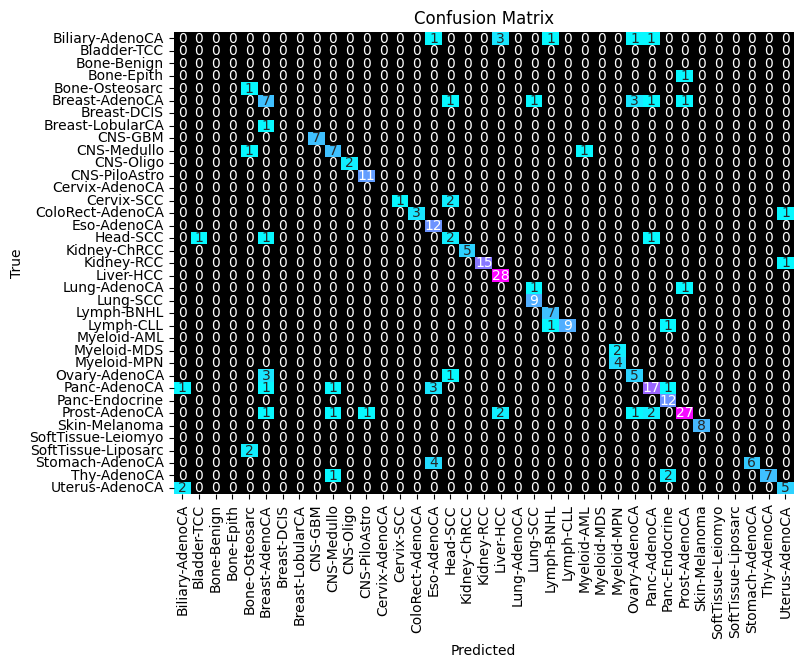

In [186]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

conf_matrix = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=int)
for pred_class, true_class in predictions:
    conf_matrix[true_class, pred_class] += 1
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

cmap = mcolors.ListedColormap(['black'] + sns.color_palette("cool", 100).as_hex())

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_normalized, annot=True, cbar=False, cmap=cmap, xticklabels=label_names, yticklabels=label_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# following work is using KNN

K-Nearest Neighbors (KNN) is a simple and intuitive algorithm used for classification and regression tasks in machine learning. In KNN, the prediction of a new data point is based on the majority class or average value of its 'k' nearest neighbors in the feature space. The choice of 'k', the number of neighbors considered, is a key hyperparameter that influences the model's performance. 

For classification tasks, KNN assigns the class label of the majority of its neighbors to the new data point. KNN is a non-parametric algorithm, meaning it does not make assumptions about the underlying distribution of the data.

One of the main advantages of KNN is its simplicity and ease of implementation. However, it can be computationally expensive, especially for large datasets, as it requires calculating the distances between the new data point and all other data points in the training set. Additionally, KNN's performance can be sensitive to the choice of distance metric and the value of 'k'.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split

In [ ]:
## PCAWG data is performed by the same pipeline
PCAWG_wgs_mut = pd.read_csv ("./project_data/catalogs/WGS/WGS_PCAWG.96.csv")
PCAWG_wgs_mut.head(2)

In [ ]:
def data_exploration():
    # Print the normalised value count for all targets
    data = PCAWG_wgs_mut.copy()
    index = data['Mutation type']+"_"+data['Trinucleotide']
    data = data.set_index(index).drop(labels=['Mutation type','Trinucleotide'],axis=1).T.reset_index()
    data['target'] = data['index'].apply(lambda x: x.split('-')[1].split('::')[0])
    return data['target'].value_counts(normalize=True)

data_exploration()

In [ ]:
# Pipeline: Normalise - Fit
class MedianMADNormaliser(BaseEstimator, TransformerMixin):
    def __init__(self) -> None:
        self.median = None
        self.mad = None

    def fit(self, X, y=None):
        X_contiguous = np.ascontiguousarray(X)
        self.median = np.median(X_contiguous, axis=0)
        self.mad = np.median(abs(X_contiguous - self.median), axis=0)
        return self
    
    def transform(self, X):
        X_contiguous = np.ascontiguousarray(X)
        return (X_contiguous - self.median) / self.mad
    
def kn_pipeline() -> Pipeline:
    kn_pipeline = Pipeline(steps=[
        ('preprocessing', Pipeline([('normaliser', MedianMADNormaliser())])),
        ('estimator', KNeighborsClassifier(n_neighbors=3)),
    ])
    return kn_pipeline

In [ ]:
random_state = [77, 78, 79, 80, 81]

In [ ]:
def compare_mut_type_by_dropping():
    mut_types = ['C>A','C>G','C>T','T>A','T>C','T>G']
    accuracies = {}
    for r in random_state:
        max_acc = 0
        max_type = ""
        min_acc = 1
        min_type = ""
        for mut_type in mut_types:
            data_drop = PCAWG_wgs_mut[PCAWG_wgs_mut['Mutation type'] != mut_type]
            index = data_drop['Mutation type']+"_"+data_drop['Trinucleotide']
            data_drop = data_drop.set_index(index).drop(labels=['Mutation type','Trinucleotide'],axis=1).T.reset_index()
            data_drop['target'] = data_drop['index'].apply(lambda x: x.split('-')[1].split('::')[0])
            data_drop.drop(['index'],axis=1,inplace=True)
            X_train,X_test, y_train, y_test= train_test_split(data_drop, data_drop['target'], test_size=0.3, random_state=r, stratify=data_drop['target'])
            kn = kn_pipeline()
            kn.fit(X_train.drop(labels=['target'], axis=1), y_train)
            pred = kn.predict(X_test.drop(labels=['target'], axis=1))
            counts = (pred == y_test).value_counts()
            accuracy = counts[True] / counts.sum()
            if accuracy > max_acc:
                max_acc = accuracy
                max_type = mut_type
            if accuracy < min_acc:
                min_acc = accuracy
                min_type = mut_type 

        accuracies[f"Random State {r}, maximal accuracy with dropping {max_type} is"] = max_acc
        accuracies[f"Random State {r}, minimal accuracy with dropping {min_type} is"] = min_acc

    return accuracies

In [ ]:
compare_mut_type_by_dropping()

In [ ]:
table_column = ["Maximal accuracy counts", "Minimal accuracy counts"] 
table_index = ['C>A','C>G','C>T','T>A','T>C','T>G']
table_content = [[15, 0], [7, 0], [0, 34], [9, 0], [0, 6], [9, 0]]
table = pd.DataFrame(table_content, columns=table_column, index=table_index)
table
# Maximal accuracy counts refers to the times that accuracy is the highest when dropping the mutation type.
# Minimal accuracy counts refers to the times that accuracy is the lowest when dropping the mutation type.

In [ ]:
def compare_mut_type_by_keeping_a_channel():
    mut_types = ['C>A','C>G','C>T','T>A','T>C','T>G']
    accuracies = {}
    for r in random_state:
        for mut_type in mut_types:
            data_drop = PCAWG_wgs_mut[PCAWG_wgs_mut['Mutation type'] == mut_type]
            index = data_drop['Mutation type']+"_"+data_drop['Trinucleotide']
            data_drop = data_drop.set_index(index).drop(labels=['Mutation type','Trinucleotide'],axis=1).T.reset_index()
            data_drop['target'] = data_drop['index'].apply(lambda x: x.split('-')[1].split('::')[0])
            data_drop.drop(['index'],axis=1,inplace=True)
            X_train,X_test, y_train, y_test= train_test_split(data_drop, data_drop['target'], test_size=0.3, random_state=r, stratify=data_drop['target'])
            kn = kn_pipeline()
            kn.fit(X_train.drop(labels=['target'], axis=1), y_train)
            pred = kn.predict(X_test.drop(labels=['target'], axis=1))
            counts = (pred == y_test).value_counts()
            accuracy = counts[True] / counts.sum()
            accuracies[f"Iter {r}, accuracy with {mut_type}"] = accuracy

    return accuracies

In [ ]:
# Make the prediction purely based on "C>T"
result = compare_mut_type_by_keeping_a_channel()
sorted_result = sorted(result.items(), key=lambda x: x[1], reverse=True)
sorted_result

In [ ]:
def compare_trinucleotide_type():
    trinucleotide_types = PCAWG_wgs_mut['Trinucleotide'].unique()
    accuracies = {}
    random_state = [i for i in range(0, 50)]
    for r in random_state:
        max_acc = 0
        max_type = ""
        min_acc = 1
        min_type = ""
        for trinucleotide_type in trinucleotide_types:
            data_drop = PCAWG_wgs_mut[PCAWG_wgs_mut['Trinucleotide'] != trinucleotide_type]
            index = data_drop['Mutation type']+"_"+data_drop['Trinucleotide']
            data_drop = data_drop.set_index(index).drop(labels=['Mutation type','Trinucleotide'],axis=1).T.reset_index()
            data_drop['target'] = data_drop['index'].apply(lambda x: x.split('-')[1].split('::')[0])
            data_drop.drop(['index'],axis=1,inplace=True)
            X_train,X_test, y_train, y_test= train_test_split(data_drop, data_drop['target'], test_size=0.3, random_state=r, stratify=data_drop['target'])
            kn = kn_pipeline()
            kn.fit(X_train.drop(labels=['target'], axis=1), y_train)
            pred = kn.predict(X_test.drop(labels=['target'], axis=1))
            counts = (pred == y_test).value_counts()
            accuracy = counts[True] / counts.sum()
            if accuracy > max_acc:
                max_acc = accuracy
                max_type = trinucleotide_type
            if accuracy < min_acc:
                min_acc = accuracy
                min_type = trinucleotide_type 

        accuracies[f"Random State {r}, maximal accuracy with dropping [{max_type}] is"] = max_acc
        accuracies[f"Random State {r}, minimal accuracy with dropping [{min_type}] is"] = min_acc
    return accuracies

In [ ]:
res = compare_trinucleotide_type()

In [ ]:
max_frequency = {}
min_frequency = {}
for key in res.keys():
    if 'maximal' in key:
        start = key.find('[') + 1
        end = key.find(']')
        string = key[start:end]
        if string in max_frequency:
            max_frequency[string] += 1
        else:
            max_frequency[string] = 1
    else:
        start = key.find('[') + 1
        end = key.find(']')
        string = key[start:end]
        if string in min_frequency:
            min_frequency[string] += 1
        else:
            min_frequency[string] = 1
            
max_frequency

In [ ]:
min_frequency

In [ ]:
def compare_trinucleotide_type_by_keeping():
    trinucleotide_types = PCAWG_wgs_mut['Trinucleotide'].unique()
    accuracies = {}
    for trinucleotide_type in trinucleotide_types:
        data_drop = PCAWG_wgs_mut[PCAWG_wgs_mut['Trinucleotide'] == trinucleotide_type]
        index = data_drop['Mutation type']+"_"+data_drop['Trinucleotide']
        data_drop = data_drop.set_index(index).drop(labels=['Mutation type','Trinucleotide'],axis=1).T.reset_index()
        data_drop['target'] = data_drop['index'].apply(lambda x: x.split('-')[1].split('::')[0])
        data_drop.drop(['index'],axis=1,inplace=True)
        X_train,X_test, y_train, y_test= train_test_split(data_drop, data_drop['target'], test_size=0.3, random_state=42, stratify=data_drop['target'])
        kn = kn_pipeline()
        kn.fit(X_train.drop(labels=['target'], axis=1), y_train)
        pred = kn.predict(X_test.drop(labels=['target'], axis=1))
        counts = (pred == y_test).value_counts()
        accuracy = counts[True] / counts.sum()
        accuracies[f"accuracy with {trinucleotide_type} is"] = accuracy
    return accuracies

In [ ]:
compare_trinucleotide_type_by_keeping()

In [ ]:
from sklearn.metrics import accuracy_score,confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def plot_cm_of_CtoT(random_state=42):
    data_drop = PCAWG_wgs_mut[PCAWG_wgs_mut['Mutation type'] == "C>T"]
    index = data_drop['Mutation type']+"_"+data_drop['Trinucleotide']
    data_drop = data_drop.set_index(index).drop(labels=['Mutation type','Trinucleotide'],axis=1).T.reset_index()
    data_drop['target'] = data_drop['index'].apply(lambda x: x.split('-')[1].split('::')[0])
    data_drop.drop(['index'],axis=1,inplace=True)
    X_train,X_test, y_train, y_test= train_test_split(data_drop, data_drop['target'], test_size=0.3, random_state=random_state, stratify=data_drop['target'])
    kn = kn_pipeline()
    kn.fit(X_train.drop(labels=['target'], axis=1), y_train)
    pred = kn.predict(X_test.drop(labels=['target'], axis=1))
    accuracy = accuracy_score(y_test, pred)
    print(accuracy)
    cm = confusion_matrix(y_test,pred,normalize='true')
    class_labels = kn.named_steps['estimator'].classes_
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=False, fmt='f',cmap='Blues',xticklabels=class_labels,yticklabels=class_labels)
    plt.plot(np.arange(len(class_labels)+1), np.arange(len(class_labels)+1), color='red', linestyle='--')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('CM of Prediction made atop C>T')
    plt.show()

plot_cm_of_CtoT()
plt.close()

In [ ]:
def plot_cm_of_TtoC(random_state=42):
    data_drop = PCAWG_wgs_mut[PCAWG_wgs_mut['Mutation type'] == "T>C"]
    index = data_drop['Mutation type']+"_"+data_drop['Trinucleotide']
    data_drop = data_drop.set_index(index).drop(labels=['Mutation type','Trinucleotide'],axis=1).T.reset_index()
    data_drop['target'] = data_drop['index'].apply(lambda x: x.split('-')[1].split('::')[0])
    data_drop.drop(['index'],axis=1,inplace=True)
    X_train,X_test, y_train, y_test= train_test_split(data_drop, data_drop['target'], test_size=0.3, random_state=random_state, stratify=data_drop['target'])
    kn = kn_pipeline()
    kn.fit(X_train.drop(labels=['target'], axis=1), y_train)
    pred = kn.predict(X_test.drop(labels=['target'], axis=1))
    accuracy = accuracy_score(y_test, pred)
    print(accuracy)
    cm = confusion_matrix(y_test,pred,normalize='true')
    class_labels = kn.named_steps['estimator'].classes_
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=False, fmt='f',cmap='Blues',xticklabels=class_labels,yticklabels=class_labels)
    plt.plot(np.arange(len(class_labels)+1), np.arange(len(class_labels)+1), color='red', linestyle='--')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('CM of Prediction made atop T>C')
    plt.show()

plot_cm_of_TtoC()
plt.close()

Take away message: among the mutation types, C>T has least bias among the training dataset.

# GradientBoosting Classifier

Gradient Boosting is a powerful machine learning technique that combines multiple weak learners, like decision trees, to create a strong predictor. It works by training each learner sequentially, with each one focusing on the mistakes made by the previous models. By iteratively minimizing the prediction errors, Gradient Boosting produces accurate and robust models for regression and classification tasks.

In [1]:
import pandas as pd
import numpy as np
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split,cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from scipy.stats import uniform, randint
import matplotlib.pyplot as plt
import seaborn as sns

def train_test_evaluate(X,y,show_matrix=True,each_acc = False):
    X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=42,train_size=0.8)
    # Create a Gradient Boosting Classifier
    clf = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    # Evaluate the accuracy
    accuracy = accuracy_score(y_test, y_pred)
    
    cm = confusion_matrix(y_test,y_pred,normalize='true')
    class_labels = clf.classes_
    if show_matrix:       
        # Plot the confusion matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, fmt='g',xticklabels=clf.classes_,yticklabels=clf.classes_,cmap='Blues')
        
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title('Confusion Matrix')
        plt.show()
    
    if each_acc:
        class_accuracy = cm.diagonal() / cm.sum(axis=1)
        sorted_class_accuracy = sorted(zip(class_labels, class_accuracy), key=lambda x: x[1], reverse=True)
        for label, acc in sorted_class_accuracy:
            print(f'{label}: Accuracy = {acc}')
    return accuracy

## GradientBoosting Classifier on four dataset
### Catalog WGS PCAWG

In [2]:
catalogs_wgs_pcawg = pd.read_csv('./project_data/catalogs/WGS/WGS_PCAWG.96.csv')
catalogs_wgs_pcawg = catalogs_wgs_pcawg.set_index (catalogs_wgs_pcawg['Mutation type'] + "_" + catalogs_wgs_pcawg['Trinucleotide'])
wgs_cancer_types = np.array([ s.split(":")[0] for s in catalogs_wgs_pcawg.columns[2:] ])
catalogs_wgs_pcawg.head()
unique_elements_wgs, counts_wgs = np.unique(wgs_cancer_types,return_counts=True)
unique_elements_wgs,counts_wgs

(array(['Biliary-AdenoCA', 'Bladder-TCC', 'Bone-Benign', 'Bone-Epith',
        'Bone-Osteosarc', 'Breast-AdenoCA', 'Breast-DCIS',
        'Breast-LobularCA', 'CNS-GBM', 'CNS-Medullo', 'CNS-Oligo',
        'CNS-PiloAstro', 'Cervix-AdenoCA', 'Cervix-SCC',
        'ColoRect-AdenoCA', 'Eso-AdenoCA', 'Head-SCC', 'Kidney-ChRCC',
        'Kidney-RCC', 'Liver-HCC', 'Lung-AdenoCA', 'Lung-SCC',
        'Lymph-BNHL', 'Lymph-CLL', 'Myeloid-AML', 'Myeloid-MDS',
        'Myeloid-MPN', 'Ovary-AdenoCA', 'Panc-AdenoCA', 'Panc-Endocrine',
        'Prost-AdenoCA', 'Skin-Melanoma', 'SoftTissue-Leiomyo',
        'SoftTissue-Liposarc', 'Stomach-AdenoCA', 'Thy-AdenoCA',
        'Uterus-AdenoCA'], dtype='<U19'),
 array([ 35,  23,  16,  11,  38, 198,   3,  13,  41, 146,  18,  89,   2,
         18,  60,  98,  57,  45, 144, 326,  38,  48, 107,  95,  11,   4,
         56, 113, 241,  85, 286, 107,  15,  19,  75,  48,  51], dtype=int64))

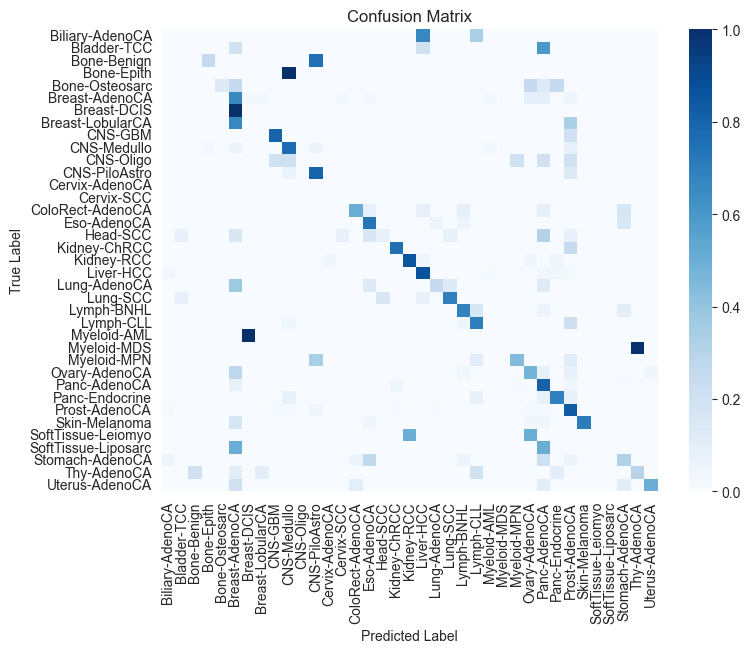

Cervix-AdenoCA: Accuracy = nan
Cervix-SCC: Accuracy = nan
Liver-HCC: Accuracy = 0.8709677419354839
Kidney-RCC: Accuracy = 0.8571428571428572
Prost-AdenoCA: Accuracy = 0.8333333333333334
Panc-AdenoCA: Accuracy = 0.8076923076923077
CNS-GBM: Accuracy = 0.8
CNS-PiloAstro: Accuracy = 0.8
CNS-Medullo: Accuracy = 0.7631578947368421
Kidney-ChRCC: Accuracy = 0.75
Eso-AdenoCA: Accuracy = 0.7368421052631579
Skin-Melanoma: Accuracy = 0.7083333333333335
Lymph-CLL: Accuracy = 0.6956521739130435
Lung-SCC: Accuracy = 0.6923076923076923
Panc-Endocrine: Accuracy = 0.6923076923076923
Lymph-BNHL: Accuracy = 0.6842105263157896
Breast-AdenoCA: Accuracy = 0.6590909090909091
Uterus-AdenoCA: Accuracy = 0.5
ColoRect-AdenoCA: Accuracy = 0.4999999999999999
Ovary-AdenoCA: Accuracy = 0.48
Myeloid-MPN: Accuracy = 0.4444444444444445
Stomach-AdenoCA: Accuracy = 0.31578947368421056
Thy-AdenoCA: Accuracy = 0.3
Lung-AdenoCA: Accuracy = 0.25
Bone-Osteosarc: Accuracy = 0.125
Head-SCC: Accuracy = 0.07692307692307693
Biliary

D:\PycharmProjects\Molecular_ML\venv\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


In [3]:
acc_wgs_pcawg_96 = train_test_evaluate(catalogs_wgs_pcawg.iloc[:, 2:].T, wgs_cancer_types,each_acc=True)

In [4]:
print(f"Accuracy on full wgs count dataset:{acc_wgs_pcawg_96}")

Accuracy on full wgs count dataset:0.6474820143884892


We can observe that the accuracy of the model for each label is heavily influenced by the sample sizes, as the distribution of samples in both the original dataset and the test set is uneven. For cancer types with larger sample sizes, such as Liver-HCC, Kidney-RCC, Prost-AdenoCA, the prediction accuracy can reach over 80%. The model shows an accuracy of 0 for 13 cancer types out of the 37 (including two cancer types that do not exist at all in the test set), as these cancer types have very few samples in the test set. The uneven distribution of labels has a significant impact on the model's performance. Therefore, it might be beneficial to exclude cancer types with too few samples and retrain the model.

### Catalog WES TCGA

In [5]:
# dataset 2: wes tcga counts
catalogs_wes_tcga = pd.read_csv('./project_data/catalogs/WES/WES_TCGA.96.csv')
catalogs_wes_tcga = catalogs_wes_tcga.set_index (catalogs_wes_tcga['Mutation type'] + "_" + catalogs_wes_tcga['Trinucleotide'])
cancer_types_wes = np.array([ s.split(":")[0] for s in catalogs_wes_tcga.columns[2:] ])
catalogs_wes_tcga.head()
unique_elements, counts = np.unique(cancer_types_wes,return_counts=True)
unique_elements,counts

(array(['AML', 'Adrenal-neoplasm', 'Biliary-AdenoCa', 'Breast-cancer',
        'CNS-GBM', 'Cervix-CA', 'ColoRect-AdenoCa', 'DLBC', 'Eso-AdenoCa',
        'Eye-Melanoma', 'Head-SCC', 'Kidney-ChRCC', 'Kidney-Papillary',
        'Kidney-RCC', 'Liver-HCC', 'Lung-AdenoCa', 'Lung-SCC',
        'Lymph-BNHL', 'Mesothelium-Mesothelioma', 'Ovary-AdenoCa',
        'Panc-AdenoCa', 'Pheochromocytoma', 'Prost-AdenoCa', 'Sarcoma',
        'Skin-Melanoma', 'Stomach-AdenoCa', 'Testis-Ca', 'Thy-AdenoCa',
        'Thymoma', 'Transitional-cell-carcinoma', 'UCS', 'Uterus-AdenoCa'],
       dtype='<U27'),
 array([139,  91,  36, 930, 362, 271, 496, 512, 182,  80, 464,  50, 251,
        334, 311, 528, 427,  31,  82, 385, 174, 182, 484, 208, 412, 401,
        149, 478, 123, 389,  57, 474], dtype=int64))

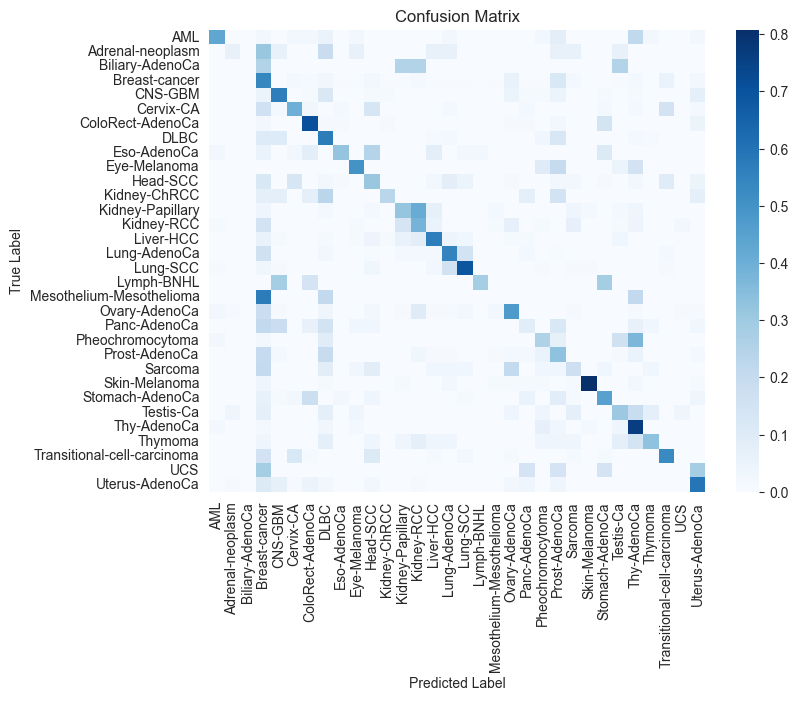

Accuracy on full wes count dataset:0.4928909952606635


In [6]:
# train on full dataset
acc_wes_tcga_96 = train_test_evaluate(catalogs_wes_tcga.iloc[:, 2:].T, cancer_types_wes)
print(f"Accuracy on full wes count dataset:{acc_wes_tcga_96}")

### Activity WGS PCAWG

In [7]:
# dataset 3: wgs activity
activity_wgs_pcawg = pd.read_csv('./project_data/activities/WGS/WGS_PCAWG.activities.csv')
cancer_types_wgs = np.array([ s.split(":")[0] for s in activity_wgs_pcawg.iloc[:,0] ])
unique_elements, counts = np.unique(cancer_types_wgs,return_counts=True)
unique_elements,counts

(array(['Biliary-AdenoCA', 'Bladder-TCC', 'Bone-Benign', 'Bone-Epith',
        'Bone-Osteosarc', 'Breast-AdenoCA', 'Breast-DCIS',
        'Breast-LobularCA', 'CNS-GBM', 'CNS-Medullo', 'CNS-Oligo',
        'CNS-PiloAstro', 'Cervix-AdenoCA', 'Cervix-SCC',
        'ColoRect-AdenoCA', 'Eso-AdenoCA', 'Head-SCC', 'Kidney-ChRCC',
        'Kidney-RCC', 'Liver-HCC', 'Lung-AdenoCA', 'Lung-SCC',
        'Lymph-BNHL', 'Lymph-CLL', 'Myeloid-AML', 'Myeloid-MDS',
        'Myeloid-MPN', 'Ovary-AdenoCA', 'Panc-AdenoCA', 'Panc-Endocrine',
        'Prost-AdenoCA', 'Skin-Melanoma', 'SoftTissue-Leiomyo',
        'SoftTissue-Liposarc', 'Stomach-AdenoCA', 'Thy-AdenoCA',
        'Uterus-AdenoCA'], dtype='<U19'),
 array([ 35,  23,  16,  11,  38, 198,   3,  13,  41, 146,  18,  89,   2,
         18,  60,  98,  57,  45, 144, 326,  38,  48, 107,  95,  11,   4,
         56, 113, 241,  85, 286, 107,  15,  19,  75,  48,  51], dtype=int64))

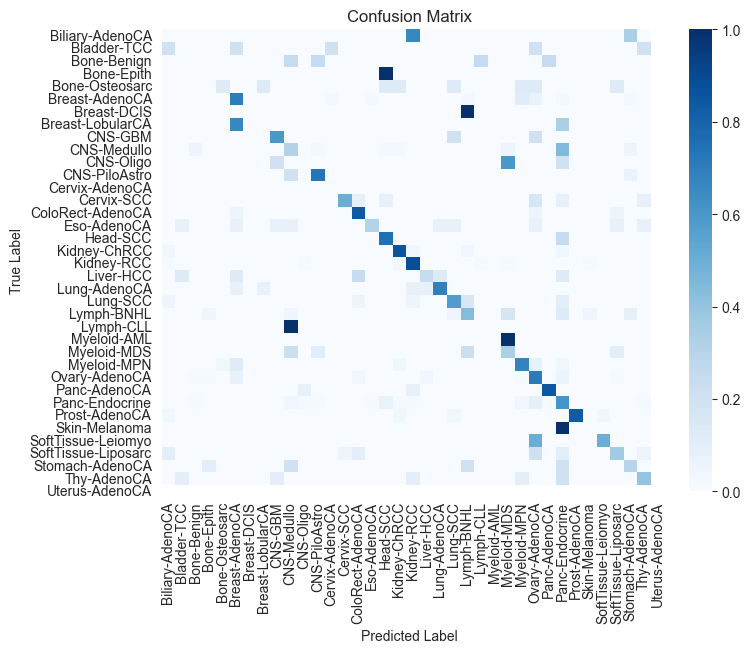

Accuracy on full wgs activity dataset:0.6007194244604317


In [8]:
# train on full dataset
acc_wgs_pcawg_activity = train_test_evaluate(activity_wgs_pcawg.iloc[:,3:], cancer_types_wgs)
print(f"Accuracy on full wgs activity dataset:{acc_wgs_pcawg_activity}")

### Activity WES TCGA

In [9]:
# dataset 4: wes activity
activity_wes_tcga = pd.read_csv('./project_data/activities/WES/WES_TCGA.activities.csv')
cancer_types_wes = np.array([ s.split(":")[0] for s in activity_wes_tcga.iloc[:,0] ])
unique_elements, counts = np.unique(cancer_types_wes,return_counts=True)
unique_elements,counts

(array(['AML', 'Adrenal-neoplasm', 'Biliary-AdenoCa', 'Breast-cancer',
        'CNS-GBM', 'Cervix-CA', 'ColoRect-AdenoCa', 'DLBC', 'Eso-AdenoCa',
        'Eye-Melanoma', 'Head-SCC', 'Kidney-ChRCC', 'Kidney-Papillary',
        'Kidney-RCC', 'Liver-HCC', 'Lung-AdenoCa', 'Lung-SCC',
        'Lymph-BNHL', 'Mesothelium-Mesothelioma', 'Ovary-AdenoCa',
        'Panc-AdenoCa', 'Pheochromocytoma', 'Prost-AdenoCa', 'Sarcoma',
        'Skin-Melanoma', 'Stomach-AdenoCa', 'Testis-Ca', 'Thy-AdenoCa',
        'Thymoma', 'Transitional-cell-carcinoma', 'UCS', 'Uterus-AdenoCa'],
       dtype='<U27'),
 array([139,  91,  36, 930, 362, 271, 496, 512, 182,  80, 464,  50, 251,
        334, 311, 528, 427,  31,  82, 385, 174, 182, 484, 208, 412, 401,
        149, 478, 123, 389,  57, 474], dtype=int64))

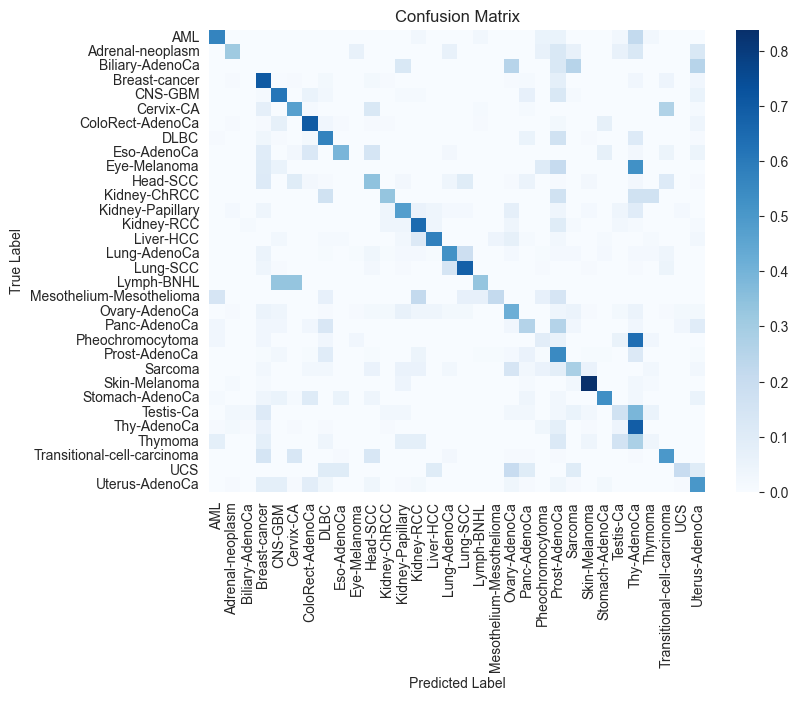

Accuracy on full wes activity dataset:0.5260663507109005


In [10]:
# train on full dataset
acc_wes_tcga_activity = train_test_evaluate(activity_wes_tcga.iloc[:, 3:], cancer_types_wes)
print(f"Accuracy on full wes activity dataset:{acc_wes_tcga_activity}")

## GradientBoosting Classfier Results

In [11]:
print("Catalog WGS PCAWG: ",acc_wgs_pcawg_96)
print("Catalog WES TCGA: ",acc_wes_tcga_96)
print("Activity WGS PCAWG: ",acc_wgs_pcawg_activity)
print("Activity WES TCGA: ",acc_wes_tcga_activity)
df = pd.DataFrame({'WGS_PCAWG':[acc_wgs_pcawg_96,acc_wgs_pcawg_activity],'WES_TCGA':[acc_wes_tcga_96,acc_wes_tcga_activity],'index':['catalog','activity']})
df = df.set_index('index')
df

Catalog WGS PCAWG:  0.6474820143884892
Catalog WES TCGA:  0.4928909952606635
Activity WGS PCAWG:  0.6007194244604317
Activity WES TCGA:  0.5260663507109005


,WGS_PCAWG,WES_TCGA
index,,
catalog,0.647482,0.492891
activity,0.600719,0.526066


The Catalog WGS PCAWG dataset has the best performance among all, so we continue our exploration on this dataset.

## Exploration on Catalog WGS PCAWG Dataset
### Filter Data
As mentioned earlier, the uneven distribution of cancer types has a significant impact on the model's performance. So we try to exclude cancer types with too few samples(<15) and retrain the model.

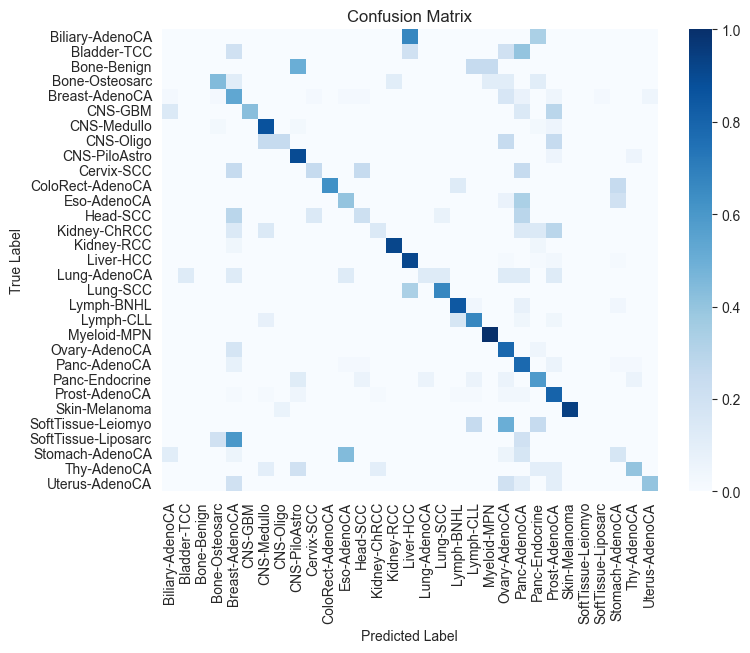

Accuracy on filtered catalog wgs pcage dataset:0.666058394160584


In [12]:
# cancer types with sample size <= 15
labels_to_keep = unique_elements_wgs[counts_wgs>=15]
# bool array indicating if corresponding column need to be kept
is_in_labels_to_keep = np.isin(wgs_cancer_types,labels_to_keep)
filtered_catalogs_wgs_pcawg = catalogs_wgs_pcawg.iloc[:,2:].loc[:,is_in_labels_to_keep]
# new labels
labels = np.array([ s.split(":")[0] for s in filtered_catalogs_wgs_pcawg.columns ])
acc_filtered_wgs_pcawg_96 = train_test_evaluate(filtered_catalogs_wgs_pcawg.T, labels)
print(f"Accuracy on filtered catalog wgs pcage dataset:{acc_filtered_wgs_pcawg_96}")

Compared to previous 0.647482, the accuracy slightly increases. Next, we explore the importance of different mutation channels.
## Feature Importance on All 96 Mutation Channels

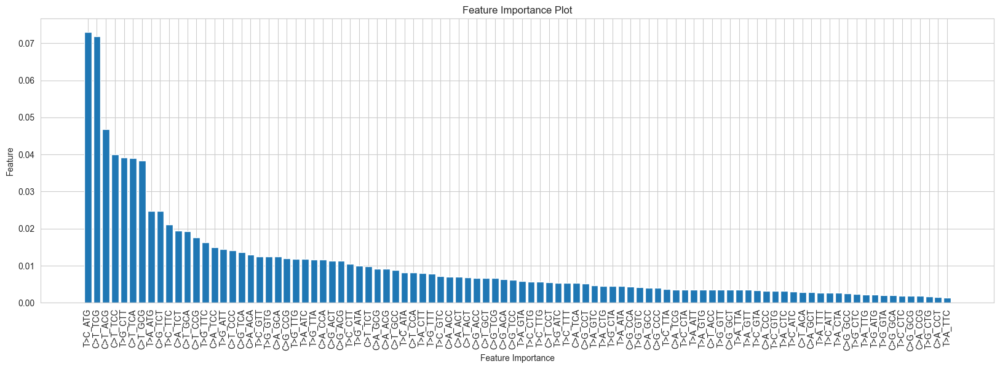

In [13]:
# X_train, X_test, y_train, y_test = train_test_split(filtered_catalogs_wgs_pcawg.T, labels,random_state=42,train_size=0.8)
# Create a Gradient Boosting Classifier
clf = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
clf.fit(filtered_catalogs_wgs_pcawg.T, labels)
feature_importance = clf.feature_importances_
feature_df = pd.DataFrame({'Feature': filtered_catalogs_wgs_pcawg.T.columns, 'Importance': feature_importance})
feature_df = feature_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(20, 6))
plt.bar(feature_df['Feature'], feature_df['Importance'])
plt.xlabel('Feature Importance')
plt.xticks(rotation=90)
plt.ylabel('Feature')
plt.title('Feature Importance Plot')
plt.show()

It seems that the T>C ATG channel stands out as the most influential channel based on feature importance. However, among the top 10 channels, five of them belong to the C>T channel. This outcome might lack clarity, prompting us to perform feature dimensionality reduction to six channels. Then, we will retrain the model and observe its feature importance on the reduced six channels.

### Feature Reduction

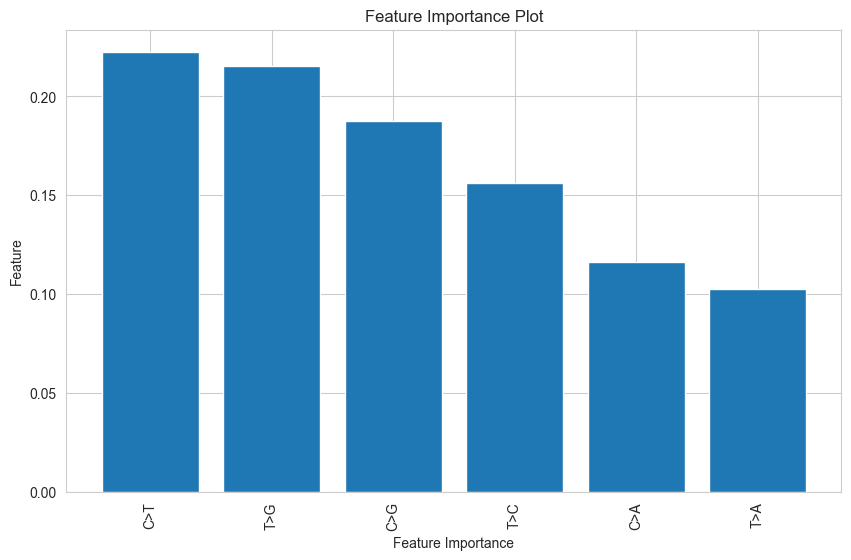

In [14]:
reduction_df = filtered_catalogs_wgs_pcawg.copy()
reduction_df['Mutation type'] = catalogs_wgs_pcawg['Mutation type']
reduction_df = reduction_df.groupby('Mutation type').sum()
# X_train, X_test, y_train, y_test = train_test_split(reduction_df.T, labels,random_state=42,train_size=0.8)
# Create a Gradient Boosting Classifier
clf = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
clf.fit(reduction_df.T, labels)
feature_importance = clf.feature_importances_
feature_df = pd.DataFrame({'Feature': reduction_df.T.columns, 'Importance': feature_importance})
feature_df = feature_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(10, 6))
plt.bar(feature_df['Feature'], feature_df['Importance'])
plt.xlabel('Feature Importance')
plt.xticks(rotation=90)
plt.ylabel('Feature')
plt.title('Feature Importance Plot')
plt.show()

From the six channels, it seems that the C>T channel is the most crucial, while the T>A channel is the least important.

## Train on Combined Activity and Catalog Dataset
We combine the catalog data and activity data of wgs to see if we can achieve higher accuracy
### WGS PCAWG

In [15]:
activity = activity_wgs_pcawg.copy()
activity['Sample']=activity_wgs_pcawg['Cancer Types']+'::'+activity_wgs_pcawg['Sample Names']
activity = activity.set_index('Sample').iloc[:,3:]
catalog = catalogs_wgs_pcawg.iloc[:,2:].T
activity_catalog = pd.concat([catalog,activity],axis=1)
activity_catalog.head()

,C>A_ACA,C>A_ACC,C>A_ACG,C>A_ACT,C>A_CCA,C>A_CCC,C>A_CCG,C>A_CCT,C>A_GCA,C>A_GCC,...,SBS51,SBS52,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60
Biliary-AdenoCA::SP117655,269,148,25,154,215,148,27,180,165,76,...,0,0,0,0,0,0,0,0,0,0
Biliary-AdenoCA::SP117556,114,56,13,70,63,49,7,69,81,37,...,0,0,0,0,0,0,0,0,0,0
Biliary-AdenoCA::SP117627,105,71,13,73,71,55,8,61,61,50,...,0,0,0,0,0,0,0,0,0,0
Biliary-AdenoCA::SP117775,217,123,29,126,129,82,26,143,162,84,...,0,0,0,0,0,0,0,0,0,0
Biliary-AdenoCA::SP117332,52,36,8,31,30,22,10,38,21,25,...,0,0,0,0,0,0,0,0,0,0


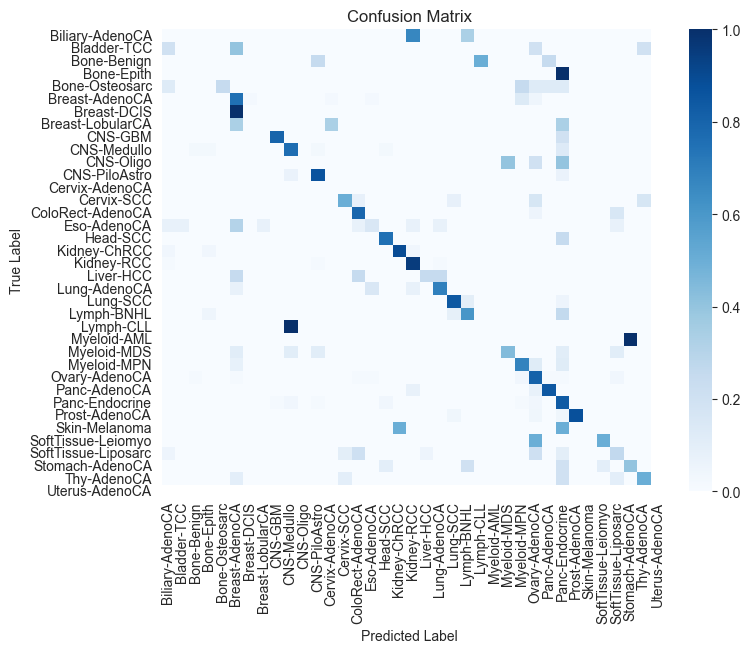

Accuracy on the combined WGS dataset of activity and catalog:  0.6960431654676259


In [16]:
activity_catalog_labels = np.array([ s.split(":")[0] for s in activity_catalog.index ])
acc = train_test_evaluate(activity_catalog,activity_catalog_labels)
print("Accuracy on the combined WGS dataset of activity and catalog: ",acc)

Combining the two datasets resulted in an increase in features to 161, including 96 channels and 65 signatures. In comparison to the performance on the activity dataset and catalog dataset individually (0.60 and 0.647, respectively), the merged dataset shows a 5% improvement in accuracy.

## Combined WES TCGA

In [17]:
activity = activity_wes_tcga.copy()
activity['Sample']=activity_wes_tcga['Cancer Types']+'::'+activity_wes_tcga['Sample Names']
activity = activity.set_index('Sample').iloc[:,3:]
catalog = catalogs_wes_tcga.iloc[:,2:].T
activity_catalog = pd.concat([catalog,activity],axis=1)
activity_catalog.head()

,C>A_ACA,C>A_ACC,C>A_ACG,C>A_ACT,C>A_CCA,C>A_CCC,C>A_CCG,C>A_CCT,C>A_GCA,C>A_GCC,...,SBS51,SBS52,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60
AML::TCGA-AB-2802-03B-01W-0728-08,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AML::TCGA-AB-2803-03B-01W-0728-08,0,2,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AML::TCGA-AB-2804-03B-01W-0728-08,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AML::TCGA-AB-2805-03B-01W-0728-08,0,0,0,1,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AML::TCGA-AB-2806-03B-01W-0728-08,4,0,3,2,20,18,10,19,6,8,...,0,0,0,0,0,0,0,0,0,0


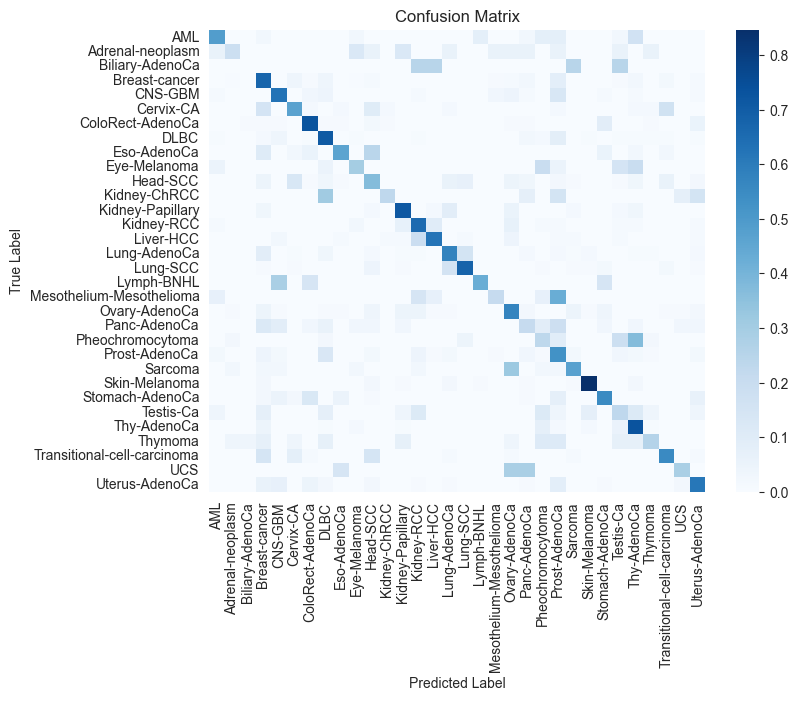

Accuracy on the combined WES dataset of activity and catalog:  0.5771458662453923


In [18]:
activity_catalog_labels = np.array([ s.split(":")[0] for s in activity_catalog.index ])
acc = train_test_evaluate(activity_catalog,activity_catalog_labels)
print("Accuracy on the combined WES dataset of activity and catalog: ",acc)

In comparison to the performance separate dataset (0.49 and 0.52, respectively), there is also some improvement on the merged WES dataset.

# Evaluation of models

We record the optimal observed fitting accuracy as below:

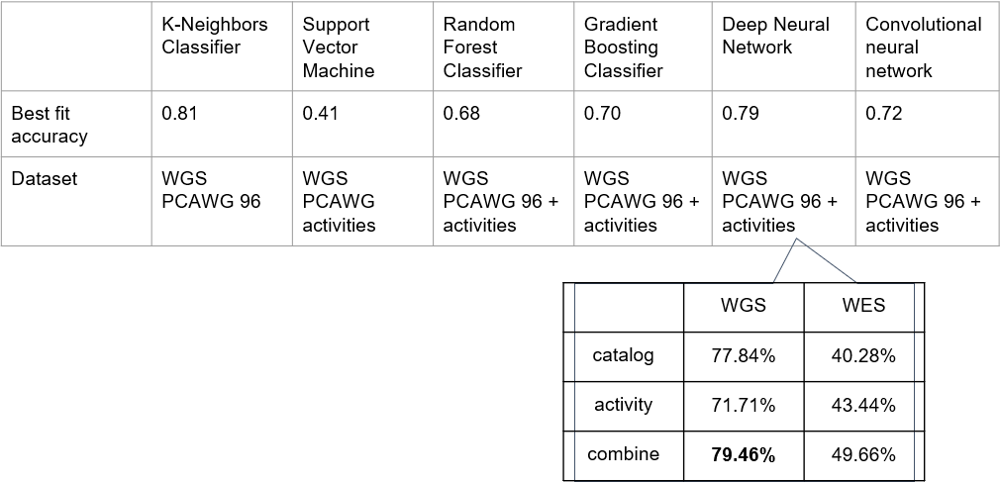

1. We applied generally a 80-20 ratio in train-test split with stratification. For each model, we store the best observed testing accuracy and the dataset on which it was trained. We observed improved performance when combining the mutational channels and activities, compared against training totally on mutational channels.

2. We observed that deep learning methods such as deep neural networks generally make more accurate prediction than ML methods like SVM and random forest. The accuracy is further improved by adding regularization techniques during the training, such as dropout used in DNN.

3. We observed that conducting normalisation generally improves fitting accuracy.


Limitations:
1. When we use KNN methods, we studied the confusion matrix (True cancer type - Predicted cancer type) and found that the prediction is biased toward AdenoCA. However, we didn't explore the confusion matrix of the sites of the cancer (i.e. breast or head). It could be better considering both the cancer type and the cancer site to obtain more reasonable conclusions.
2. We normalised the data by mean and standard deviation. It could be better to try out other methods, such as normalising by median and mean absolute deviation (which has been proved better in many scenarios).
3. We did not adjust the hyperparameters of the SVM, which is one of the reasons why it did not perform well. We can use Bayesian search to optimise the hyperparameters.
4. We should have found more explainable methods.